<h1><b><i>SmartRail: Real-Time Predictive Maintenance Dashboard</b></h1>

# 1. Import Necessary Libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.filters.hp_filter import hpfilter
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.api import VAR
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from statsmodels.tsa.ar_model import AutoReg
from statsmodels.tsa.statespace.sarimax import SARIMAX
from pmdarima import auto_arima
from sklearn.metrics import (mean_squared_error, mean_absolute_percentage_error,mean_absolute_error, r2_score)
from statsmodels.tsa.holtwinters import SimpleExpSmoothing as SES
from statsmodels.tsa.holtwinters import Holt
import warnings
from matplotlib import rcParams
from statsmodels.tsa.statespace.varmax import VARMAX

warnings.filterwarnings("ignore")


# 2. Read and Display Data

In [2]:
df=pd.read_csv("labeled_data.csv",index_col=0,parse_dates=True)

In [3]:
df.head()

,TP2,TP3,H1,DV_pressure,Reservoirs,Oil_temperature,Motor_current,DV_eletric,COMP,Towers,MPG,LPS,Pressure_switch,Oil_level,Caudal_impulses,status
timestamp_minute,,,,,,,,,,,,,,,,
2020-04-17 00:00:00,-0.013,9.307,9.296,-0.024,9.306,60.471,0.042,0,1,1,1,0,1,1,1,0
2020-04-17 00:01:00,-0.013,9.224,9.212,-0.023,9.222,59.300,0.042,0,1,1,1,0,1,1,1,0
2020-04-17 00:02:00,-0.014,9.142,9.130,-0.023,9.141,58.604,0.042,0,1,1,1,0,1,1,1,0
2020-04-17 00:03:00,-0.014,9.062,9.050,-0.024,9.062,58.075,0.042,0,1,1,1,0,1,1,1,0
2020-04-17 00:04:00,-0.014,8.981,8.969,-0.025,8.982,57.554,0.042,0,1,1,1,0,1,1,1,0


# 3. Useful ploting and Validation functions

In [10]:
def validate(test_df, pred_df, var):
    pred_res = pred_df[f'{var}_Forecast'] 
    test_res = test_df[var]
    
    mse = mean_squared_error(test_res, pred_res)
    rmse = mean_squared_error(test_res, pred_res, squared=False)
    mae = mean_absolute_error(test_res, pred_res)
    mape = mean_absolute_percentage_error(test_res, pred_res)
    
    print("mse={:.3f}, rmse={:.3f}, mae={:.3f}, mape={:.3f}".format(mse, rmse, mae, mape))
    
    return mse, rmse, mae, mape

In [11]:
def plot_and_validate(train_df, test_df, pred_df, var):
    # Plot the Train data with the timestamp (x-axis)
    plt.figure(figsize=(10, 6))
    plt.plot(train_df.index, train_df[var], label='Train', linewidth=2, color='blue')

    # Plot the Test data with the timestamp (x-axis)
    plt.plot(test_df.index, test_df[var], label='Test', linewidth=2, color='green')

    # Plot the Forecast data with the timestamp (x-axis)
    plt.plot(pred_df.index, pred_df[f'{var}_Forecast'], label='Forecast', linewidth=2, color='red')

    # Validate predictions (error metrics)
    validate(test_df, pred_df, var)

    # Set the title and labels for the axes
    plt.title(f"Forecast vs Actual for {var}")
    plt.xlabel("Timestamp")
    plt.ylabel(f"{var} Value")

    # Add a legend
    plt.legend()

    # Show the plot
    plt.show()


# 4. ETS Decomposition -Decompose the data into trend and seasonality

<Figure size 1500x800 with 0 Axes>

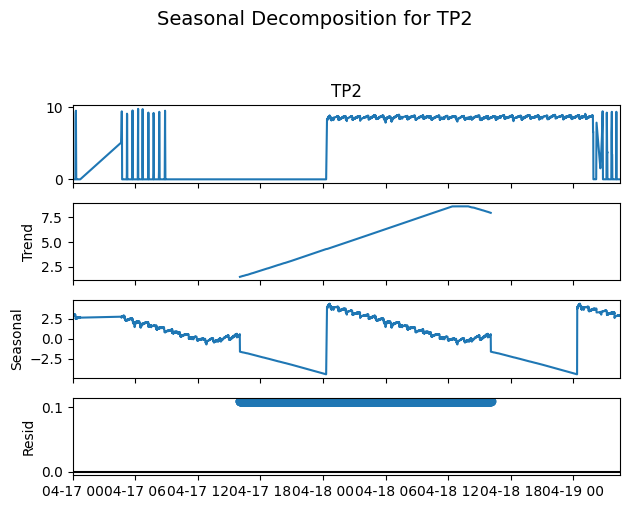

<Figure size 1500x800 with 0 Axes>

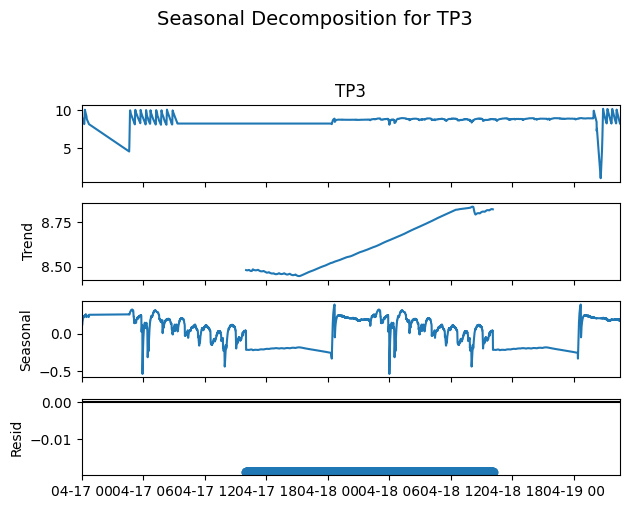

<Figure size 1500x800 with 0 Axes>

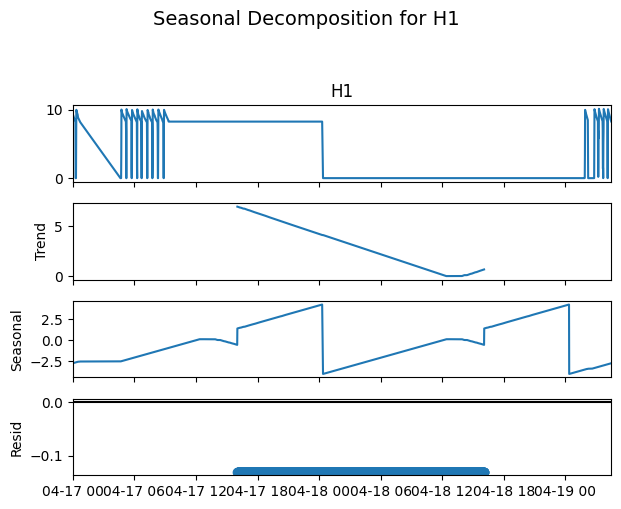

<Figure size 1500x800 with 0 Axes>

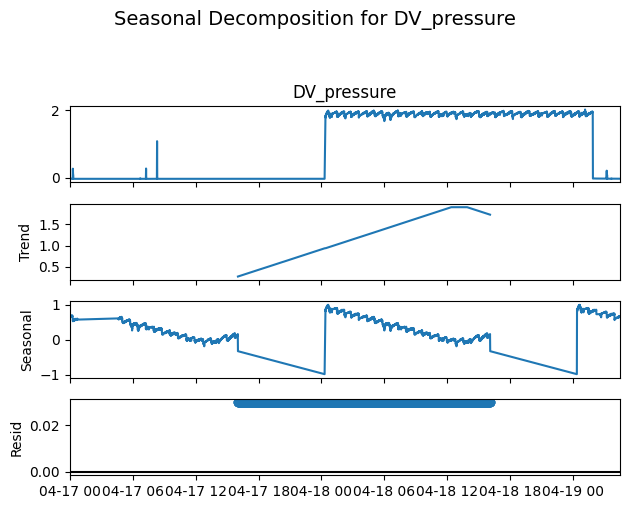

<Figure size 1500x800 with 0 Axes>

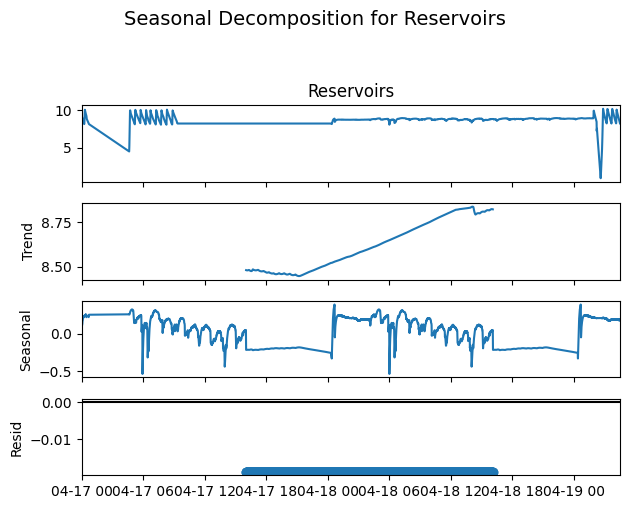

<Figure size 1500x800 with 0 Axes>

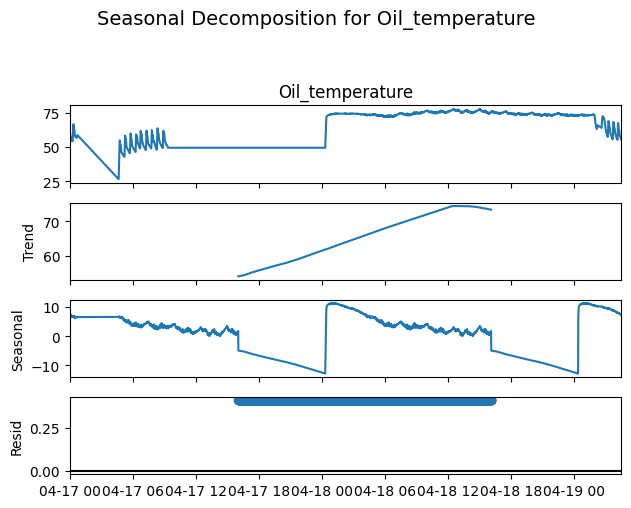

<Figure size 1500x800 with 0 Axes>

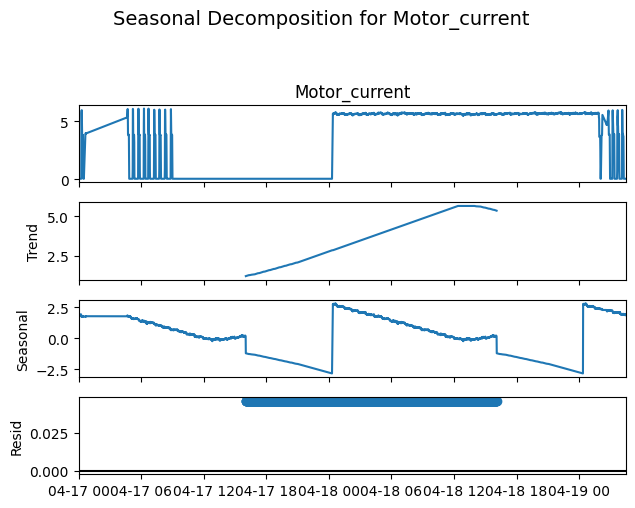

<Figure size 1500x800 with 0 Axes>

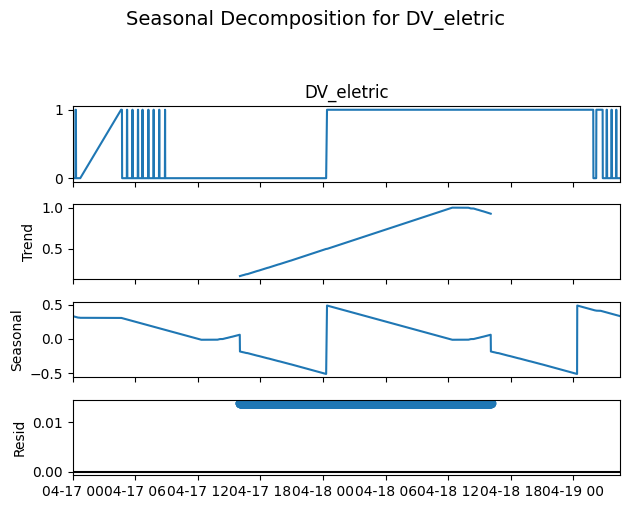

<Figure size 1500x800 with 0 Axes>

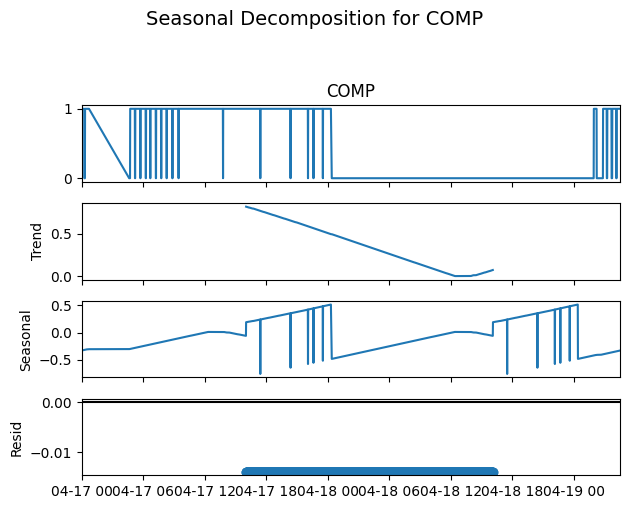

<Figure size 1500x800 with 0 Axes>

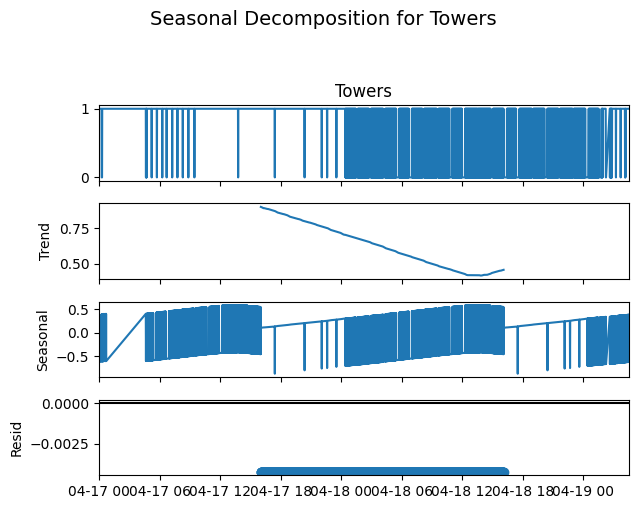

<Figure size 1500x800 with 0 Axes>

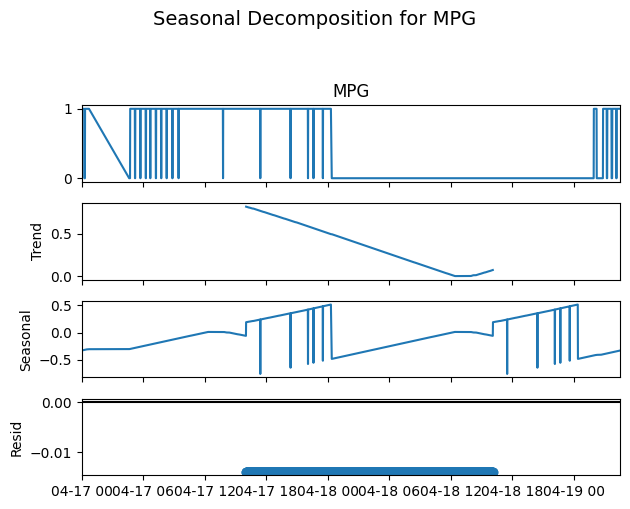

<Figure size 1500x800 with 0 Axes>

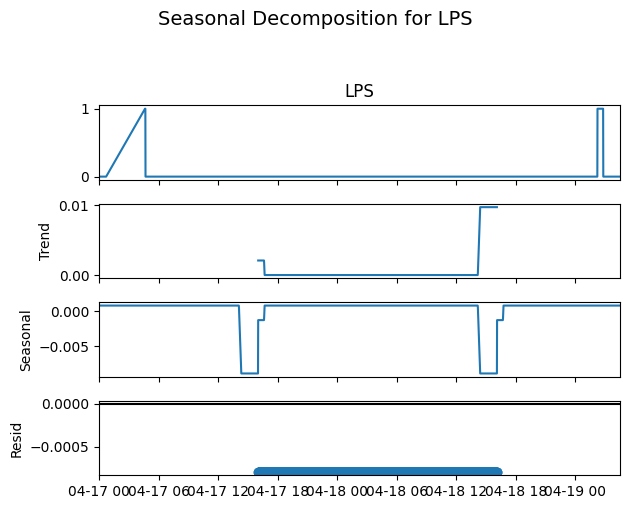

<Figure size 1500x800 with 0 Axes>

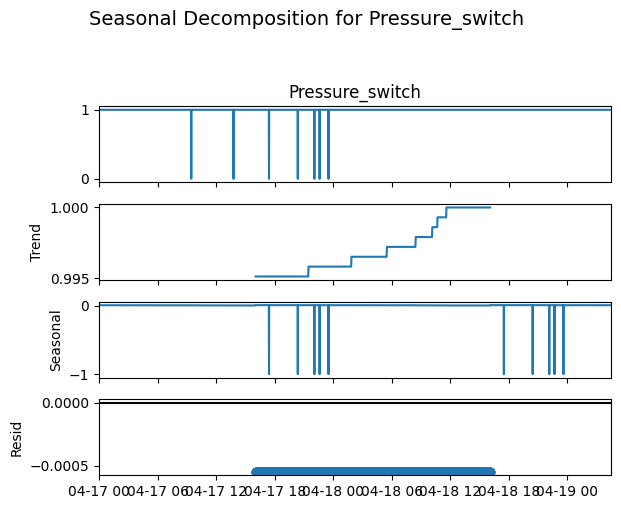

<Figure size 1500x800 with 0 Axes>

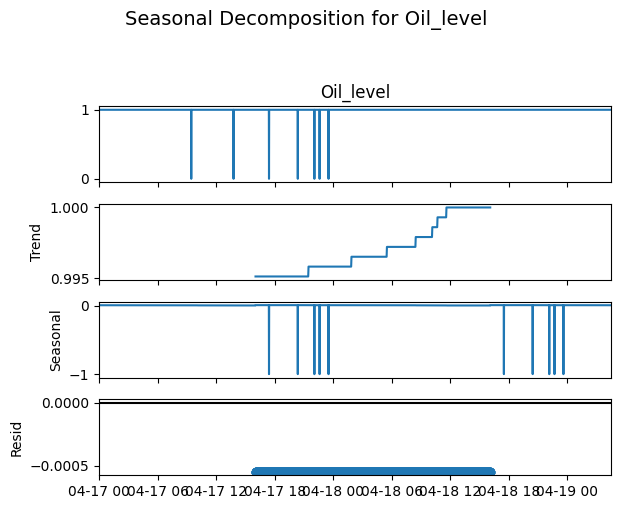

<Figure size 1500x800 with 0 Axes>

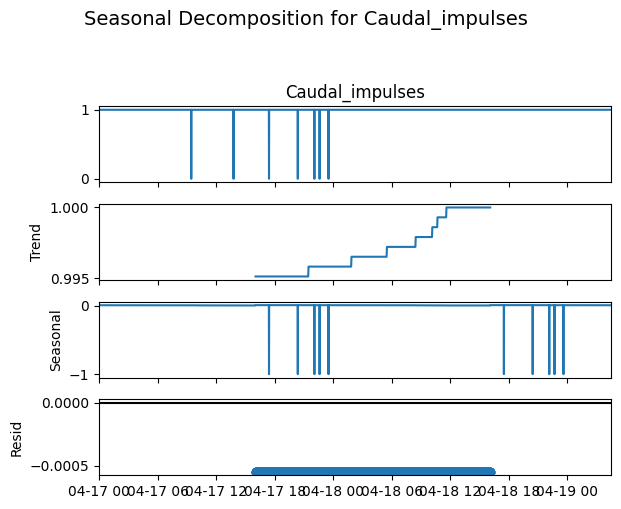

<Figure size 1500x800 with 0 Axes>

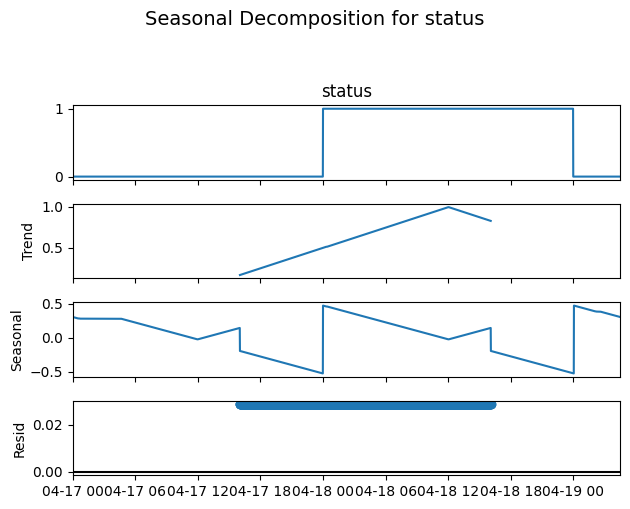

In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose
import matplotlib.pyplot as plt

# columns_to_plot = ['TP2', 'TP3', 'H1', 'DV_pressure', 'Reservoirs', 'Oil_temperature', 'Motor_current']

for col in df.columns:
    subset_data = df[col].iloc[:2880]
    # daily sea
    period = 1440  
    result = seasonal_decompose(subset_data, model='additive', period=period)
    
    plt.figure(figsize=(15, 8))  
    result.plot()
    
    plt.suptitle(f"Seasonal Decomposition for {col}", fontsize=14, y=1.05)  # Smaller title with adjustment
    
    plt.tight_layout()
    
    plt.show()


<Figure size 1500x800 with 0 Axes>

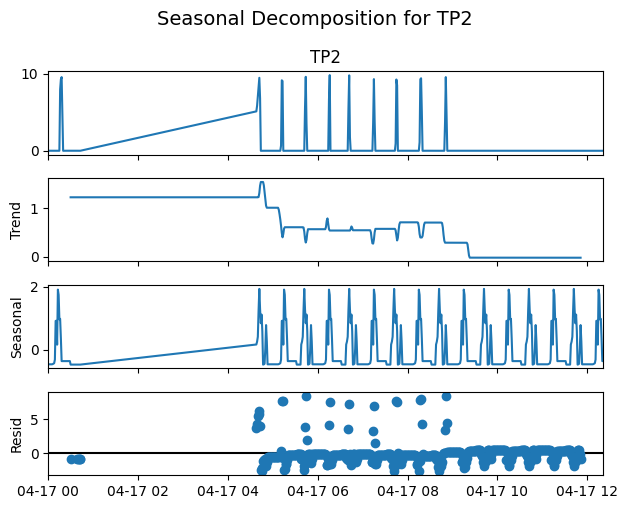

<Figure size 1500x800 with 0 Axes>

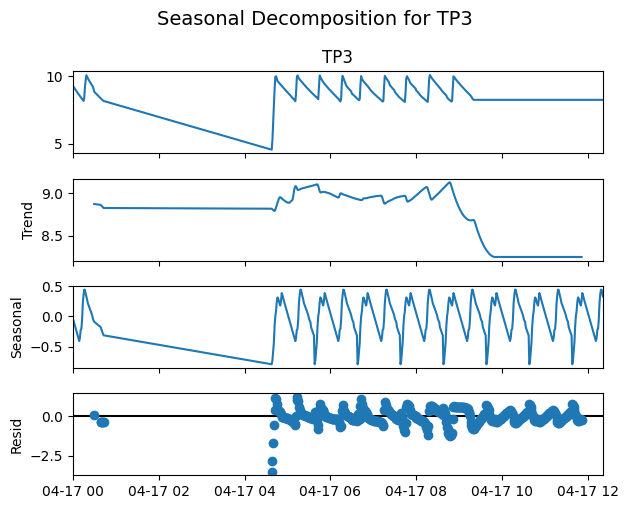

<Figure size 1500x800 with 0 Axes>

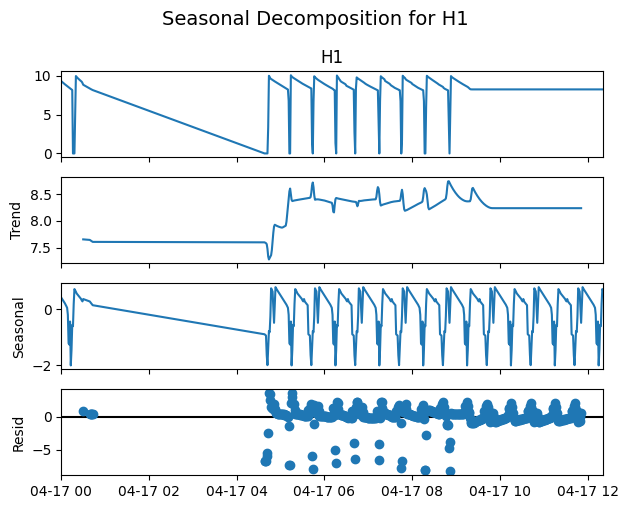

<Figure size 1500x800 with 0 Axes>

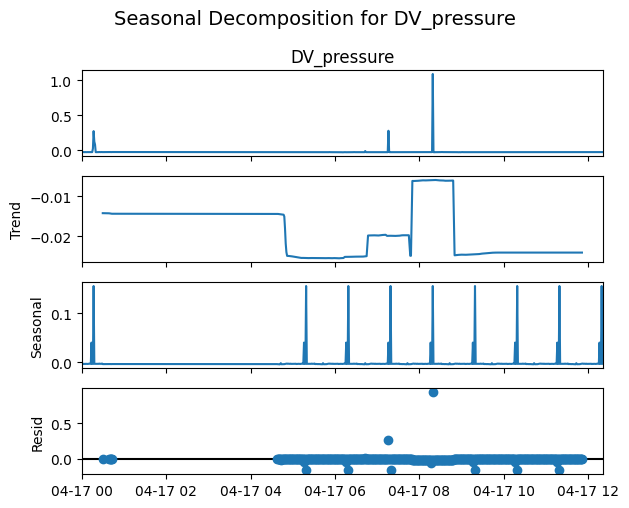

<Figure size 1500x800 with 0 Axes>

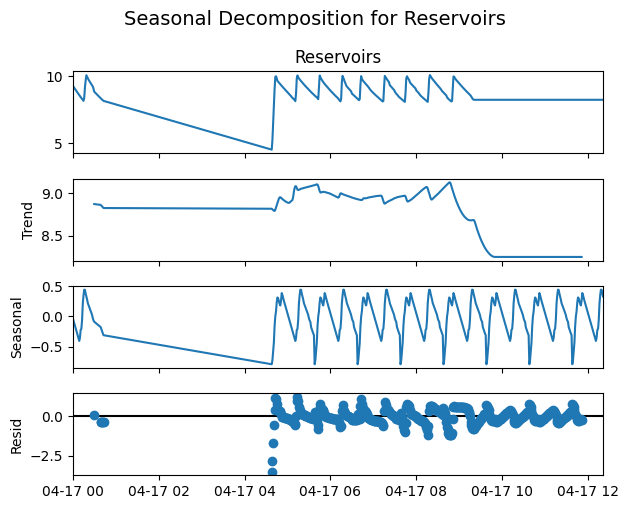

<Figure size 1500x800 with 0 Axes>

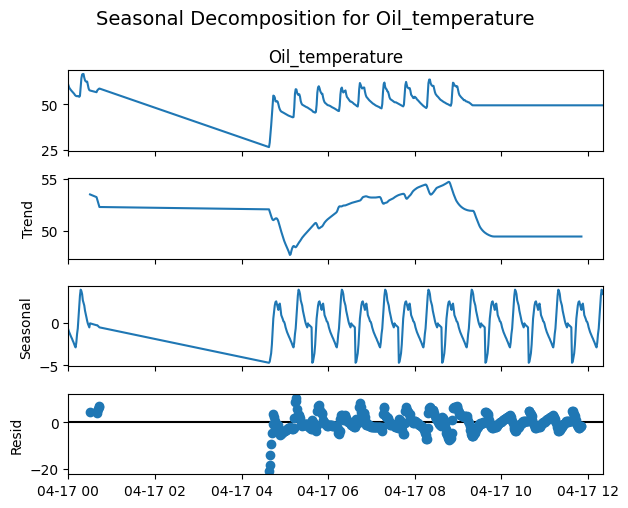

<Figure size 1500x800 with 0 Axes>

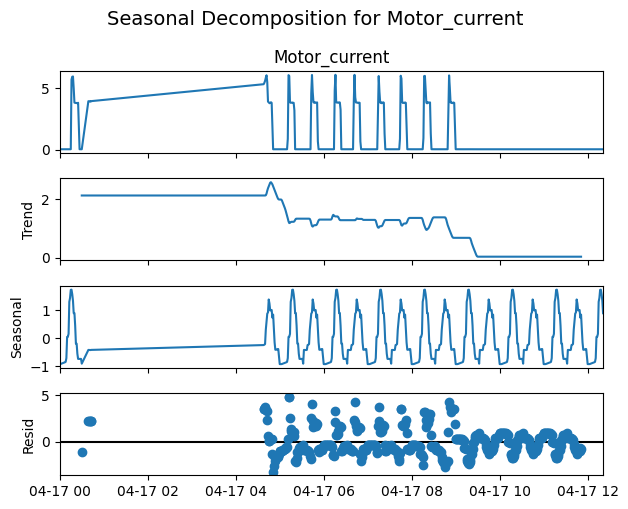

<Figure size 1500x800 with 0 Axes>

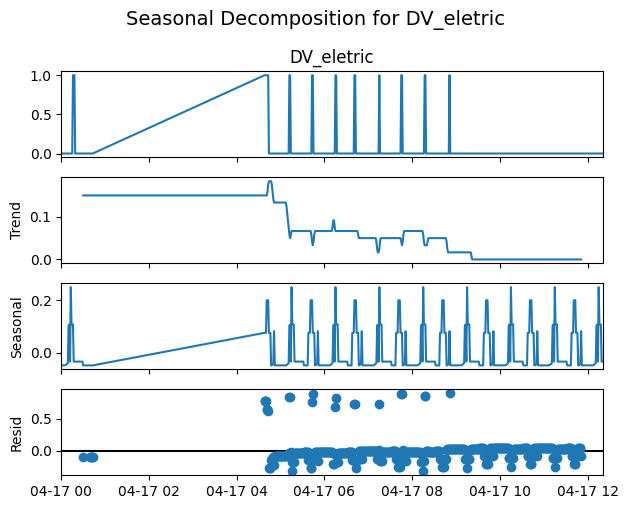

<Figure size 1500x800 with 0 Axes>

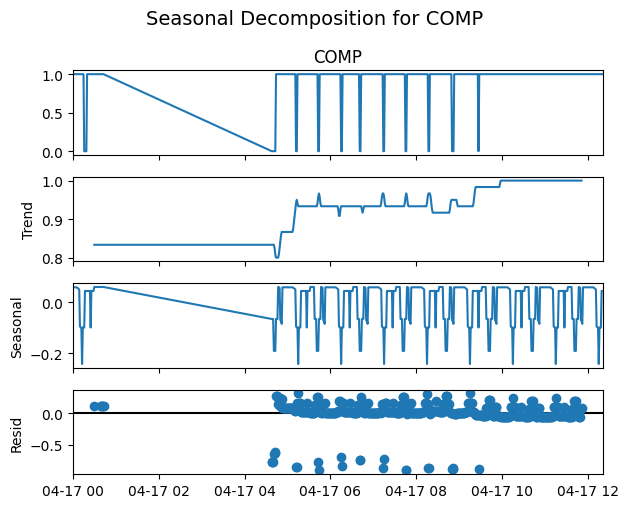

<Figure size 1500x800 with 0 Axes>

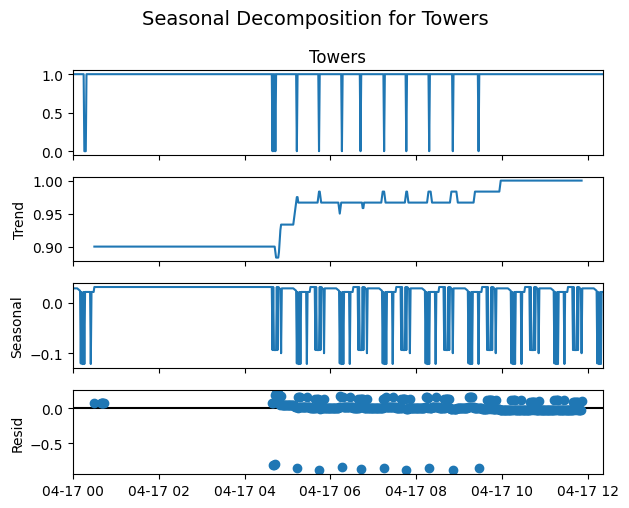

<Figure size 1500x800 with 0 Axes>

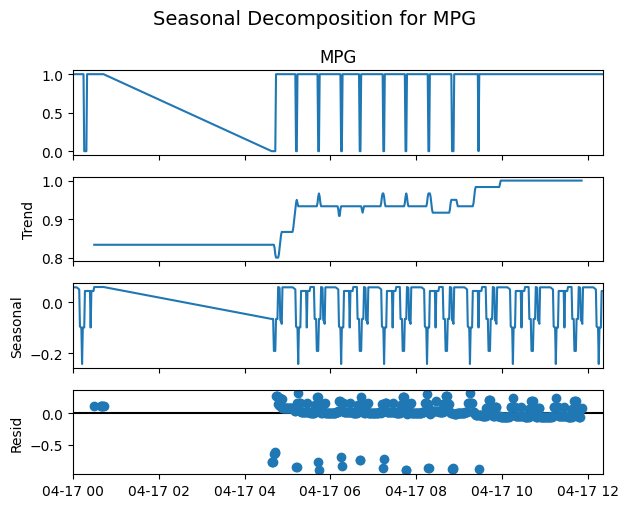

<Figure size 1500x800 with 0 Axes>

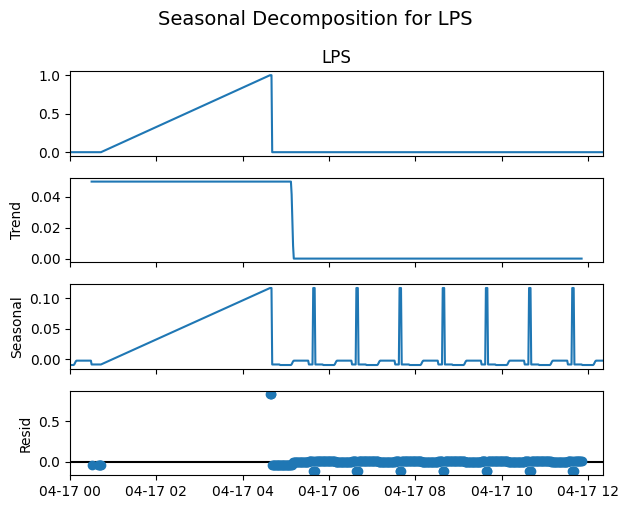

<Figure size 1500x800 with 0 Axes>

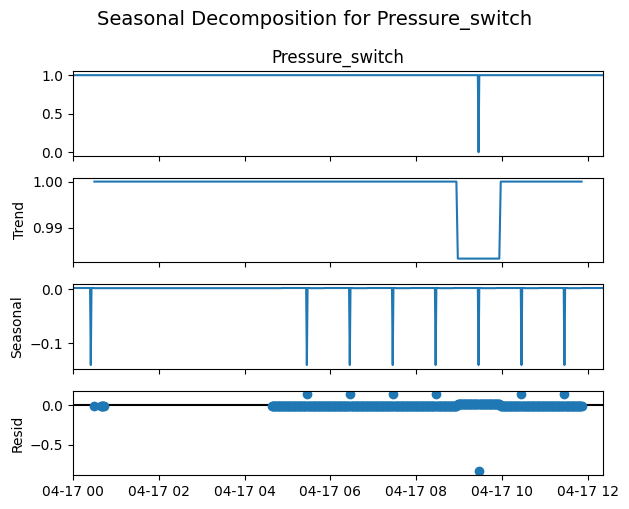

<Figure size 1500x800 with 0 Axes>

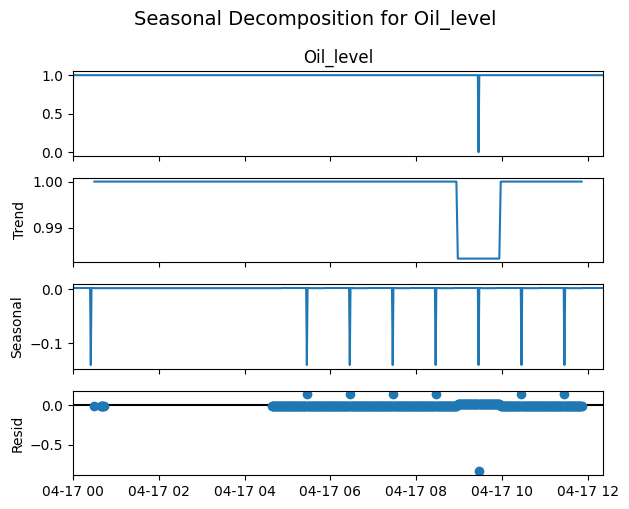

<Figure size 1500x800 with 0 Axes>

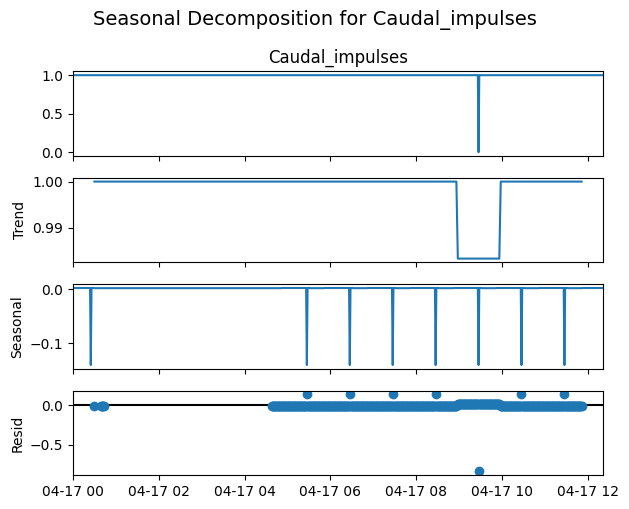

<Figure size 1500x800 with 0 Axes>

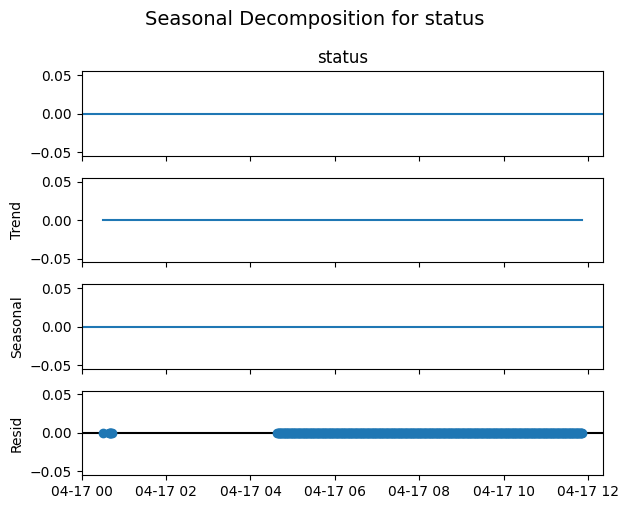

In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose
import matplotlib.pyplot as plt

for col in df.columns:

    subset_data = df[col].iloc[:500]
    # minutely
    period = 60 
    result = seasonal_decompose(subset_data, model='additive', period=period)
    
    plt.figure(figsize=(15, 8))  
    result.plot()
    
    plt.suptitle(f"Seasonal Decomposition for {col}", fontsize=14, y=1.05)  # Smaller title with adjustment

    plt.show()


# 5. Detrending

<h2>Identify trend

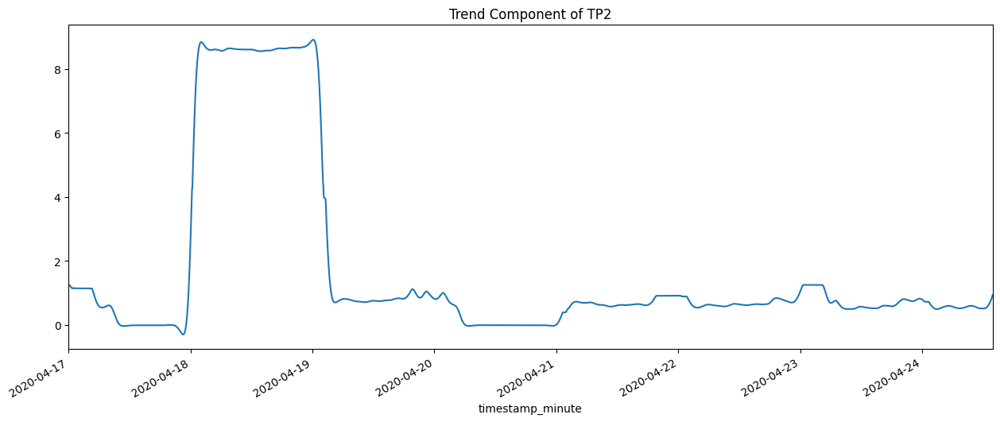

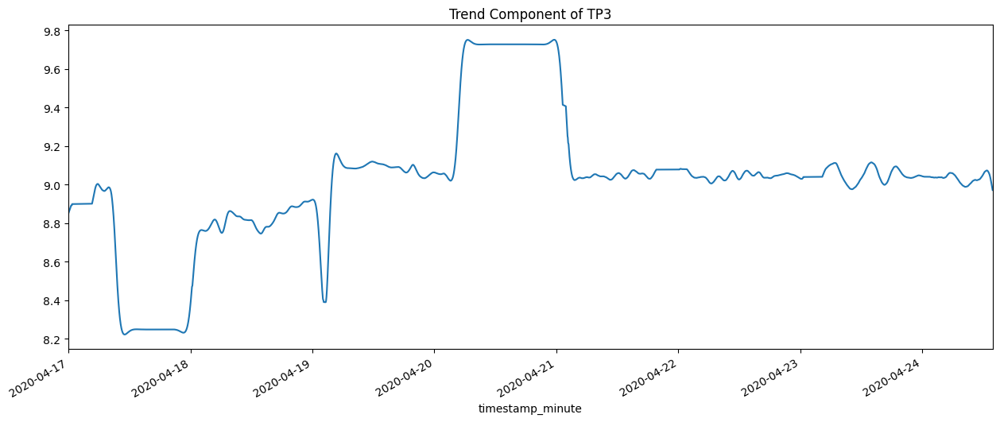

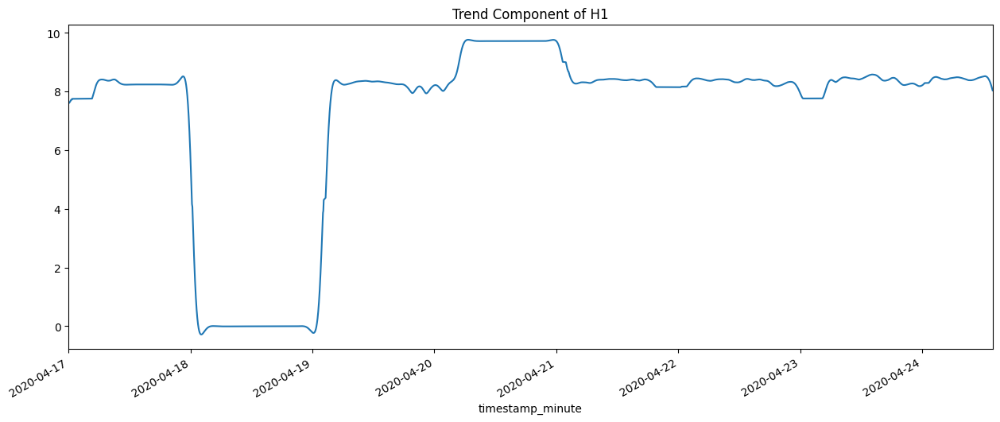

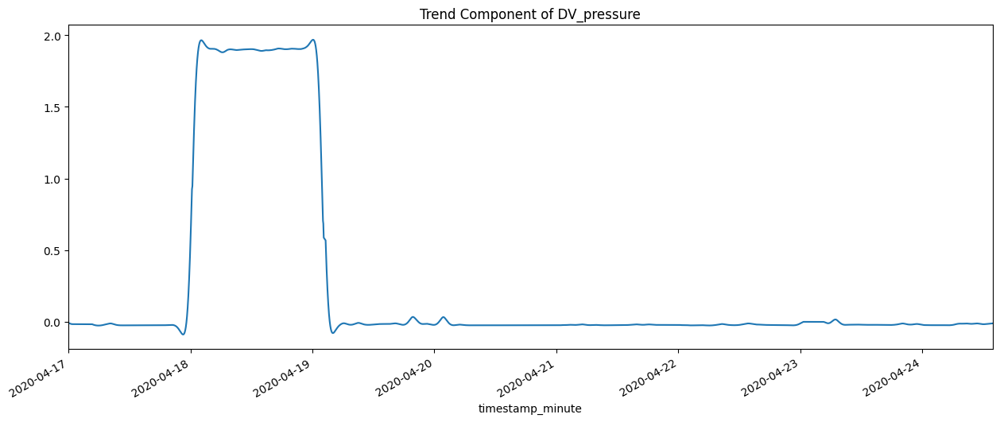

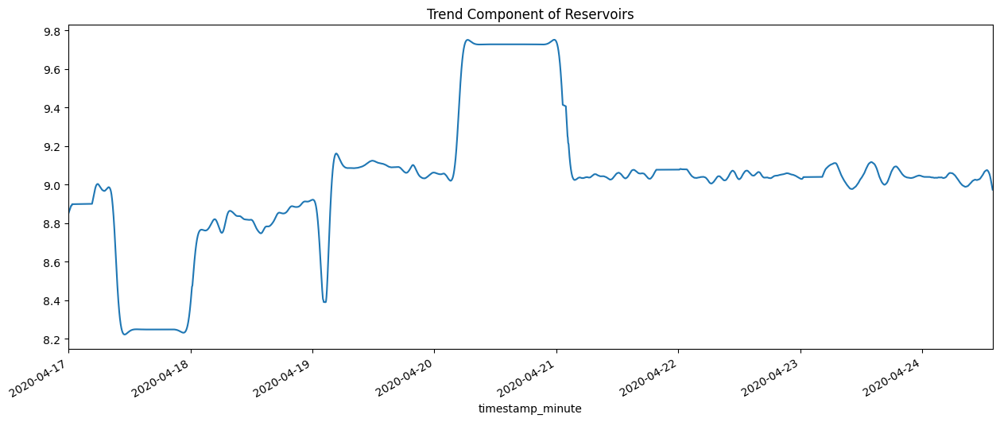

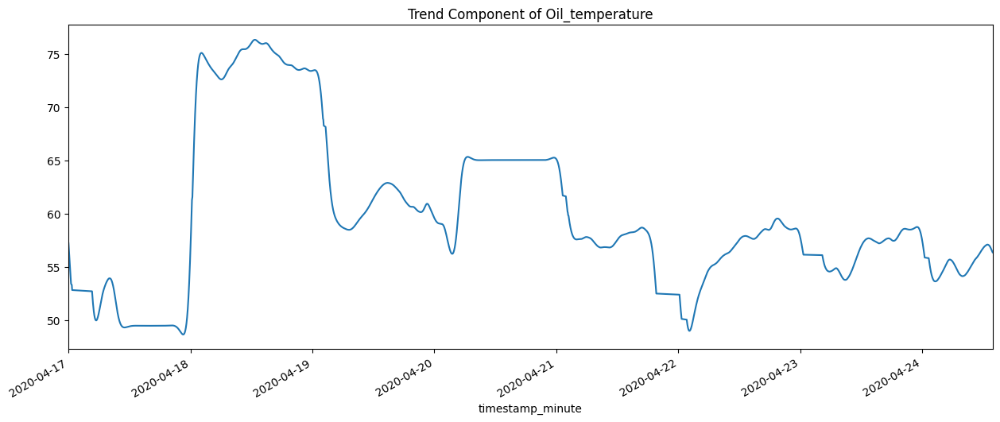

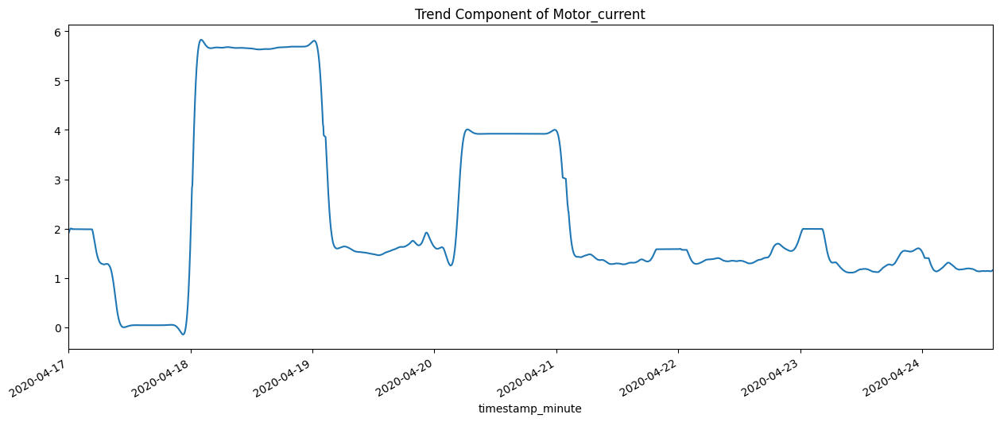

In [17]:
column_names = [
    'TP2', 'TP3', 'H1', 'DV_pressure', 'Reservoirs', 'Oil_temperature', 
    'Motor_current'
]

# Set lambda value for HP filter
lamb = 1_000_000

# Plot each trend component for the given columns
for column in column_names:
    # Apply HP filter
    cycle, trend = hpfilter(df[column][:10000], lamb=lamb)
    
    # Plot the trend component
    plt.figure(figsize=(15, 6))
    trend.plot(figsize=(15, 6), title=f"Trend Component of {column}")
    plt.autoscale(axis='x', tight=True)
    plt.show()

# 6. Train Test Split

In [12]:
train_size = int(len(df) * 0.7)

train = df[:train_size]  
test = df[train_size:]   

print(f"Training data shape: {train.shape}")
print(f"Testing data shape: {test.shape}")

Training data shape: (73535, 16)
Testing data shape: (31515, 16)


# 7. Smoothing Functions

# <h3> 7.1 Simple Exponential Smoothing methods

Use when there is no trend or seasonality in the data

In [22]:
import warnings
warnings.filterwarnings('ignore')
from statsmodels.tsa.holtwinters import SimpleExpSmoothing as SES
import pandas as pd

span = 12  
alpha = 2 / (span + 1)

# Create a new dataframe to store EWMA values
ewma_df = pd.DataFrame()

column_to_smooth=['TP2', 'TP3', 'H1', 'DV_pressure', 'Reservoirs', 'Oil_temperature', 'Motor_current']
# Applying the methods to each relevant column in your data
for col in column_to_smooth:
    
    # Compute EWMA using pandas (METHOD 1)
    ewma_df[f'{col}_EWMA'] = train[col].ewm(alpha=alpha, adjust=False).mean()
    
    # Compute EWMA using Simple Exponential Smoothing (SES) from statsmodels (METHOD 2)
    ewma_df[f'{col}_EWMA_SES'] = SES(train[col]).fit(smoothing_level=alpha, optimized=False).fittedvalues.shift(-1)

# Display the new dataframe with EWMA values
print(ewma_df.head())


                     TP2_EWMA  TP2_EWMA_SES  TP3_EWMA  TP3_EWMA_SES   H1_EWMA  \
timestamp_minute                                                                
2020-04-17 00:00:00 -0.013000     -0.013000  9.307000      9.307000  9.296000   
2020-04-17 00:01:00 -0.013000     -0.013000  9.294231      9.294231  9.283077   
2020-04-17 00:02:00 -0.013154     -0.013154  9.270811      9.270811  9.259527   
2020-04-17 00:03:00 -0.013284     -0.013284  9.238686      9.238686  9.227292   
2020-04-17 00:04:00 -0.013394     -0.013394  9.199042      9.199042  9.187555   

                     H1_EWMA_SES  DV_pressure_EWMA  DV_pressure_EWMA_SES  \
timestamp_minute                                                           
2020-04-17 00:00:00     9.296000         -0.024000             -0.024000   
2020-04-17 00:01:00     9.283077         -0.023846             -0.023846   
2020-04-17 00:02:00     9.259527         -0.023716             -0.023716   
2020-04-17 00:03:00     9.227292         -0.023760  

Plot the original and smoothed data for comparison


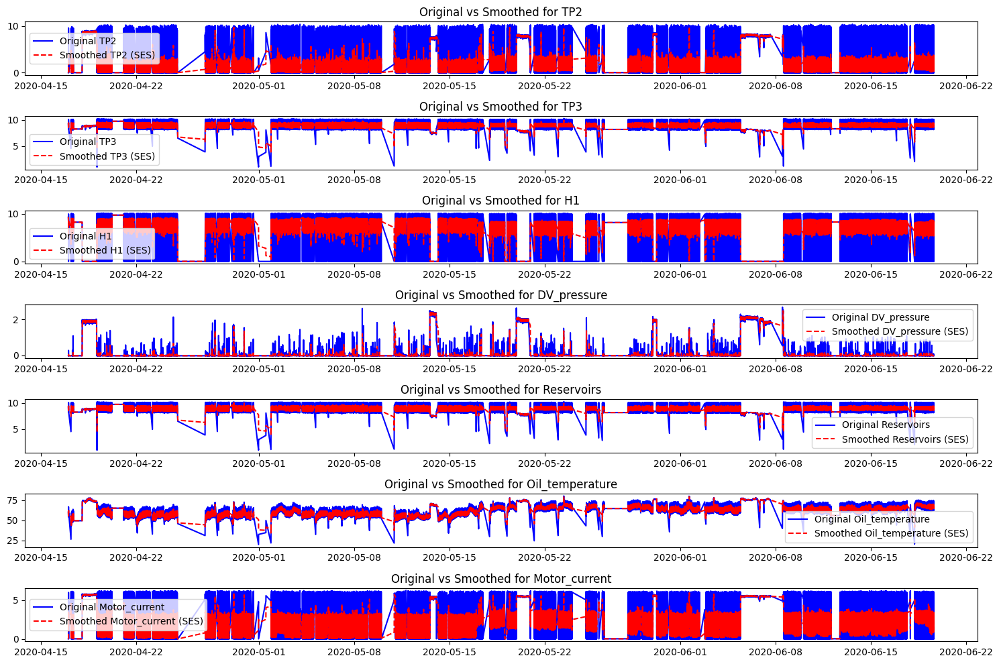

In [23]:
plt.figure(figsize=(15, 10))
for i, col in enumerate(column_to_smooth):
    plt.subplot(len(column_to_smooth), 1, i+1)
    plt.plot(train[col], label=f'Original {col}', color='blue')
    plt.plot(ewma_df[f'{col}_EWMA'], label=f'Smoothed {col} (SES)', color='red', linestyle='dashed')
    plt.legend(loc='best')
    plt.title(f'Original vs Smoothed for {col}')
    plt.tight_layout()

plt.show()

# <h3> 7.2 Double Exponential Smoothing method ->Holts Method

                     TP2_Holt  TP3_Holt   H1_Holt  DV_pressure_Holt  \
timestamp_minute                                                      
2020-04-17 00:00:00 -0.013000  9.224000  9.212000         -0.023000   
2020-04-17 00:01:00 -0.013000  9.155046  9.142215         -0.022169   
2020-04-17 00:02:00 -0.013000  9.084992  9.071317         -0.021325   
2020-04-17 00:03:00 -0.013169  9.013977  8.999614         -0.020637   
2020-04-17 00:04:00 -0.013325  8.942319  8.927410         -0.020260   

                     Reservoirs_Holt  Oil_temperature_Holt  Motor_current_Holt  
timestamp_minute                                                                
2020-04-17 00:00:00         9.222000             59.300000               0.042  
2020-04-17 00:01:00         9.152215             58.327169               0.042  
2020-04-17 00:02:00         9.081317             57.338818               0.042  
2020-04-17 00:03:00         9.009783             56.414907               0.042  
2020-04-17 00:04

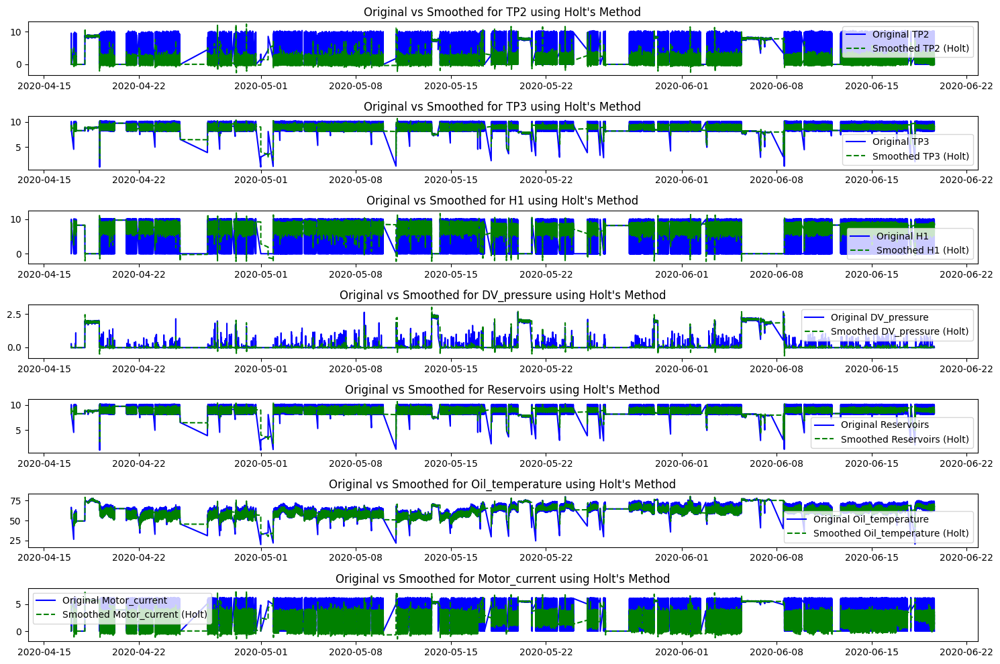

In [25]:
span = 12  
alpha = 2 / (span + 1)
beta = 0.1 

holt_df = pd.DataFrame()

columns_to_smooth = ['TP2', 'TP3', 'H1', 'DV_pressure', 'Reservoirs', 'Oil_temperature', 'Motor_current']

for col in columns_to_smooth:
    holt_model = Holt(train[col]).fit(smoothing_level=alpha, smoothing_trend=beta, optimized=False)
    
    holt_df[f'{col}_Holt'] = holt_model.fittedvalues

print(holt_df.head())

plt.figure(figsize=(15, 10))
for i, col in enumerate(columns_to_smooth):
    plt.subplot(len(columns_to_smooth), 1, i+1)
    plt.plot(train[col], label=f'Original {col}', color='blue')
    plt.plot(holt_df[f'{col}_Holt'], label=f'Smoothed {col} (Holt)', color='green', linestyle='dashed')
    plt.legend(loc='best')
    plt.title(f'Original vs Smoothed for {col} using Holt\'s Method')
    plt.tight_layout()

plt.show()


# <h3> 7.3 Triple Exponential Smoothing method ->Holts Winter Method

                       TP2_HW    TP3_HW     H1_HW  DV_pressure_HW  \
timestamp_minute                                                    
2020-04-17 00:00:00  0.005525  9.455051  9.402044       -0.006109   
2020-04-17 00:01:00  0.003164  9.339096  9.290214       -0.009850   
2020-04-17 00:02:00  0.000667  9.238670  9.196941       -0.012325   
2020-04-17 00:03:00 -0.002330  9.142205  9.106492       -0.015333   
2020-04-17 00:04:00  0.036606  9.052952  8.979167       -0.016150   

                     Reservoirs_HW  Oil_temperature_HW  Motor_current_HW  
timestamp_minute                                                          
2020-04-17 00:00:00       9.454068           61.669751          1.932288  
2020-04-17 00:01:00       9.337848           61.600957          1.161548  
2020-04-17 00:02:00       9.237276           60.759641          0.509973  
2020-04-17 00:03:00       9.140610           59.128783         -0.029414  
2020-04-17 00:04:00       9.052618           58.038073          0.

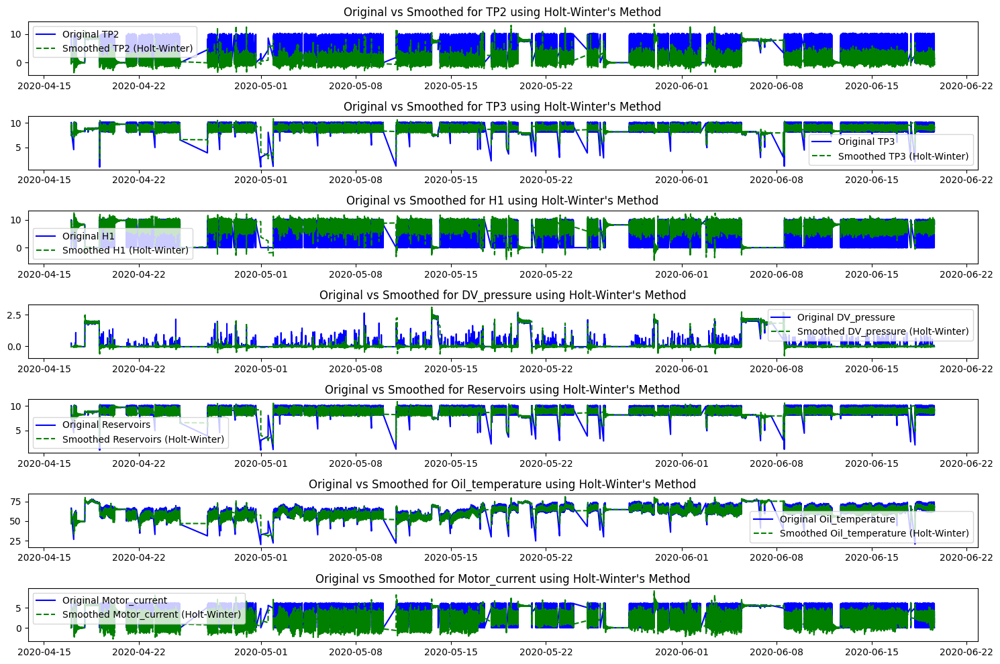

In [26]:
span = 12 
alpha = 2 / (span + 1)
beta = 0.1  
gamma = 0.1 

holt_winters_df = pd.DataFrame()

columns_to_smooth = ['TP2', 'TP3', 'H1', 'DV_pressure', 'Reservoirs', 'Oil_temperature', 'Motor_current']

for col in columns_to_smooth:
    # Apply Holt-Winter's Triple Exponential Smoothing
    hw_model = ExponentialSmoothing(train[col], trend='add', seasonal='add', seasonal_periods=24).fit(
        smoothing_level=alpha, smoothing_trend=beta, smoothing_seasonal=gamma, optimized=False
    )
    
    # Get the fitted (smoothed) values (level + trend + seasonality)
    holt_winters_df[f'{col}_HW'] = hw_model.fittedvalues

# Display the first few rows of the new dataframe with smoothed values
print(holt_winters_df.head())

# Plot the original and smoothed data for comparison
plt.figure(figsize=(15, 10))
for i, col in enumerate(columns_to_smooth):
    plt.subplot(len(columns_to_smooth), 1, i+1)
    plt.plot(train[col], label=f'Original {col}', color='blue')
    plt.plot(holt_winters_df[f'{col}_HW'], label=f'Smoothed {col} (Holt-Winter)', color='green', linestyle='dashed')
    plt.legend(loc='best')
    plt.title(f'Original vs Smoothed for {col} using Holt-Winter\'s Method')
    plt.tight_layout()

plt.show()


# 8. Forecasting with Exponential Smoothing

# <h3> 8.1. Simple Exponential Smoothing (SES) Forecasting

mse=17.120, rmse=4.138, mae=2.380, mape=22.214


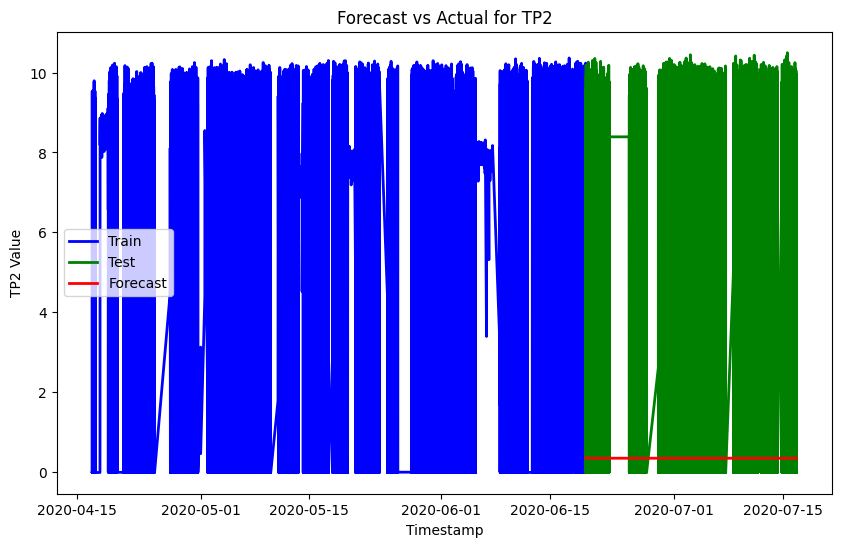

mse=0.447, rmse=0.669, mae=0.520, mape=0.060


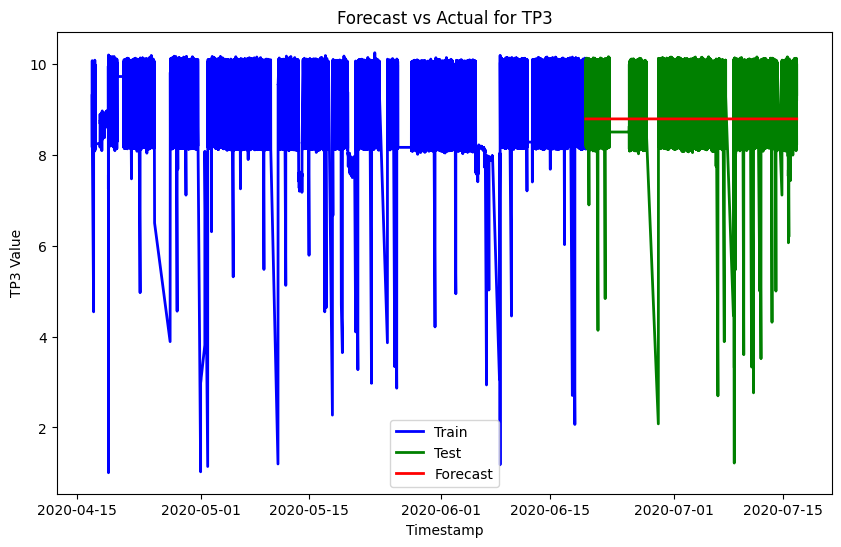

mse=17.613, rmse=4.197, mae=2.607, mape=26523238432394.352


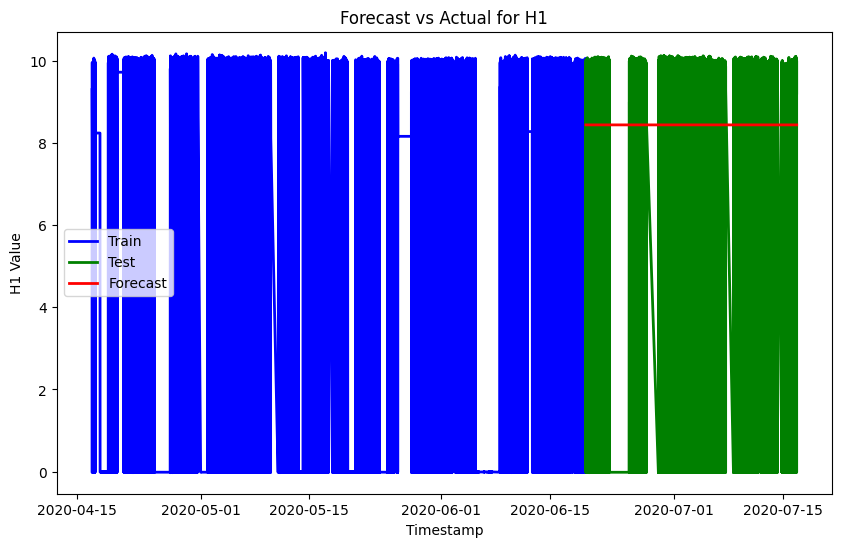

mse=0.004, rmse=0.063, mae=0.008, mape=13640812547.766


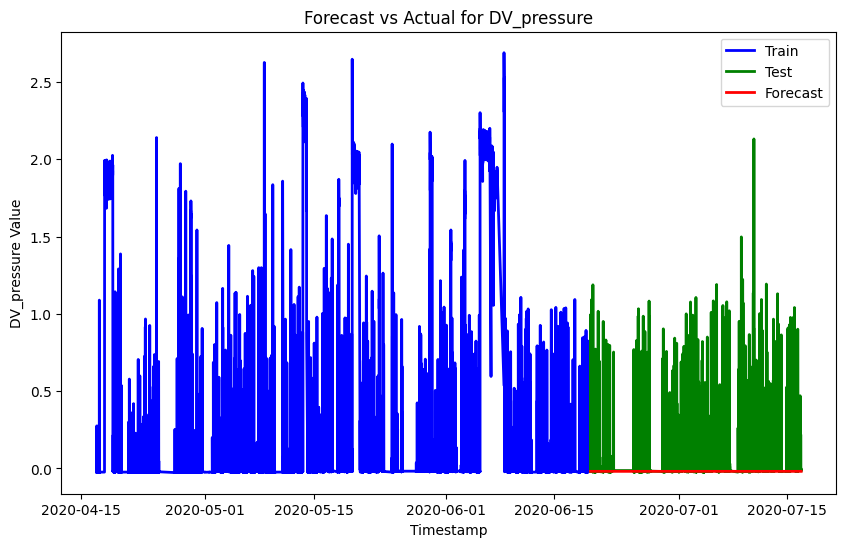

mse=0.446, rmse=0.668, mae=0.520, mape=0.060


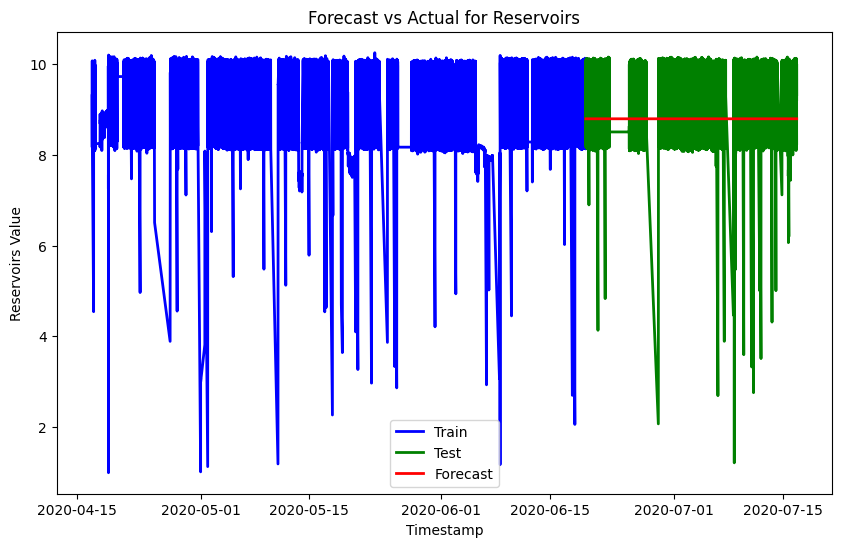

mse=21.389, rmse=4.625, mae=3.516, mape=0.052


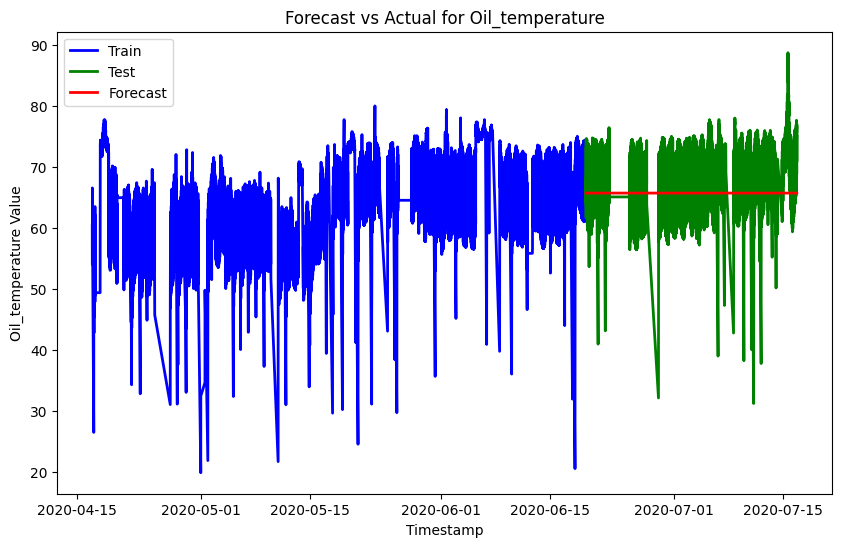

mse=7.781, rmse=2.790, mae=2.427, mape=10.629


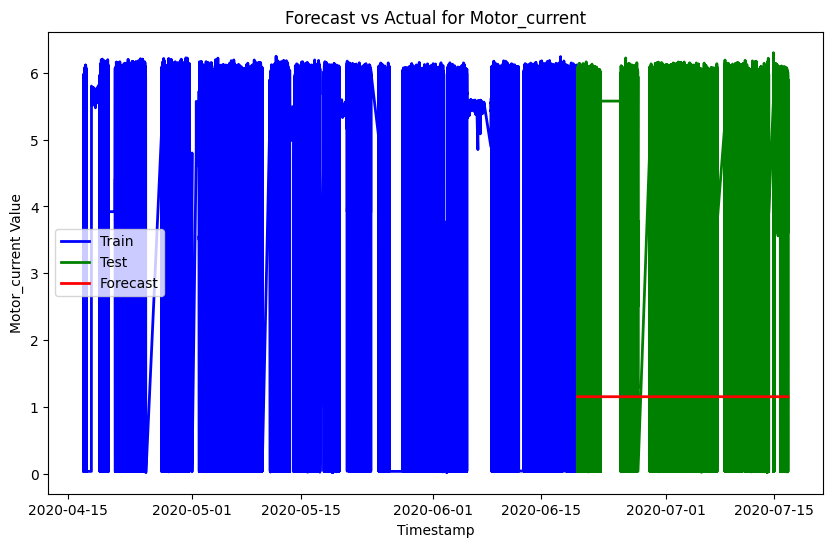

In [56]:
span = 12  
alpha = 2 / (span + 1)


column_to_smooth = ['TP2', 'TP3', 'H1', 'DV_pressure', 'Reservoirs', 'Oil_temperature', 'Motor_current']

for col in column_to_smooth:

    ses_model = SES(train[col]).fit(smoothing_level=alpha, optimized=False)
    
    forecast_steps = len(test) 
    forecast_ses = ses_model.forecast(steps=forecast_steps)

    # print(f'forecast value of {col} {forecast_ses} ')

    # pred_SES[f'{col}_Forecast'] = forecast_ses
    pred_SES = pd.DataFrame(forecast_ses, columns=[f'{col}_Forecast'])
    pred_SES.index = test.index  
    
    plot_and_validate(train, test, pred_SES, col)


# <h3> 8.2. Holt’s Linear Trend Method

mse=3324407.880, rmse=1823.296, mae=1579.846, mape=108342.564


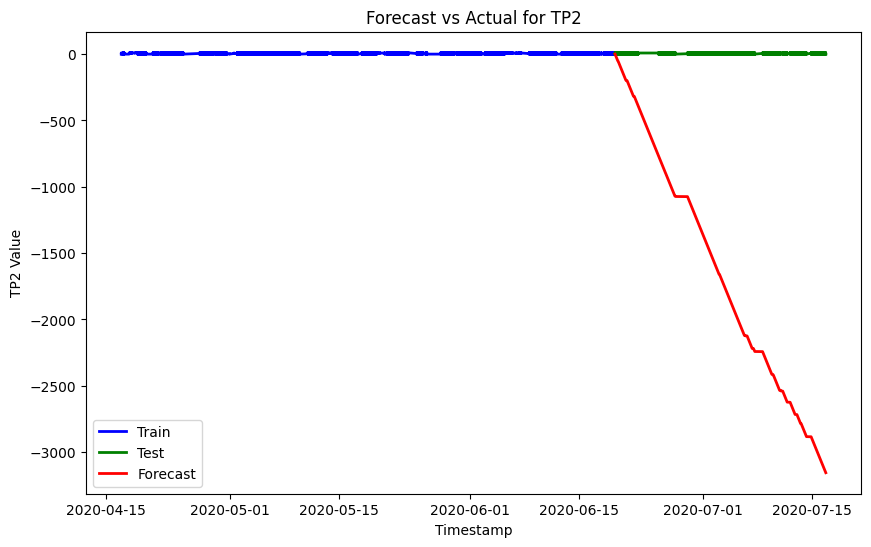

mse=151919.294, rmse=389.768, mae=337.569, mape=37.853


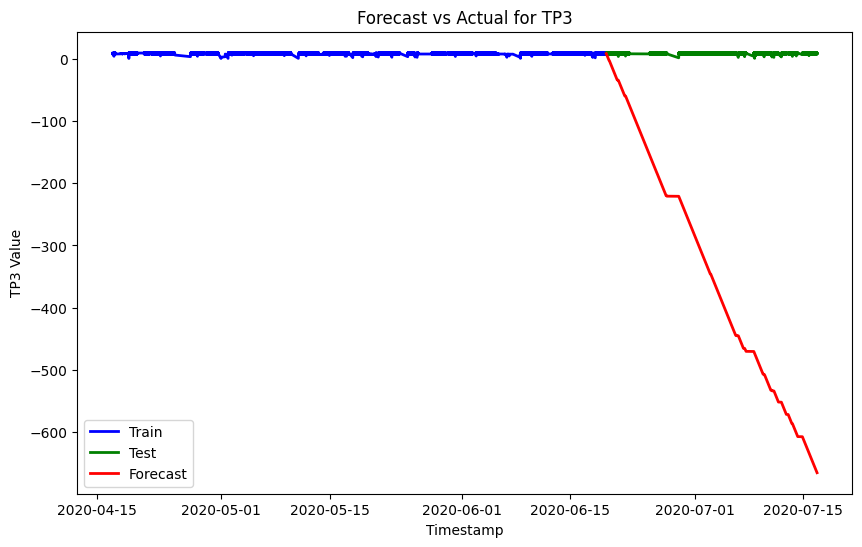

mse=1981796.734, rmse=1407.763, mae=1219.973, mape=6921745234444587.000


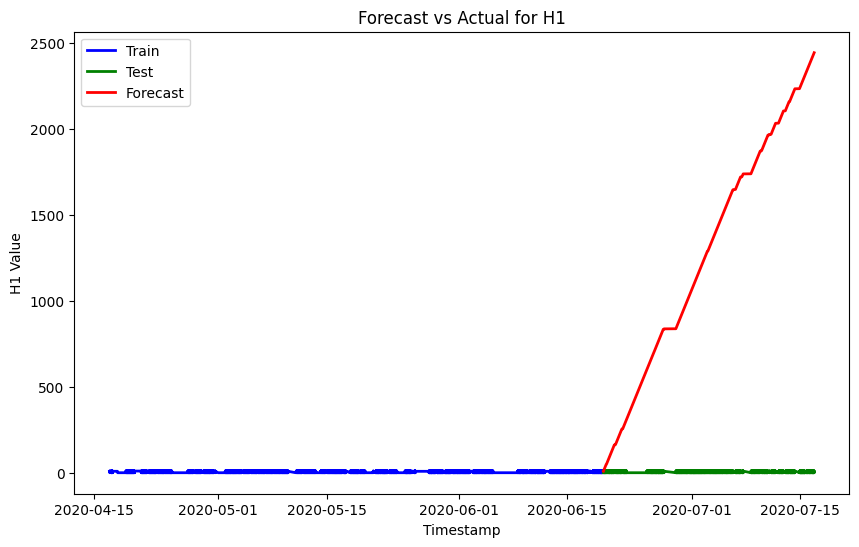

mse=0.857, rmse=0.926, mae=0.801, mape=772257281531.850


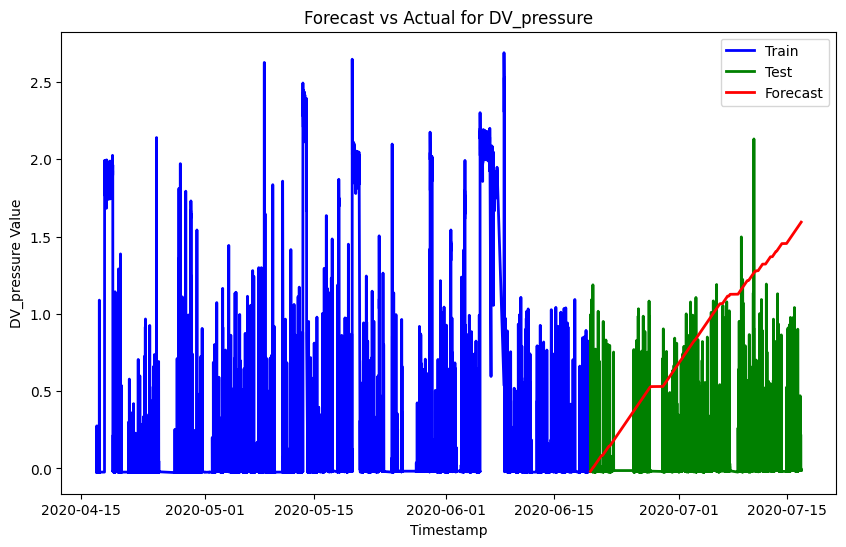

mse=151077.152, rmse=388.686, mae=336.632, mape=37.745


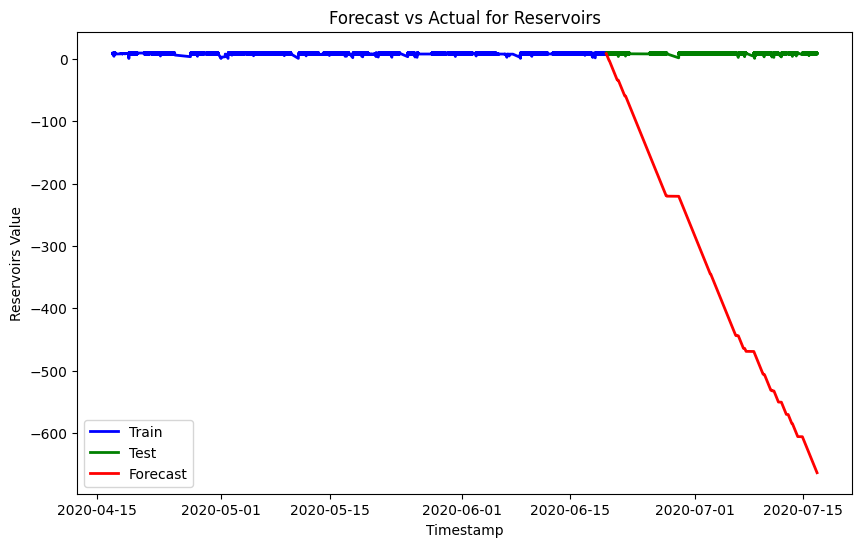

mse=5411164.057, rmse=2326.191, mae=2014.143, mape=29.913


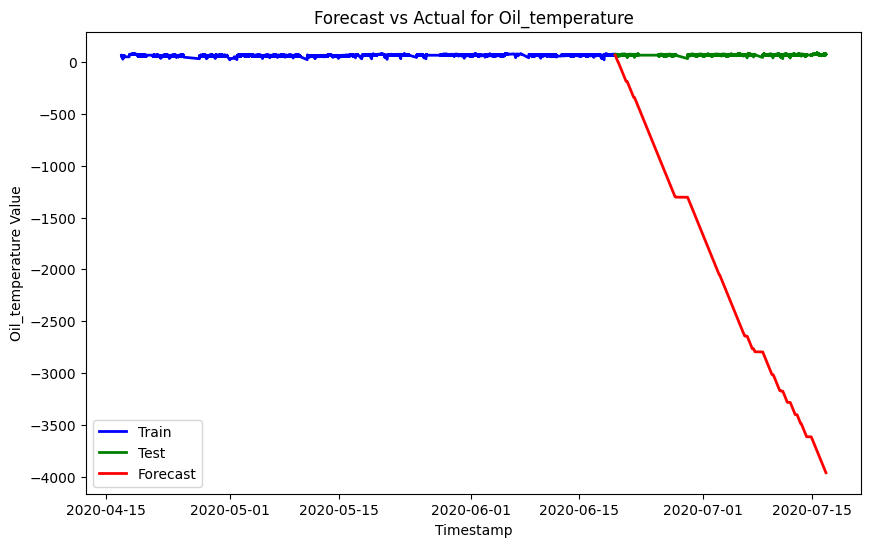

mse=5523203.546, rmse=2350.150, mae=2035.801, mape=19400.212


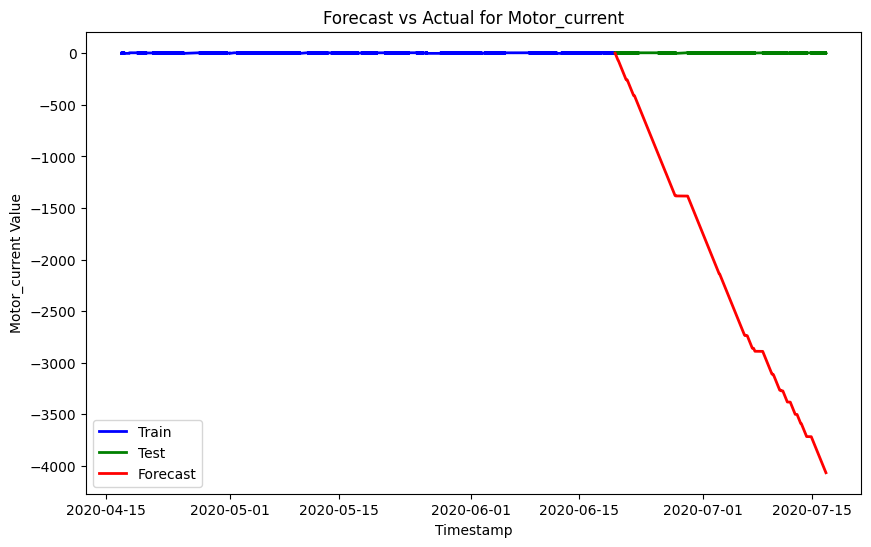

In [57]:
span = 12  
alpha = 2 / (span + 1)
beta = 0.1


column_to_smooth = ['TP2', 'TP3', 'H1', 'DV_pressure', 'Reservoirs', 'Oil_temperature', 'Motor_current']

for col in column_to_smooth:

    holt_model = Holt(train[col]).fit(smoothing_level=alpha, smoothing_trend=beta, optimized=False)
    
    
    forecast_steps = len(test) 
    forecast_ses = holt_model.forecast(steps=forecast_steps)

    pred_SES = pd.DataFrame(forecast_ses, columns=[f'{col}_Forecast'])
    pred_SES.index = test.index  
    
    plot_and_validate(train, test, pred_SES, col)


# <h3> 8.3. Holt-Winter’s Seasonal Method

mse=4545902.138, rmse=2132.112, mae=1847.359, mape=126712.506


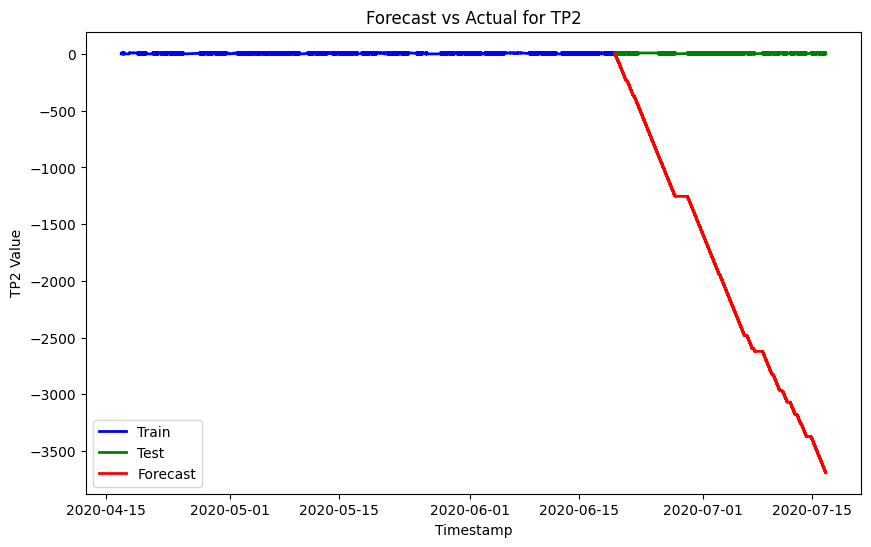

mse=233727.482, rmse=483.454, mae=418.718, mape=46.955


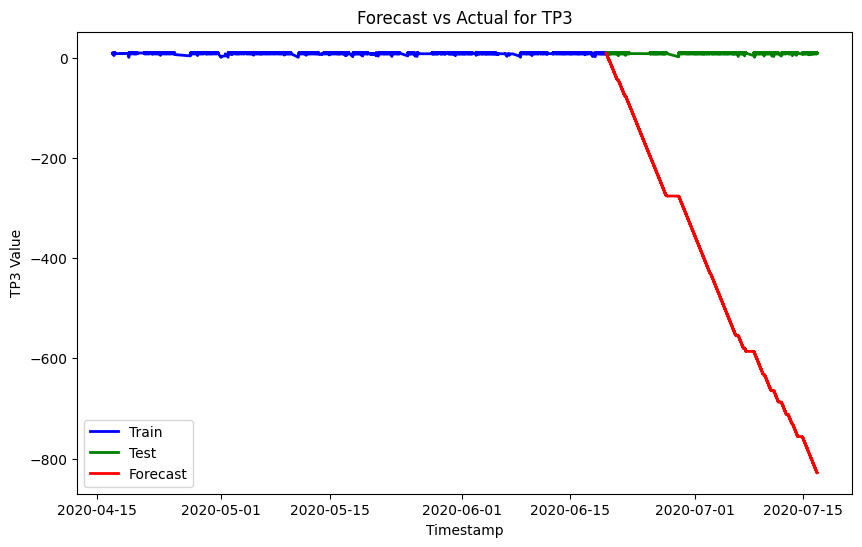

mse=2625979.145, rmse=1620.487, mae=1404.251, mape=7964021074039765.000


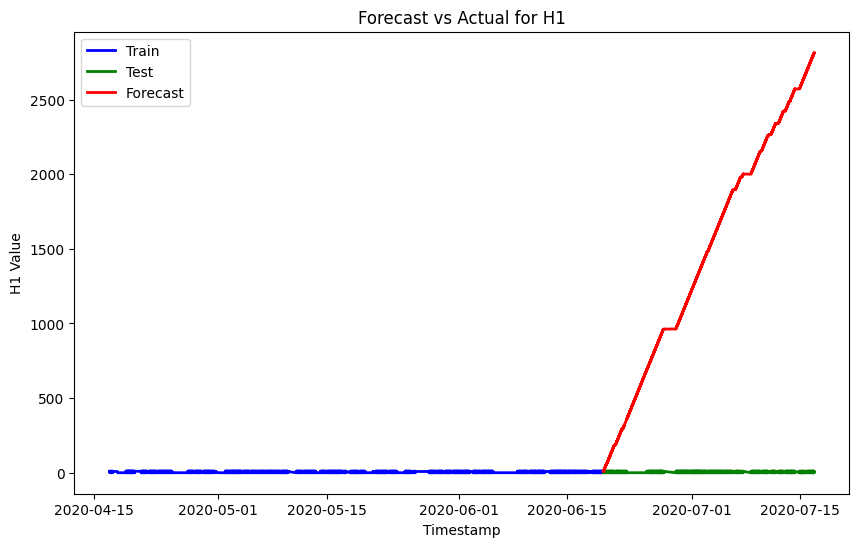

mse=0.668, rmse=0.817, mae=0.707, mape=696212855358.783


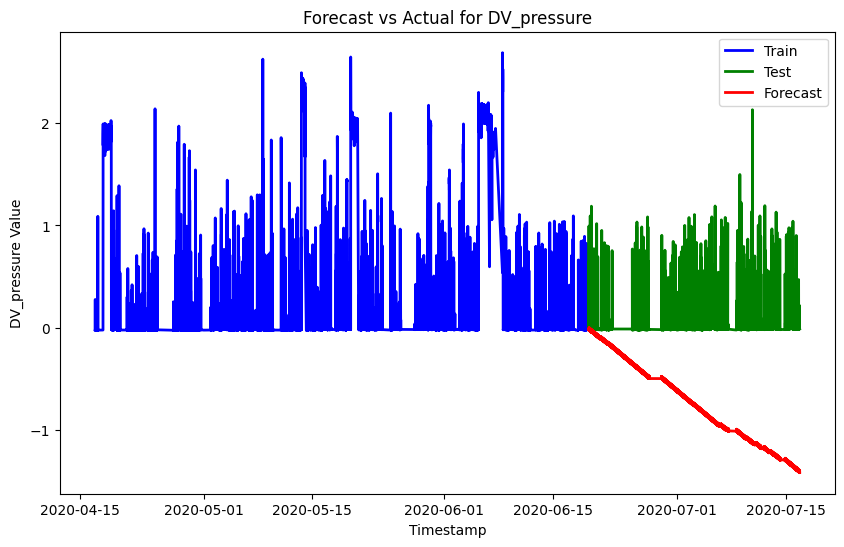

mse=232360.239, rmse=482.038, mae=417.492, mape=46.813


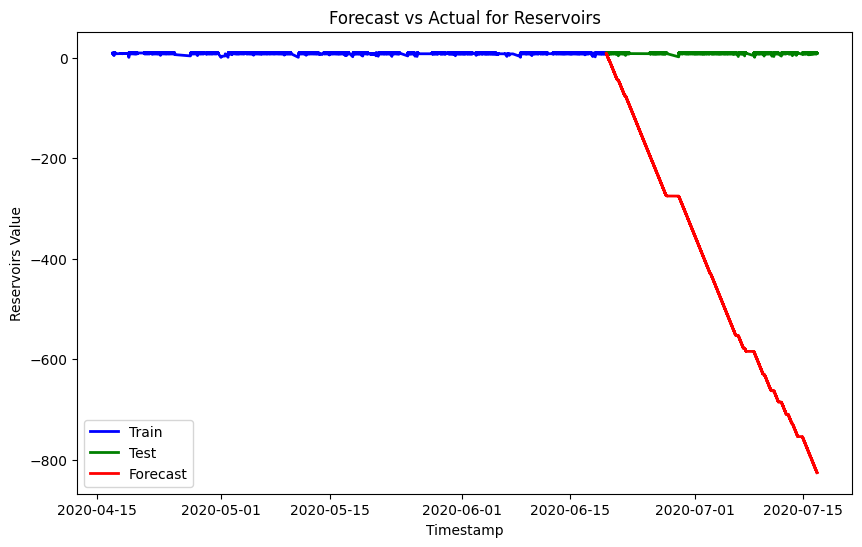

mse=9325970.484, rmse=3053.845, mae=2644.410, mape=39.275


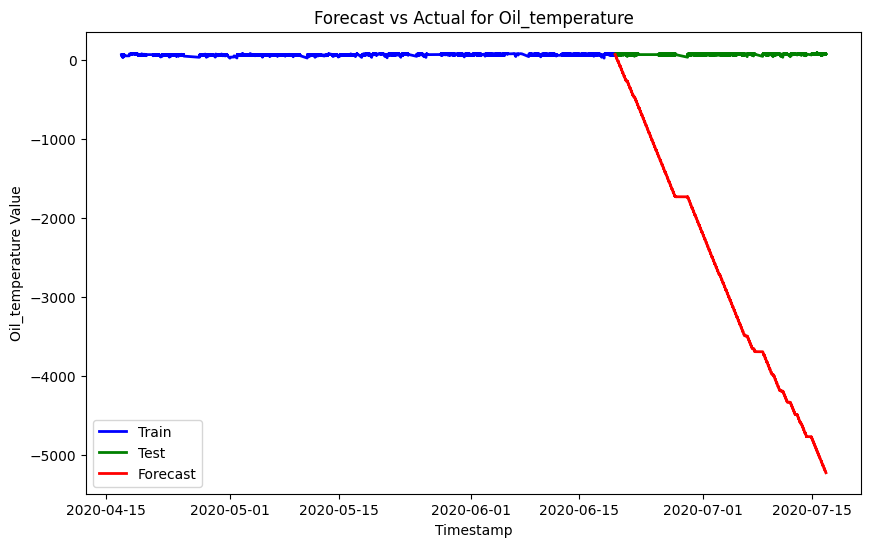

mse=7715340.884, rmse=2777.650, mae=2406.107, mape=22933.563


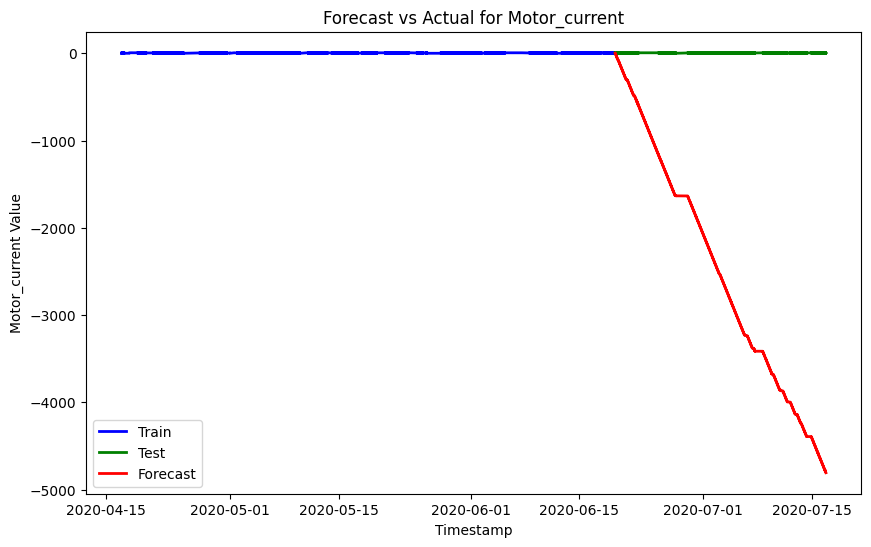

In [58]:
span = 12 
alpha = 2 / (span + 1)
beta = 0.1  
gamma = 0.1


column_to_smooth = ['TP2', 'TP3', 'H1', 'DV_pressure', 'Reservoirs', 'Oil_temperature', 'Motor_current']

for col in column_to_smooth:

    hw_model = ExponentialSmoothing(train[col], trend='add', seasonal='add', seasonal_periods=24).fit(
        smoothing_level=alpha, smoothing_trend=beta, smoothing_seasonal=gamma, optimized=False)
    
    
    forecast_steps = len(test) 
    forecast_ses = hw_model.forecast(steps=forecast_steps)

    pred_SES = pd.DataFrame(forecast_ses, columns=[f'{col}_Forecast'])
    pred_SES.index = test.index  
    
    plot_and_validate(train, test, pred_SES, col)


# 8. Stationarity Check

In [59]:
from statsmodels.tsa.stattools import adfuller

def Augmented_Dickey_Fuller_Test_func(series , column_name):
    print (f'Results of Dickey-Fuller Test for column: {column_name}')
    dftest = adfuller(series, autolag='AIC') #AIC: Method to use when automatically determining the lag length among the values 0, 1, …, maxlag
    #The t-value measures the size of the difference relative to the variation in your sample data.
    #T is simply the calculated difference represented in units of standard error.
    #The greater the magnitude of T, the greater the evidence against the null hypothesis.

    dfoutput = pd.Series(dftest[0:4], index=['Test Statistics','p-value','Lags Used','No. of Observations Used'])
    for key,value in dftest[4].items():
       dfoutput['Critical Value (%s)'%key] = value #Critical values for the ADF test for 1%, 5%, and 10% significance levels with the constant model are −3.43, −2.87, and −2.57, respectively.
    print (dfoutput)
    if dftest[1] <= 0.05:
        print("Conclusion:====>")
        print("Reject the null hypothesis")
        print("Data is stationary")
    else:
        print("Conclusion:====>")
        print("Fail to reject the null hypothesis")
        print("Data is non-stationary")


In [60]:
column_names = ['TP2', 'TP3', 'H1', 'DV_pressure', 'Reservoirs', 'Oil_temperature', 
    'Motor_current','DV_eletric','COMP','Towers','MPG','LPS','Pressure_switch','Oil_level','Caudal_impulses','status']

# Loop through each column and plot the autocorrelation
for column in column_names:
    Augmented_Dickey_Fuller_Test_func(df[column], column)
    print("-----*-----*-----*-----*-----*-----*-----*-----*-----*-----*-----*-----*-----*-----*-----*-----*-----*-----*")

Results of Dickey-Fuller Test for column: TP2
Test Statistics            -7.554141e+00
p-value                     3.131853e-11
Lags Used                   6.900000e+01
No. of Observations Used    1.049800e+05
Critical Value (1%)        -3.430412e+00
Critical Value (5%)        -2.861568e+00
Critical Value (10%)       -2.566785e+00
dtype: float64
Conclusion:====>
Reject the null hypothesis
Data is stationary
-----*-----*-----*-----*-----*-----*-----*-----*-----*-----*-----*-----*-----*-----*-----*-----*-----*-----*
Results of Dickey-Fuller Test for column: TP3
Test Statistics            -1.482637e+01
p-value                     1.928894e-27
Lags Used                   6.900000e+01
No. of Observations Used    1.049800e+05
Critical Value (1%)        -3.430412e+00
Critical Value (5%)        -2.861568e+00
Critical Value (10%)       -2.566785e+00
dtype: float64
Conclusion:====>
Reject the null hypothesis
Data is stationary
-----*-----*-----*-----*-----*-----*-----*-----*-----*-----*-----*---

# 9. ACF and PACF plots

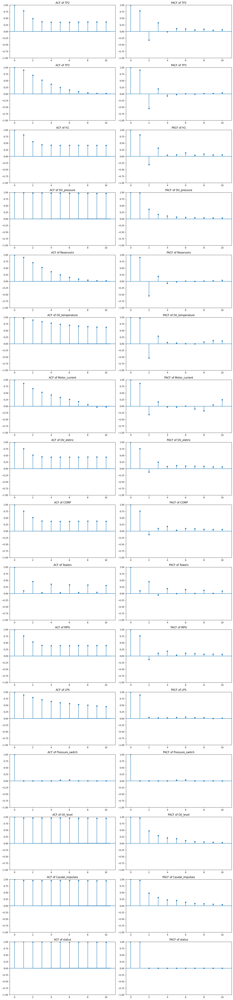

In [9]:
# rcParams['figure.figsize'] = 12, 8  # Adjusted figure size for better spacing
n_lags = 10  # Number of lags to display

# Looping through each column to plot ACF and PACF
columns = df.columns  # Get all column names from the DataFrame
num_cols = len(columns)

# Create subplots with 2 plots (ACF and PACF) for each column
fig, axes = plt.subplots(num_cols, 2, figsize=(15, 4 * num_cols))  # 2 subplots per column

for i, col in enumerate(columns):
    # Plot ACF
    plot_acf(df[col], lags=n_lags, ax=axes[i, 0])
    axes[i, 0].set_title(f'ACF of {col}')

    # Plot PACF
    plot_pacf(df[col], lags=n_lags, ax=axes[i, 1])
    axes[i, 1].set_title(f'PACF of {col}')

# Adjust layout to avoid overlap
plt.tight_layout()
plt.show()


# 10. Auto ARIMA

In [7]:
columns_to_model = ['TP2', 'TP3', 'H1', 'DV_pressure', 'Reservoirs', 'Oil_temperature',
       'Motor_current', 'DV_eletric', 'COMP', 'Towers', 'MPG', 'LPS',
       'Pressure_switch', 'Oil_level', 'Caudal_impulses'] 

# Dictionary to store models for each column
models = {}

# Iterate over the specified columns and fit auto_arima
for col in columns_to_model:
    print("-----*-----*-----*-----*-----*-----*------*-----*-----*-----*-----*-----*-----*-----*-----*-----*-----*-----*-----*")
    print(f"\nFitting auto_arima for {col}...")
    
    # Fit the ARIMA model
    model = auto_arima(train[col], 
                   start_p=0, max_p=5, 
                   start_q=0, max_q=5, 
                   d=0,  # No differencing needed for stationary data
                   seasonal=False,  # Non-seasonal ARIMA
                   trace=True,
                   stepwise=True)       # Use all available cores for parallel processing
    
    # Store the model in the dictionary
    models[col] = model

    # Print model summary for each column
    print(f"\nSummary for {col}:")
    print(model.summary())



-----*-----*-----*-----*-----*-----*------*-----*-----*-----*-----*-----*-----*-----*-----*-----*-----*-----*-----*

Fitting auto_arima for TP2...
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=398015.101, Time=0.50 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=314112.770, Time=0.59 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=331749.384, Time=3.11 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=308079.139, Time=1.67 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=297066.830, Time=2.64 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=297067.882, Time=3.06 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=297065.283, Time=7.98 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=300555.120, Time=7.70 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=296886.509, Time=11.07 sec
 ARIMA(5,0,1)(0,0,0)[0]             : AIC=287017.836, Time=37.33 sec
 ARIMA(5,0,0)(0,0,0)[0]             : AIC=295617.492, Time=3.37 sec
 ARIMA(5,0,2)(0,0,0)[0]             : AIC=286708.176, Time=4

# 11. ARIMA

Making predictions for TP2...
mse=18.490, rmse=4.300, mae=2.249, mape=1.710


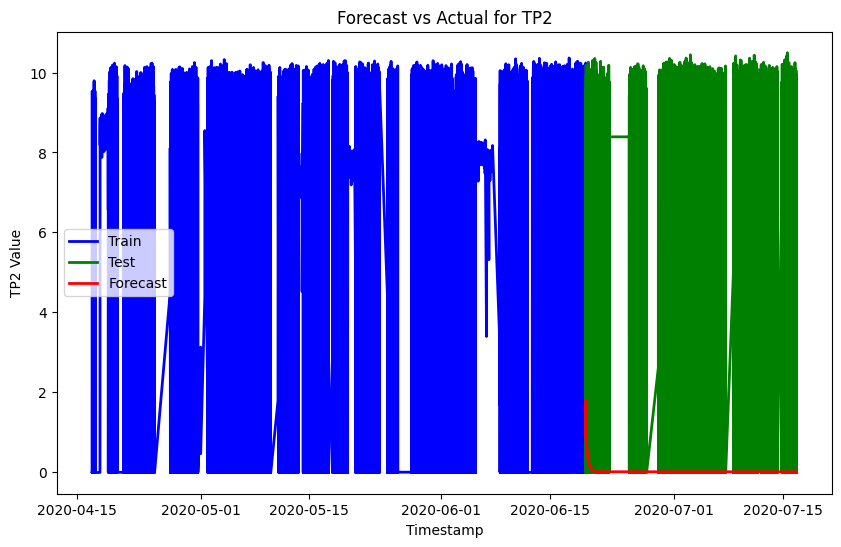

Making predictions for TP3...
mse=0.421, rmse=0.649, mae=0.516, mape=0.060


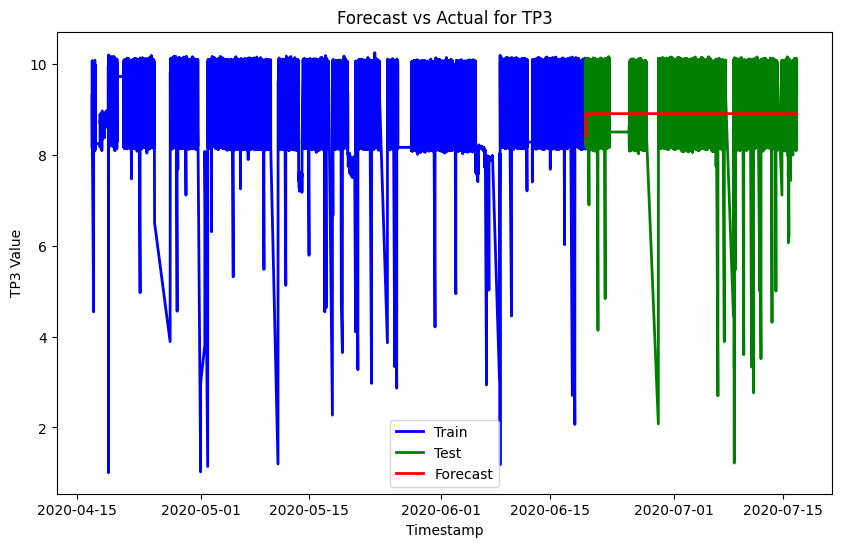

Making predictions for H1...
mse=53.313, rmse=7.302, mae=6.384, mape=576429828680.396


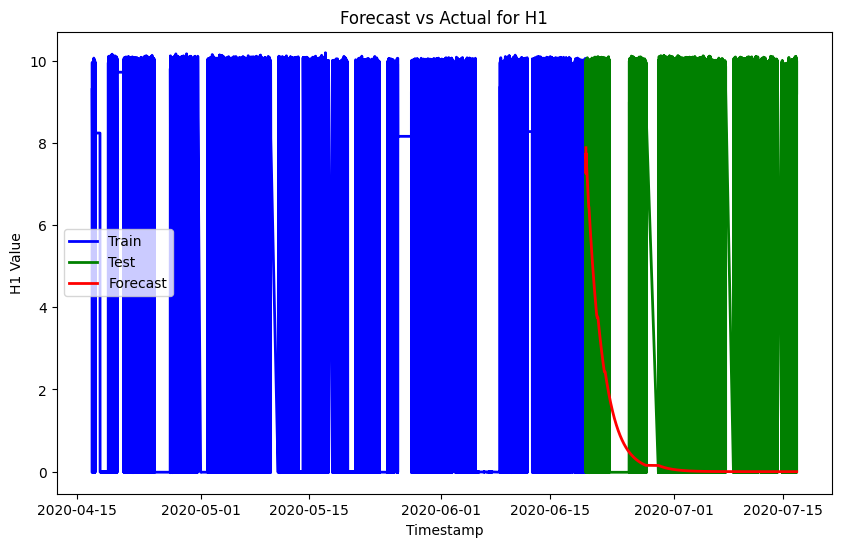

Making predictions for DV_pressure...
mse=0.004, rmse=0.064, mae=0.022, mape=719.823


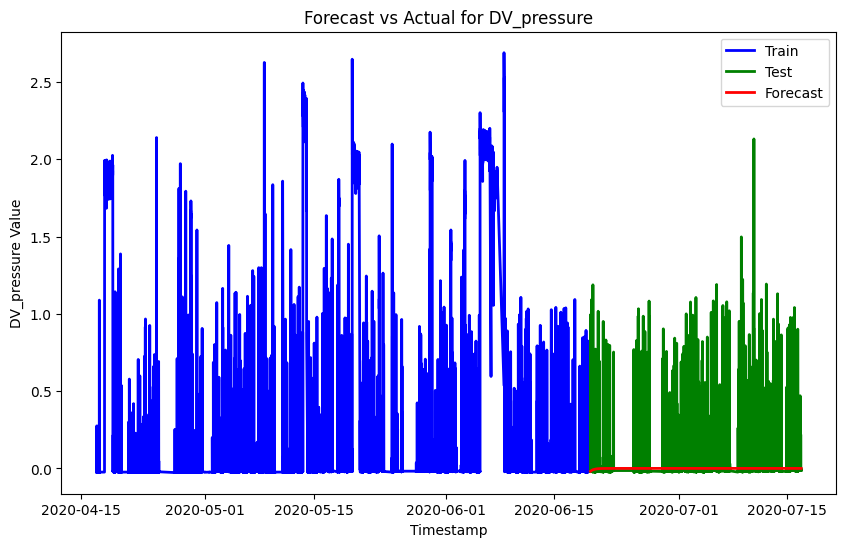

Making predictions for Reservoirs...
mse=0.420, rmse=0.648, mae=0.515, mape=0.060


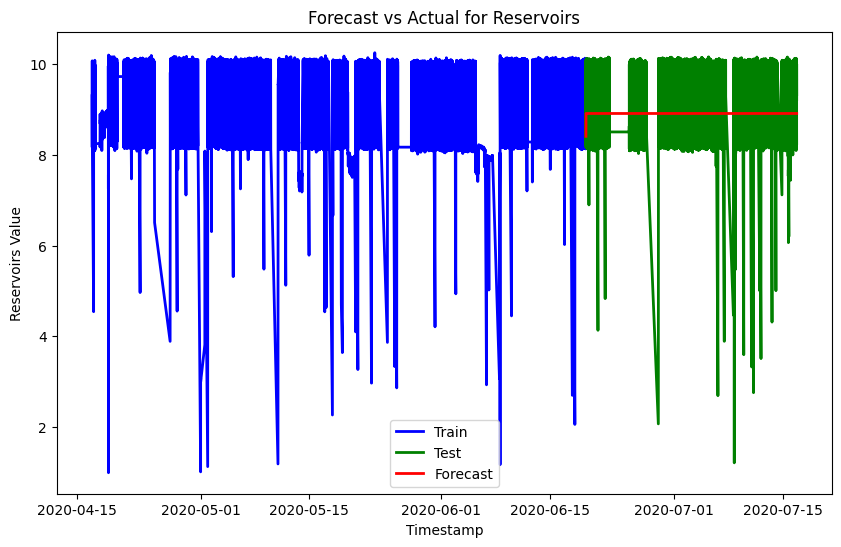

Making predictions for Oil_temperature...
mse=300.887, rmse=17.346, mae=14.506, mape=0.212


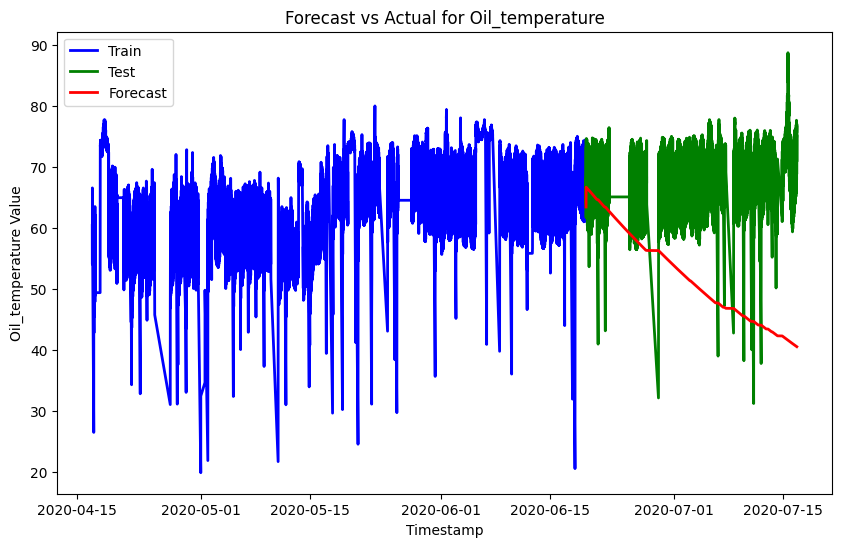

Making predictions for Motor_current...
mse=5.597, rmse=2.366, mae=2.217, mape=19.698


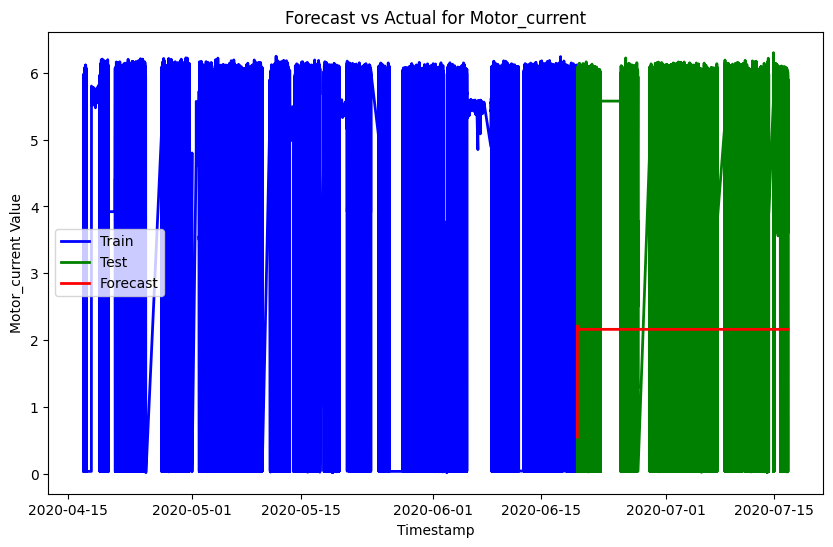

Making predictions for DV_eletric...
mse=0.248, rmse=0.498, mae=0.254, mape=23825202384284.426


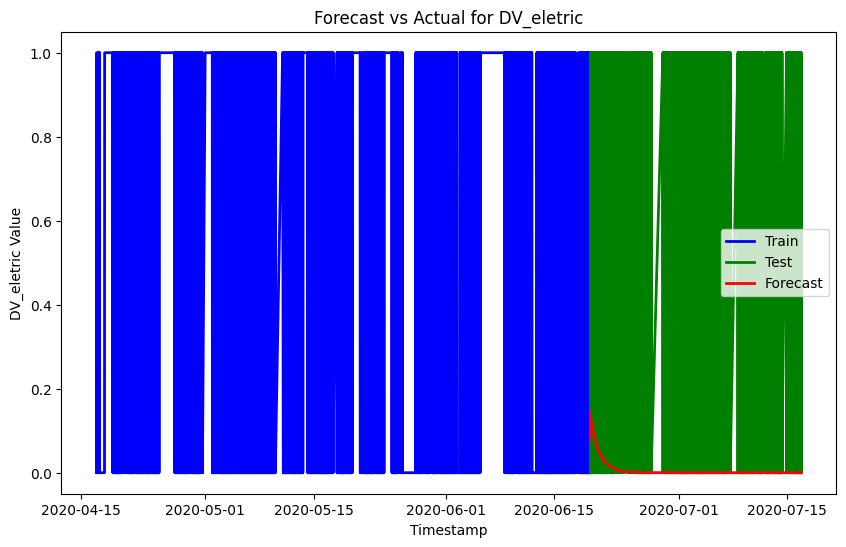

Making predictions for COMP...
mse=0.558, rmse=0.747, mae=0.672, mape=309812910976348.250


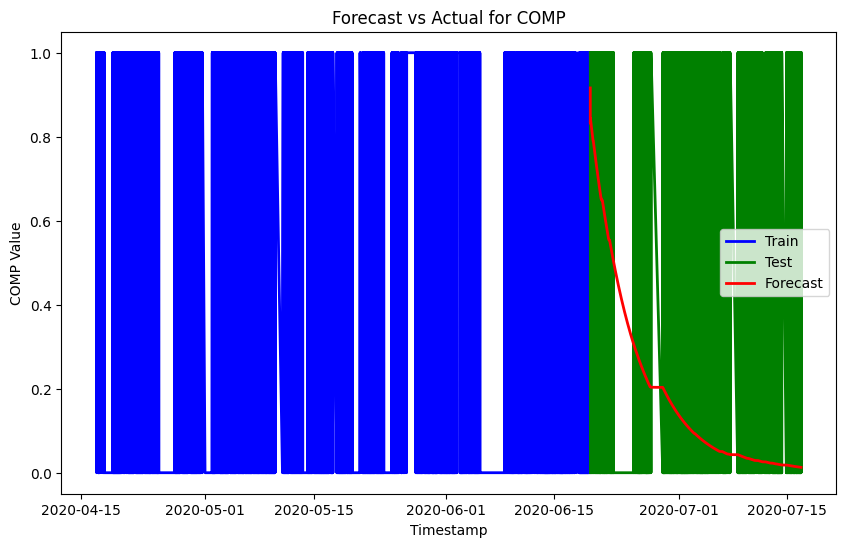

Making predictions for Towers...
mse=0.072, rmse=0.269, mae=0.159, mape=317862224582312.188


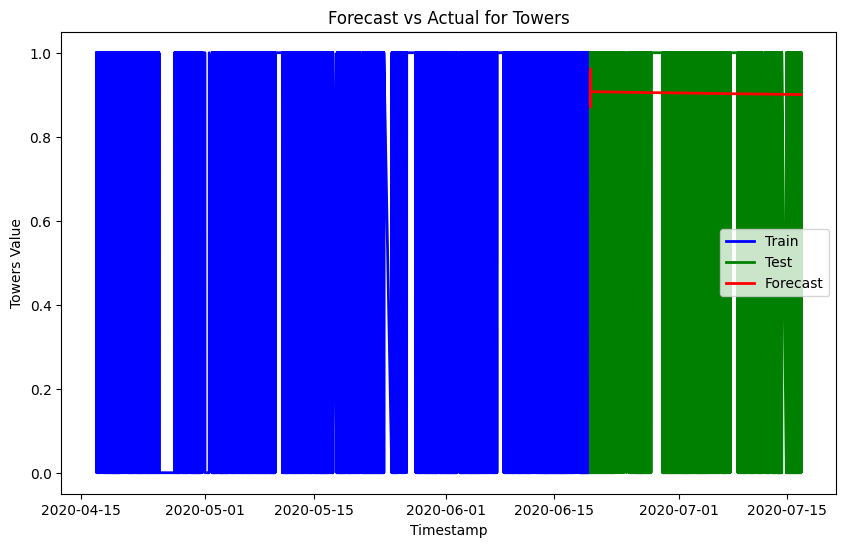

Making predictions for MPG...
mse=0.464, rmse=0.681, mae=0.628, mape=439764508978441.062


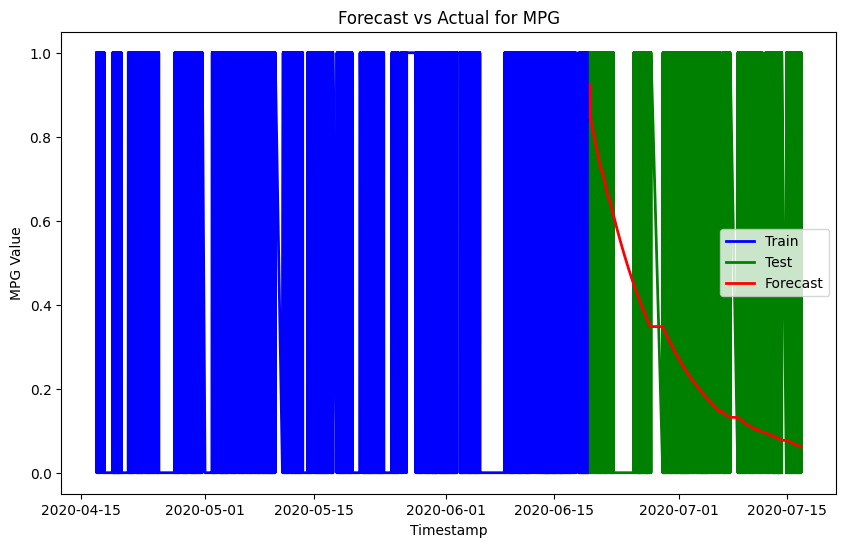

Making predictions for LPS...
mse=0.007, rmse=0.084, mae=0.011, mape=19797722870589.414


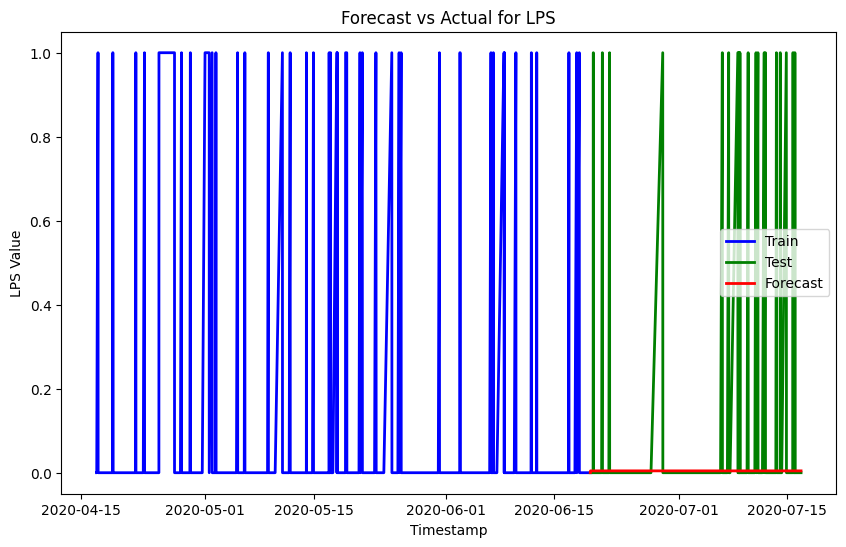

Making predictions for Pressure_switch...
mse=0.001, rmse=0.030, mae=0.001, mape=3999063338386.181


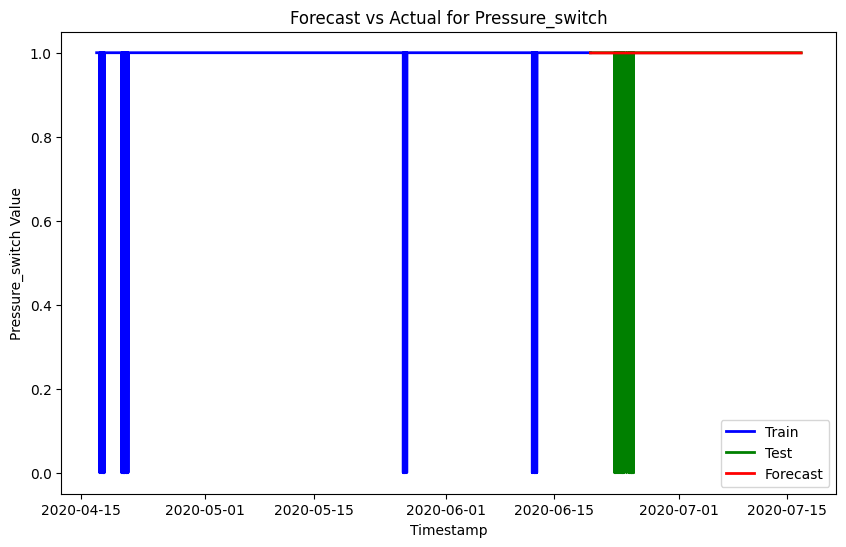

Making predictions for Oil_level...
mse=0.049, rmse=0.221, mae=0.192, mape=18864652915315.906


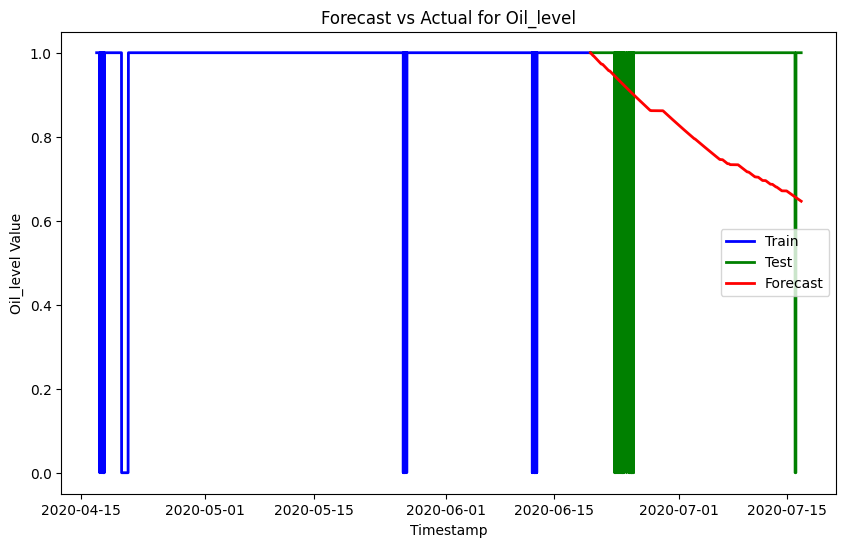

Making predictions for Caudal_impulses...
mse=0.047, rmse=0.217, mae=0.190, mape=3678497527500.315


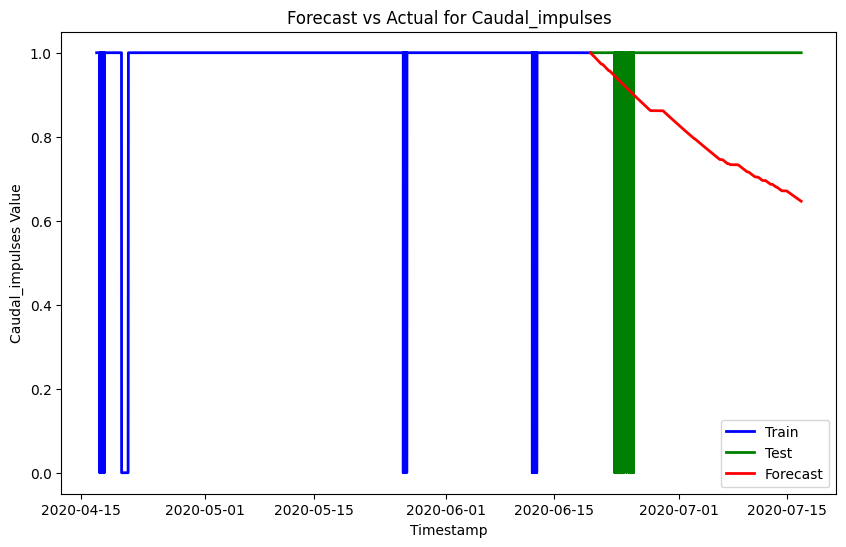

In [9]:
predictions = {}

for col in columns_to_model:
    print(f"Making predictions for {col}...")
    
    model = models[col]
    
    n_periods = len(test)
    forecast, conf_int = model.predict(n_periods=n_periods, return_conf_int=True)
    
    pred_df = pd.DataFrame({
        'Timestamp': test.index,   # Use the test set timestamps
        f'{col}_Forecast': forecast
    }).set_index('Timestamp')  # Set the timestamp as the index
    
    # Store the predictions in the dictionary
    predictions[col] = pred_df
    
    # Plot the predictions along with actual data and validation
    plot_and_validate(train, test, pred_df, col)

# 13. VAR Model

In [7]:
var_data = df.drop(columns=['status'])

In [8]:
model = VAR(var_data)
sorted_order=model.select_order(maxlags=20)
print(sorted_order.summary())


 VAR Order Selection (* highlights the minimums)  
       AIC         BIC         FPE         HQIC   
--------------------------------------------------
0       -59.88      -59.88   9.858e-27      -59.88
1       -83.40      -83.38   5.995e-37      -83.40
2       -85.45      -85.41   7.716e-38      -85.44
3       -86.15      -86.08   3.866e-38      -86.13
4       -86.48      -86.40   2.761e-38      -86.46
5       -86.72      -86.62   2.173e-38      -86.69
6       -87.09      -86.97   1.505e-38      -87.05
7       -87.32      -87.17   1.198e-38      -87.27
8       -87.79      -87.62   7.496e-39      -87.74
9       -88.02      -87.84   5.914e-39      -87.97
10      -88.07      -87.86   5.653e-39      -88.01
11      -88.10      -87.87   5.495e-39      -88.03
12      -88.12      -87.87   5.394e-39      -88.04
13      -88.13      -87.86   5.320e-39      -88.05
14      -88.14      -87.85   5.260e-39      -88.05
15      -88.18      -87.87   5.057e-39      -88.09
16      -88.20     -87.88*   4.

In [9]:
model = VAR(var_data)
results = model.fit(maxlags=20, ic='aic')  # Using AIC for lag order selection
print(results.summary())


  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Sun, 27, Oct, 2024
Time:                     14:38:24
--------------------------------------------------------------------
No. of Equations:         15.0000    BIC:                   -87.8247
Nobs:                     105030.    HQIC:                  -88.1112
Log likelihood:       2.40275e+06    FPE:                4.78319e-39
AIC:                     -88.2357    Det(Omega_mle):     4.58221e-39
--------------------------------------------------------------------
Results for equation TP2
                         coefficient       std. error           t-stat            prob
--------------------------------------------------------------------------------------
const                       4.667738         0.710244            6.572           0.000
L1.TP2                     -1.408763         0.019676          -71.600           0.000
L1.TP3                    -86.552754  

mse=13.731, rmse=3.706, mae=2.990, mape=113.663


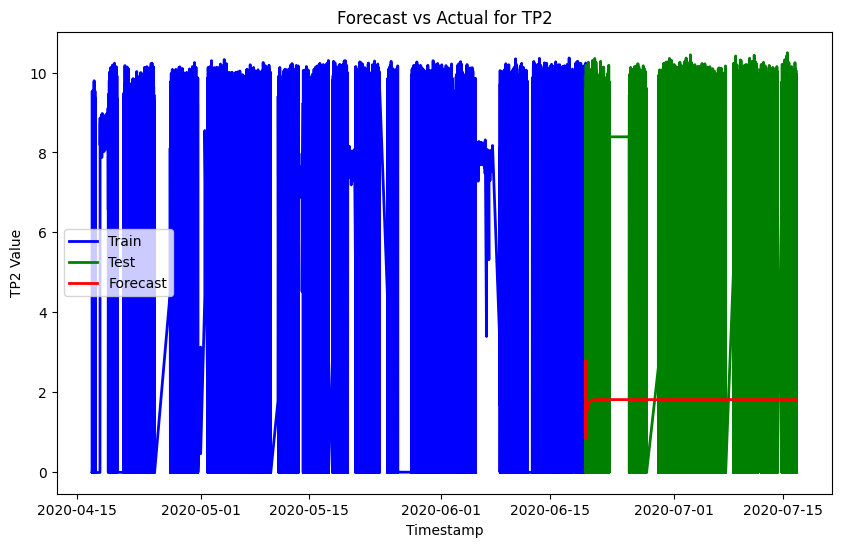

mse=0.419, rmse=0.647, mae=0.516, mape=0.060


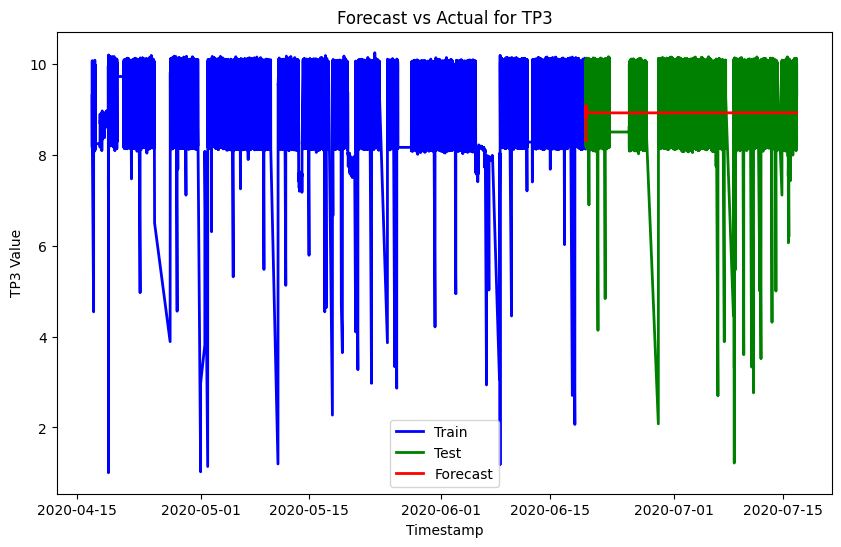

mse=14.696, rmse=3.834, mae=3.137, mape=22216988967624.430


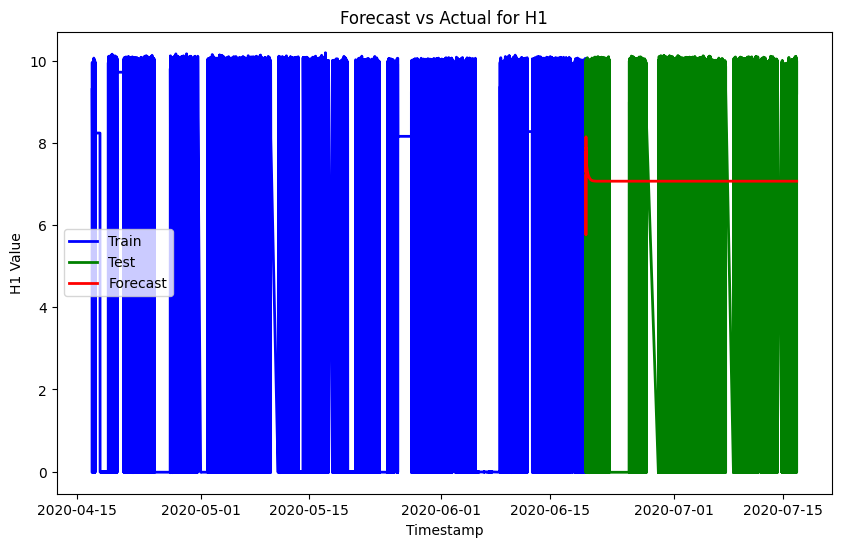

mse=0.022, rmse=0.148, mae=0.142, mape=88454351784.953


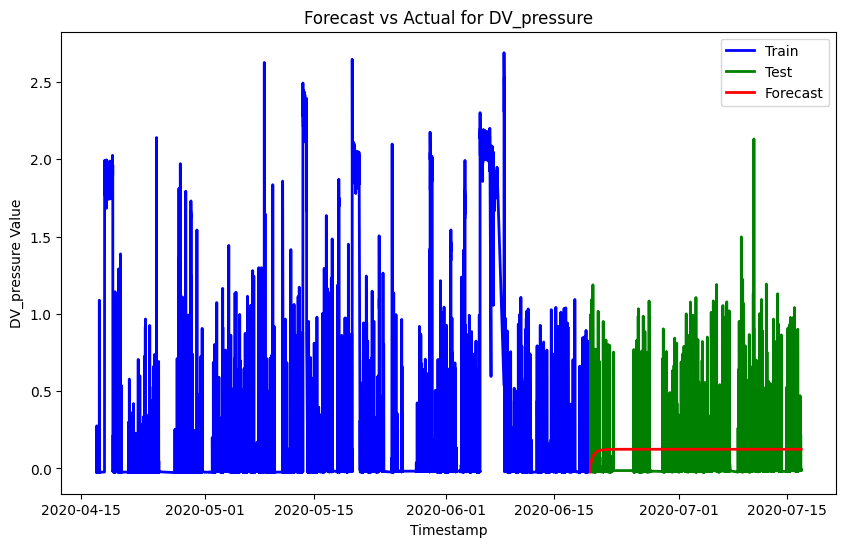

mse=0.418, rmse=0.647, mae=0.516, mape=0.060


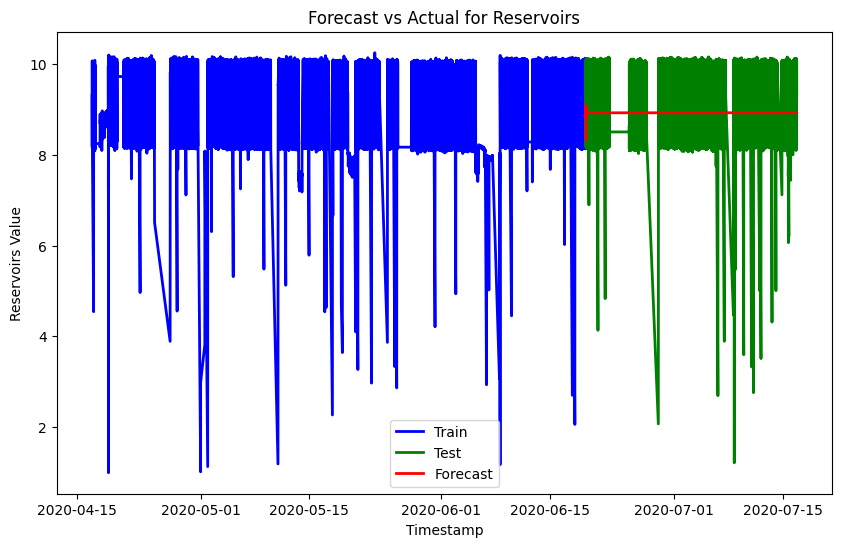

mse=28.030, rmse=5.294, mae=4.057, mape=0.059


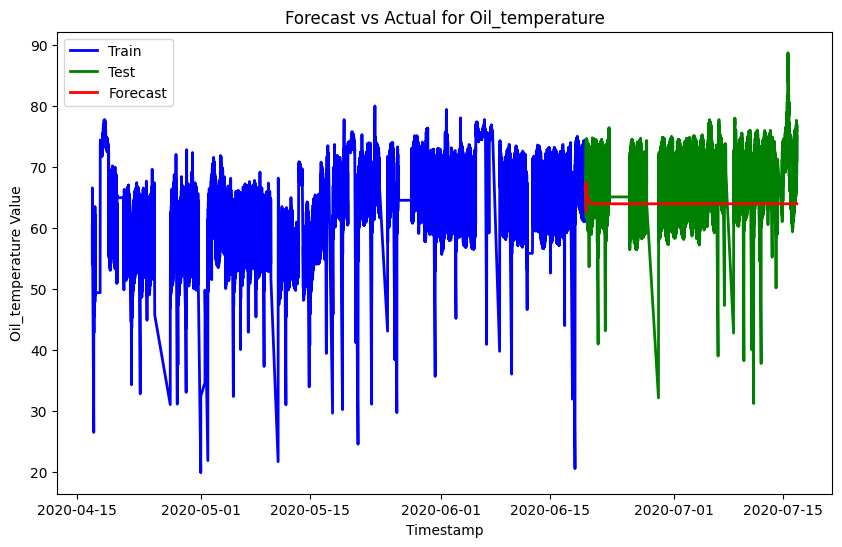

mse=5.418, rmse=2.328, mae=2.183, mape=21.326


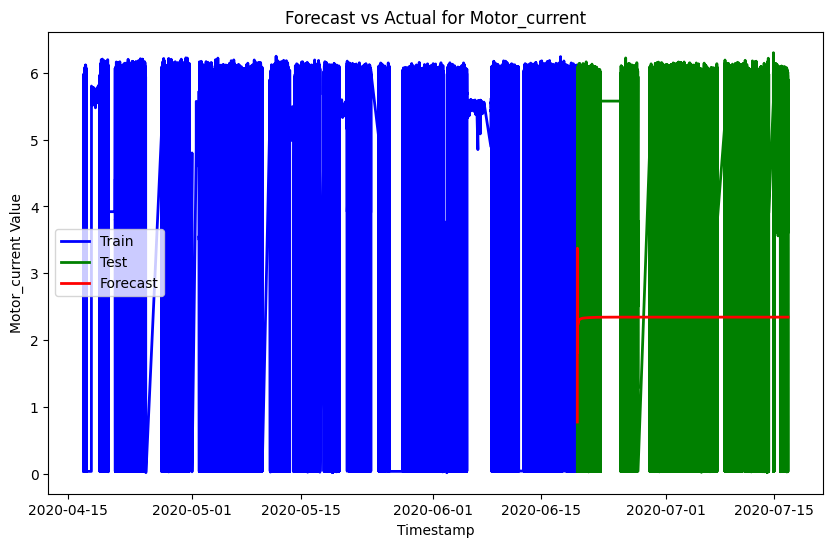

mse=0.188, rmse=0.434, mae=0.358, mape=733470284889184.750


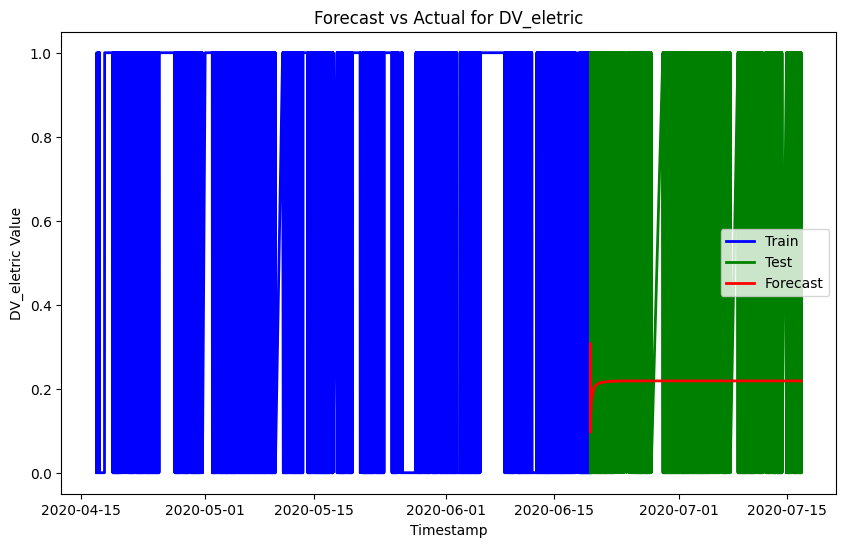

mse=0.198, rmse=0.445, mae=0.369, mape=937572581013046.875


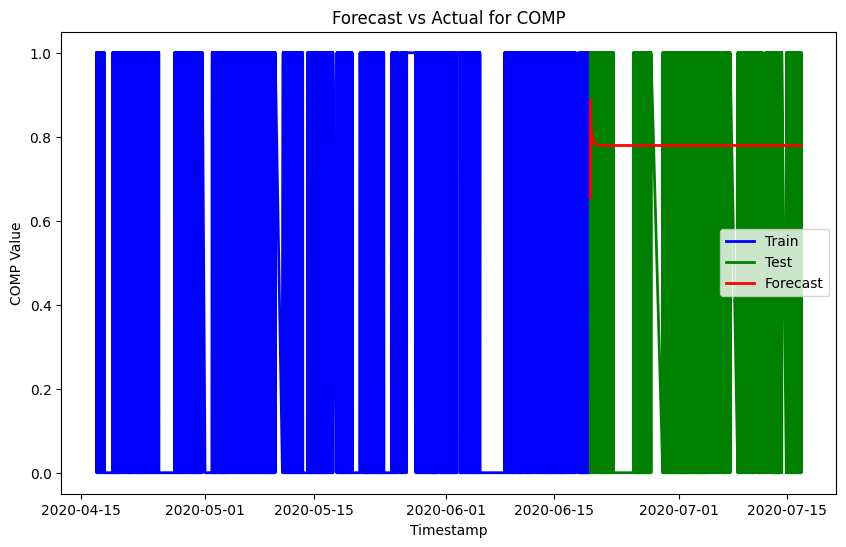

mse=0.073, rmse=0.269, mae=0.163, mape=316548432670880.500


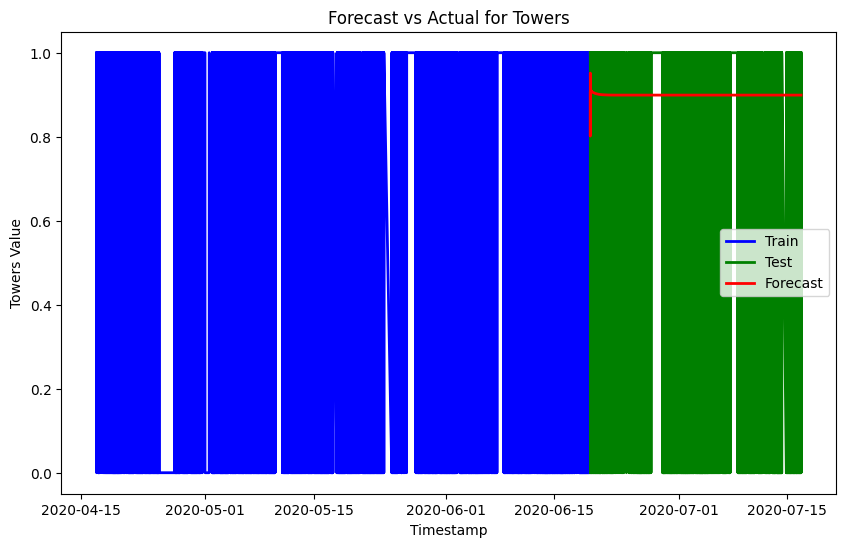

mse=0.197, rmse=0.444, mae=0.374, mape=924605885898051.625


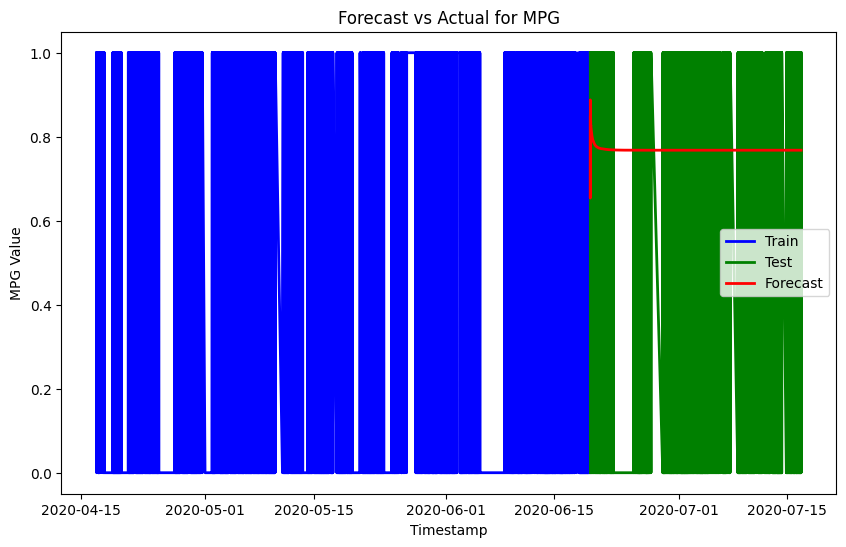

mse=0.007, rmse=0.084, mae=0.012, mape=23942686228952.246


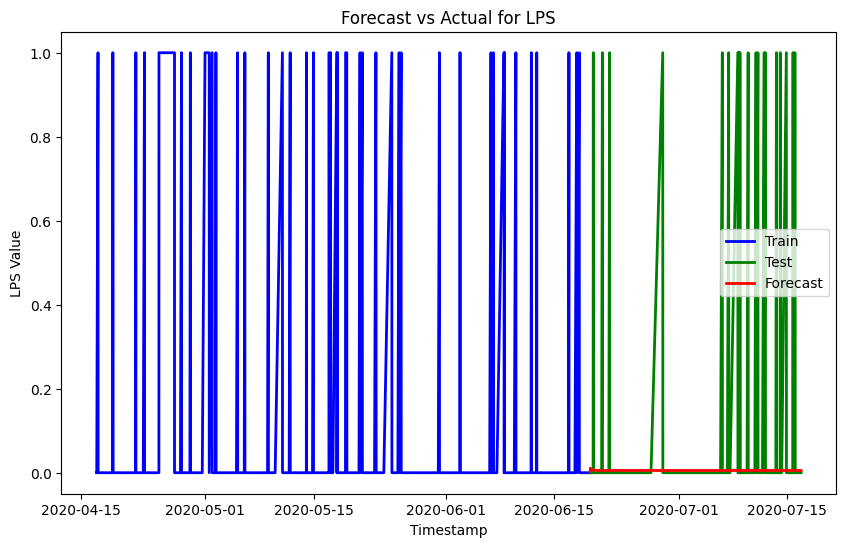

mse=0.001, rmse=0.030, mae=0.002, mape=3998681475838.352


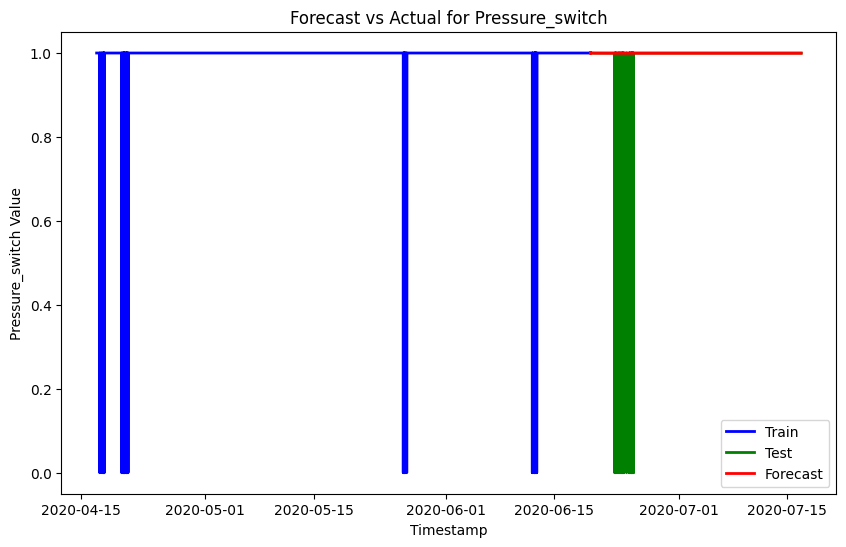

mse=0.006, rmse=0.078, mae=0.019, mape=26785351866858.898


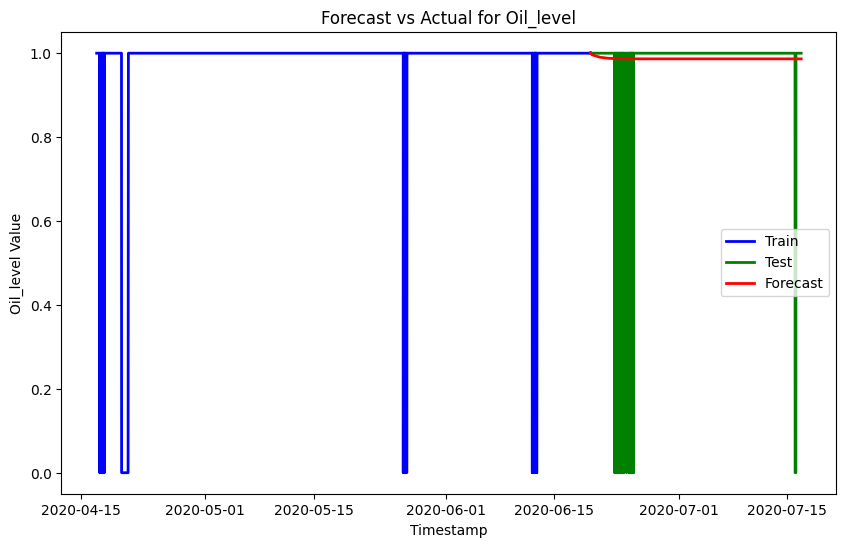

mse=0.001, rmse=0.032, mae=0.012, mape=3954353094637.788


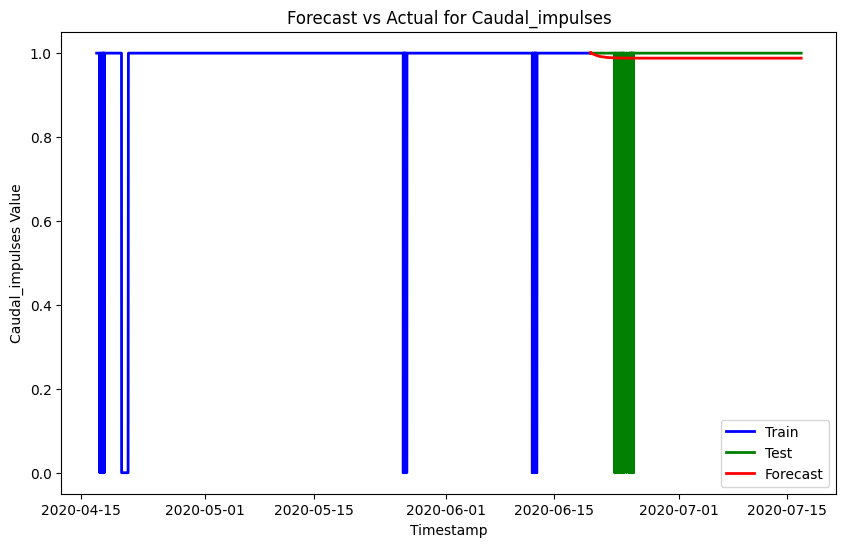

In [19]:
# Number of steps to forecast (same as the length of your test set)
n_forecast = len(test)

# Forecast the values for the test set (after training data ends)
forecasted_values = results.forecast(y=train.iloc[:, :15].values, steps=n_forecast)

# Optional: If you want to generate confidence intervals, use `forecast_interval`
# Here we are setting alpha=0.05 for 95% confidence intervals
forecast_values, lower_bounds, upper_bounds = results.forecast_interval(y=train.iloc[:, :15].values, steps=n_forecast, alpha=0.05)

# Ensure that the forecasted DataFrame contains only the columns that were used for the VAR model (excluding 'status')
forecasted_df = pd.DataFrame(forecasted_values, index=test.index, columns=test.drop(columns=['status']).columns)

# Rename forecasted columns for validation
for col in forecasted_df.columns:
    forecasted_df = forecasted_df.rename(columns={col: f'{col}_Forecast'})

# Plot and validate for each variable
for column in test.drop(columns=['status']).columns:
    plot_and_validate(train, test, forecasted_df, column)

# 14. Prophet

In [11]:
from prophet import Prophet

# Initialize the Prophet model
model = Prophet()

# Assume get_airline_data() returns the dataframe containing the time series
df1 = pd.read_csv("labeled_data.csv",index_col=0,parse_dates=True)


Processing column: TP2


17:32:01 - cmdstanpy - INFO - Chain [1] start processing
17:33:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Squared Error (MSE) for TP2: 28.958295245830598
Root Mean Squared Error (RMSE) for TP2: 5.381291224774087
Mean Absolute Error (MAE) for TP2: 4.07589297938707


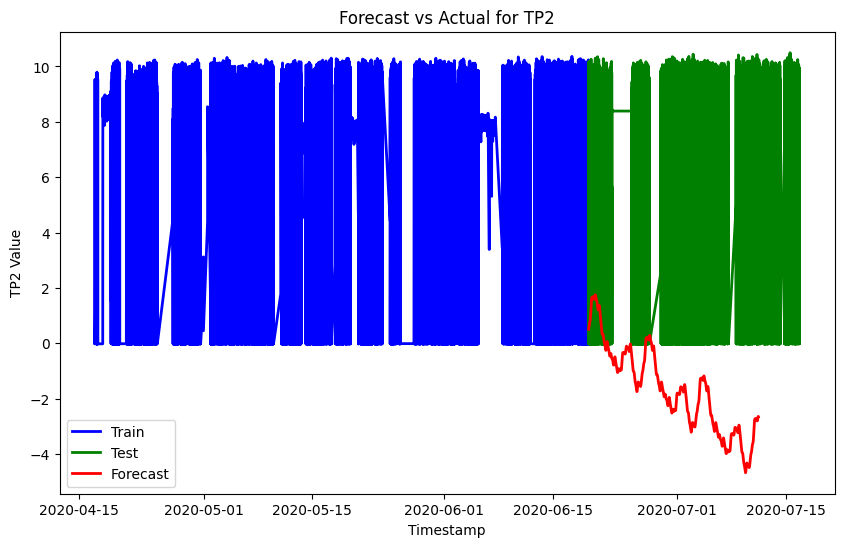

Processing column: TP3


17:33:32 - cmdstanpy - INFO - Chain [1] start processing
17:34:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Squared Error (MSE) for TP3: 1.0180108296288322
Root Mean Squared Error (RMSE) for TP3: 1.0089652271653529
Mean Absolute Error (MAE) for TP3: 0.8317725569446606


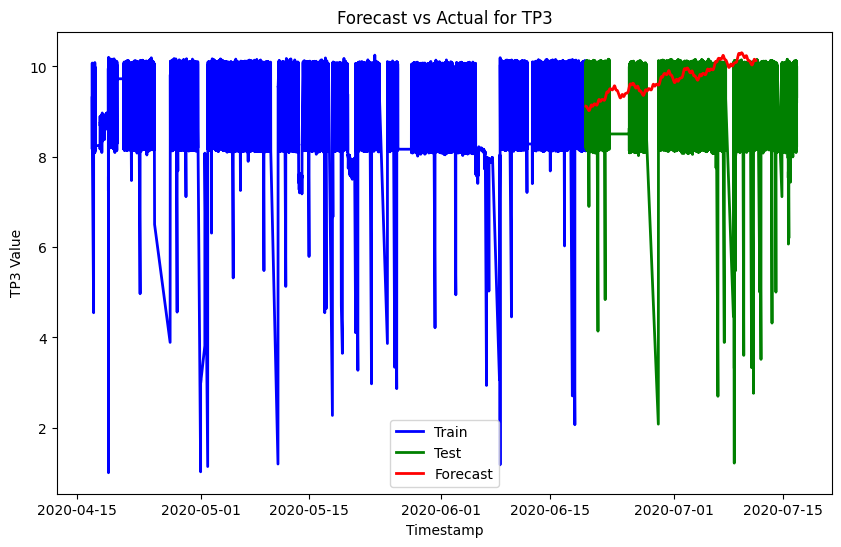

Processing column: H1


17:34:51 - cmdstanpy - INFO - Chain [1] start processing
17:37:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Squared Error (MSE) for H1: 37.194862679831814
Root Mean Squared Error (RMSE) for H1: 6.098759109837985
Mean Absolute Error (MAE) for H1: 4.863287739383107


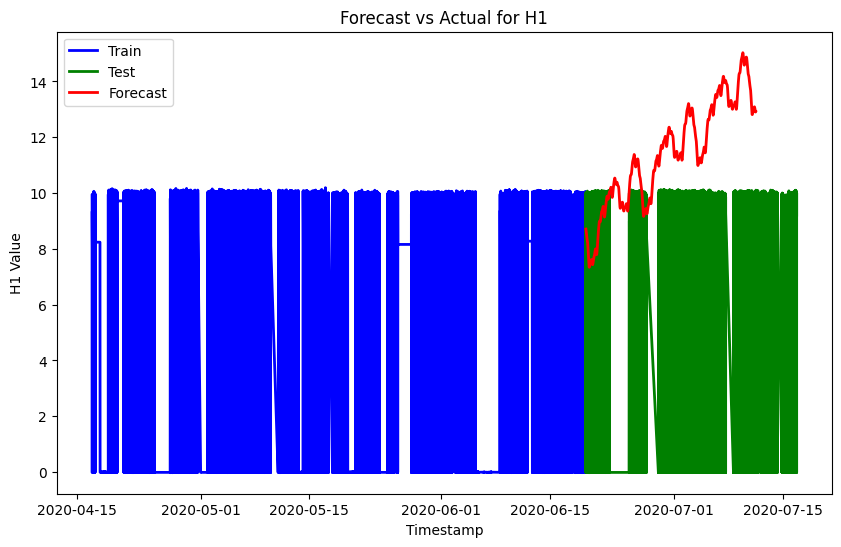

Processing column: DV_pressure


17:37:22 - cmdstanpy - INFO - Chain [1] start processing
17:39:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Squared Error (MSE) for DV_pressure: 0.7493914956517082
Root Mean Squared Error (RMSE) for DV_pressure: 0.8656740123462805
Mean Absolute Error (MAE) for DV_pressure: 0.7657624250668615


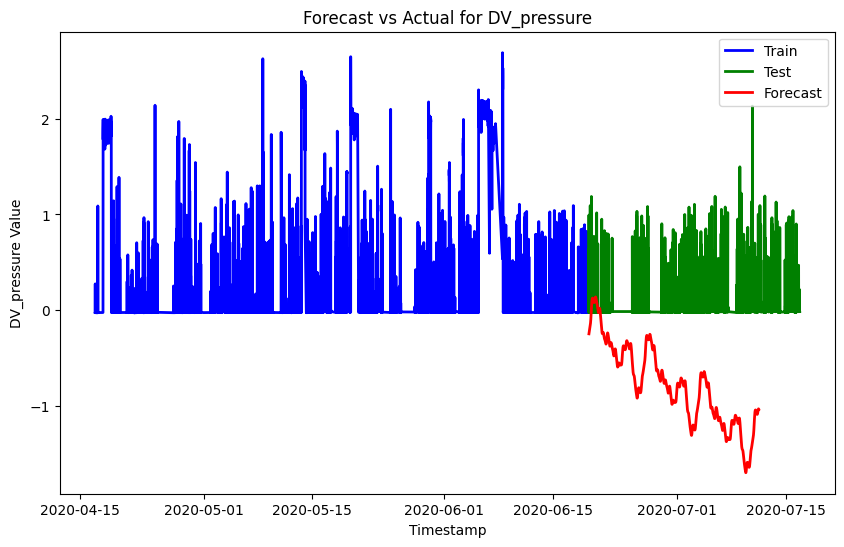

Processing column: Reservoirs


17:39:20 - cmdstanpy - INFO - Chain [1] start processing
17:40:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Squared Error (MSE) for Reservoirs: 1.0078690007362752
Root Mean Squared Error (RMSE) for Reservoirs: 1.0039267905262192
Mean Absolute Error (MAE) for Reservoirs: 0.8270400883514695


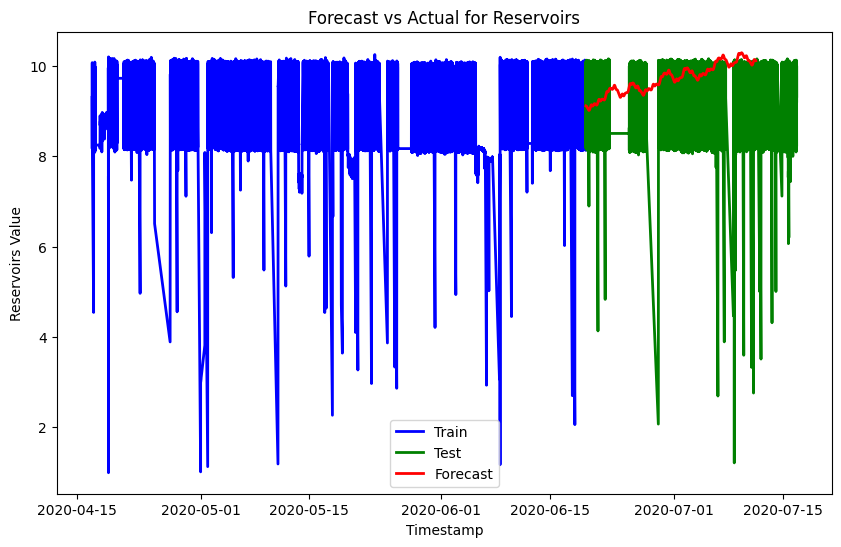

Processing column: Oil_temperature


17:40:12 - cmdstanpy - INFO - Chain [1] start processing
17:41:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Squared Error (MSE) for Oil_temperature: 16.565989959350546
Root Mean Squared Error (RMSE) for Oil_temperature: 4.070133899437529
Mean Absolute Error (MAE) for Oil_temperature: 3.2247534034925494


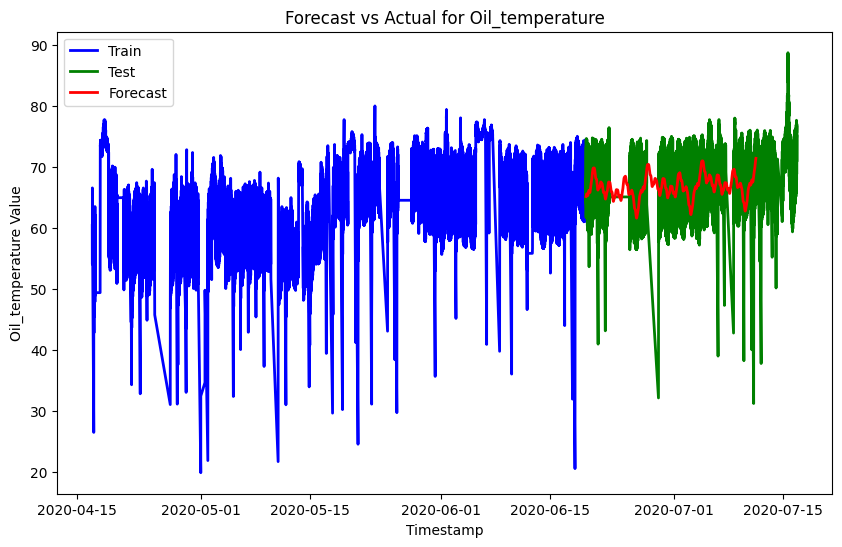

Processing column: Motor_current


17:41:41 - cmdstanpy - INFO - Chain [1] start processing
17:42:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Squared Error (MSE) for Motor_current: 7.629320638571836
Root Mean Squared Error (RMSE) for Motor_current: 2.7621224879740285
Mean Absolute Error (MAE) for Motor_current: 2.3848610566018613


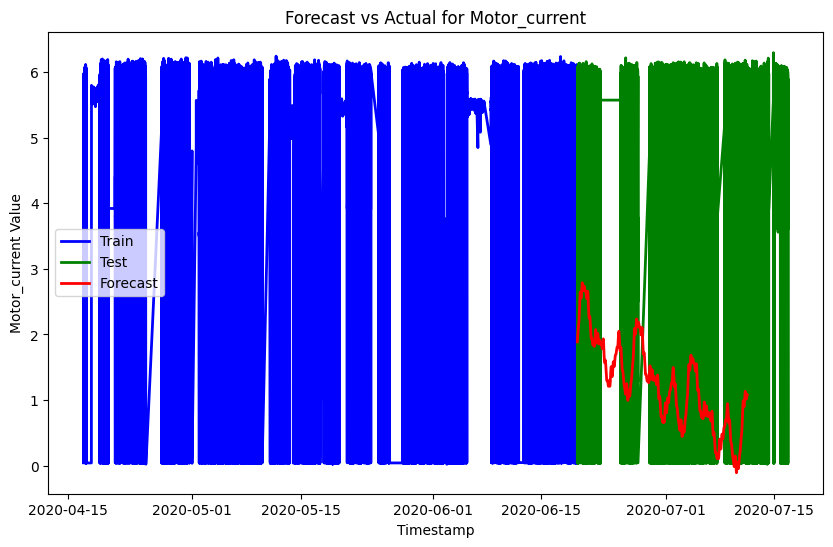

Processing column: DV_eletric


17:42:55 - cmdstanpy - INFO - Chain [1] start processing
17:43:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Squared Error (MSE) for DV_eletric: 0.5282257671522291
Root Mean Squared Error (RMSE) for DV_eletric: 0.7267914192890758
Mean Absolute Error (MAE) for DV_eletric: 0.5879050854206096


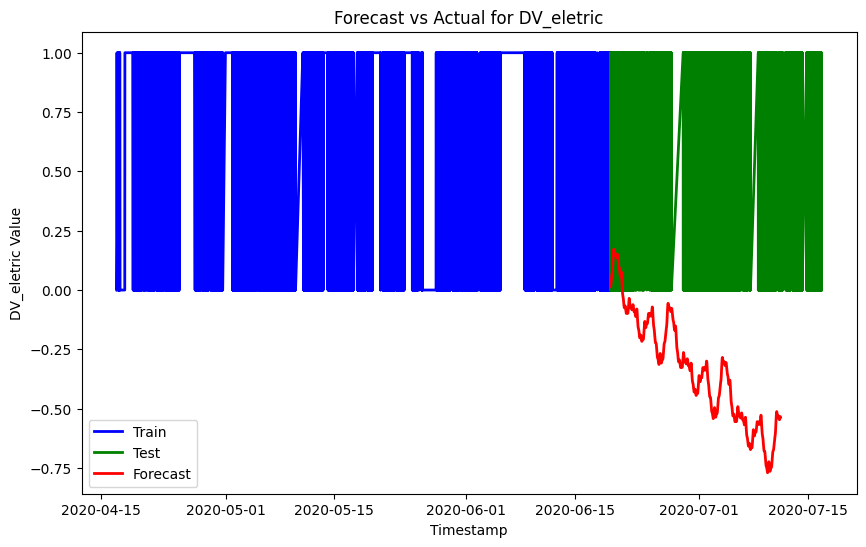

Processing column: COMP


17:44:07 - cmdstanpy - INFO - Chain [1] start processing
17:45:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Squared Error (MSE) for COMP: 0.502318502107397
Root Mean Squared Error (RMSE) for COMP: 0.7087443136332009
Mean Absolute Error (MAE) for COMP: 0.5628729973855793


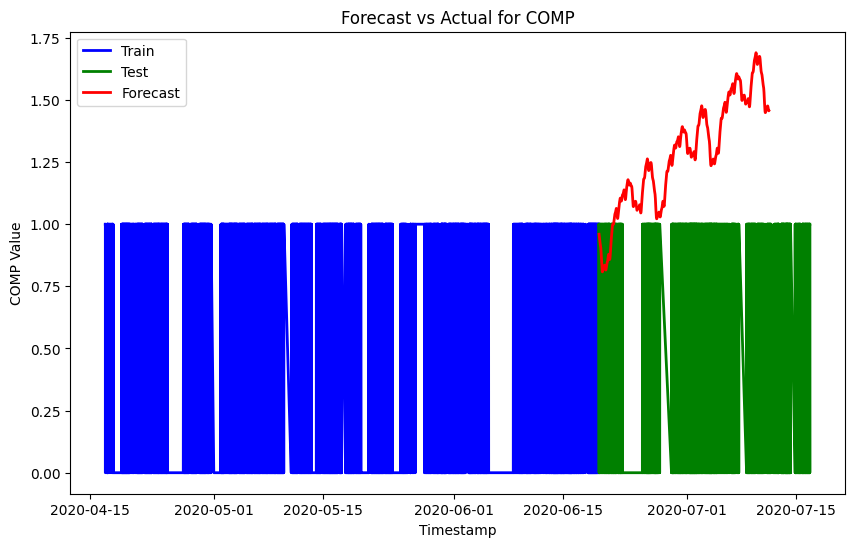

Processing column: Towers


17:45:25 - cmdstanpy - INFO - Chain [1] start processing
17:46:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Squared Error (MSE) for Towers: 0.15153291010638864
Root Mean Squared Error (RMSE) for Towers: 0.3892722827358617
Mean Absolute Error (MAE) for Towers: 0.2703714324707067


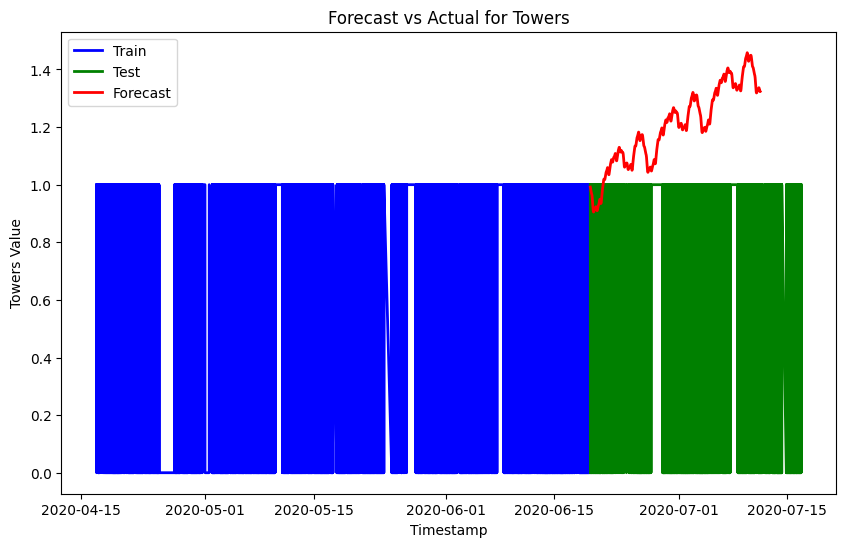

Processing column: MPG


17:46:30 - cmdstanpy - INFO - Chain [1] start processing
17:47:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Squared Error (MSE) for MPG: 0.5317975895091519
Root Mean Squared Error (RMSE) for MPG: 0.7292445334105371
Mean Absolute Error (MAE) for MPG: 0.5857203282389705


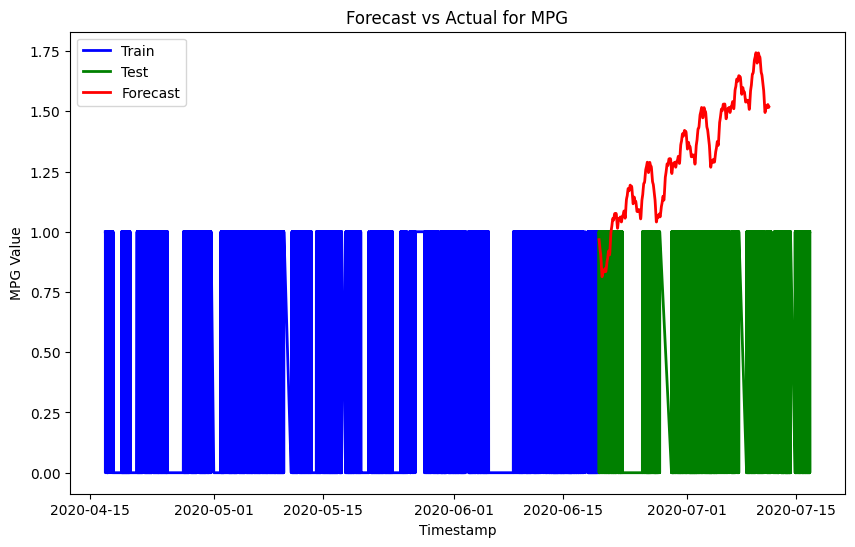

Processing column: LPS


17:47:37 - cmdstanpy - INFO - Chain [1] start processing
17:47:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Squared Error (MSE) for LPS: 0.003876965513024442
Root Mean Squared Error (RMSE) for LPS: 0.062265283369020666
Mean Absolute Error (MAE) for LPS: 0.020650245435303


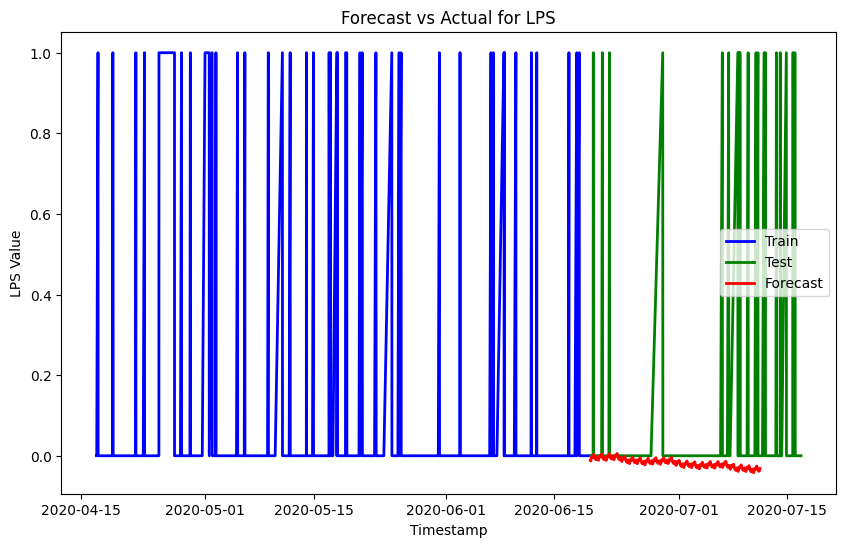

Processing column: Pressure_switch


17:48:01 - cmdstanpy - INFO - Chain [1] start processing
17:48:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Squared Error (MSE) for Pressure_switch: 0.0010878308341401813
Root Mean Squared Error (RMSE) for Pressure_switch: 0.032982280608535565
Mean Absolute Error (MAE) for Pressure_switch: 0.0018708456249937248


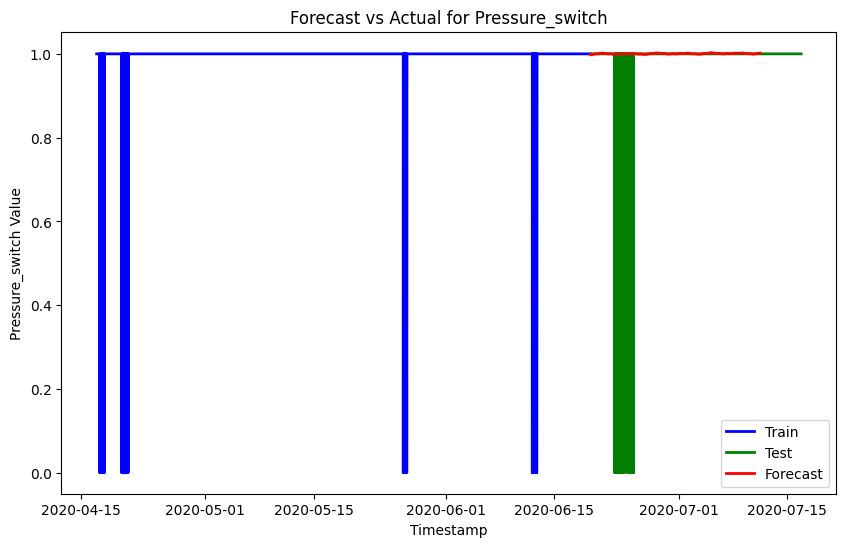

Processing column: Oil_level


17:48:23 - cmdstanpy - INFO - Chain [1] start processing
17:50:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Squared Error (MSE) for Oil_level: 0.0015781431693171102
Root Mean Squared Error (RMSE) for Oil_level: 0.03972585013963968
Mean Absolute Error (MAE) for Oil_level: 0.02072790619175071


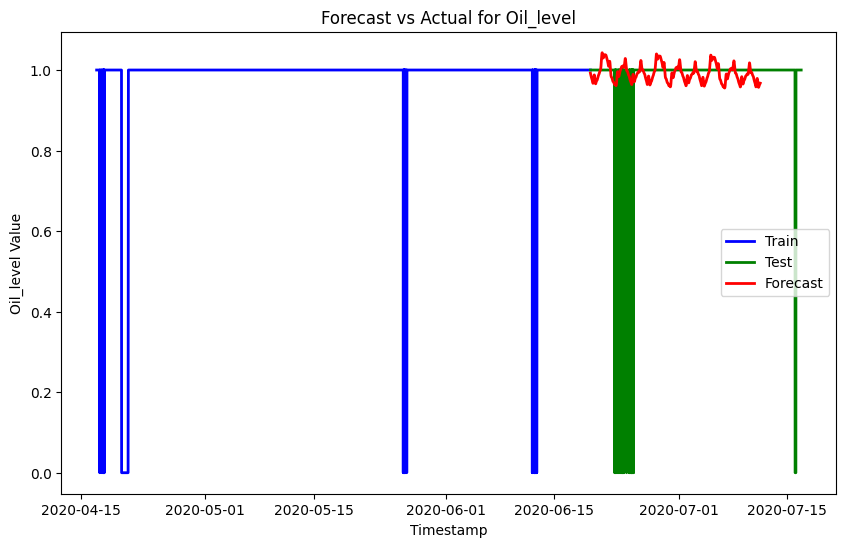

Processing column: Caudal_impulses


17:50:16 - cmdstanpy - INFO - Chain [1] start processing
17:51:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Squared Error (MSE) for Caudal_impulses: 0.0015781431693171102
Root Mean Squared Error (RMSE) for Caudal_impulses: 0.03972585013963968
Mean Absolute Error (MAE) for Caudal_impulses: 0.02072790619175071


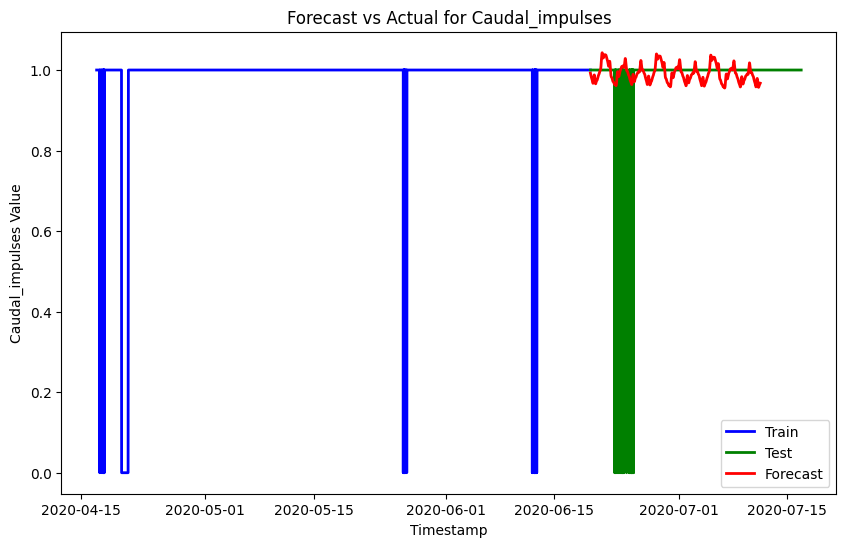

In [43]:
import pandas as pd
import matplotlib.pyplot as plt
from prophet import Prophet

# Load your data
df1 = pd.read_csv("labeled_data.csv", index_col=0, parse_dates=True)

# Ensure 'ds' (timestamp) is set as the datetime index
df1['ds'] = df1.index  # Set the 'ds' column as the datetime index for Prophet

# Exclude 'status' and iterate over the remaining columns
columns_to_forecast = ['TP2', 'TP3', 'H1', 'DV_pressure', 'Reservoirs', 'Oil_temperature',
       'Motor_current', 'DV_eletric', 'COMP', 'Towers', 'MPG', 'LPS',
       'Pressure_switch', 'Oil_level', 'Caudal_impulses']

# Split data into train and test sets
train_size = int(len(df1) * 0.7)

# Define the validate function
# Adjusting the validate function
def validate(test_df, pred_df, var):
    # Check if the variable exists in the test_df as 'y'
    if 'y' not in test_df.columns:
        print(f"Error: 'y' not found in test_df.")
        return
    if f'{var}_Forecast' not in pred_df.columns:
        print(f"Error: '{var}_Forecast' not found in pred_df.")
        return

    # Calculate and print error metrics
    mse = ((test_df['y'] - pred_df[f'{var}_Forecast']) ** 2).mean()
    rmse = mse ** 0.5
    mae = (test_df['y'] - pred_df[f'{var}_Forecast']).abs().mean()

    print(f"Mean Squared Error (MSE) for {var}: {mse}")
    print(f"Root Mean Squared Error (RMSE) for {var}: {rmse}")
    print(f"Mean Absolute Error (MAE) for {var}: {mae}")


# Define the plotting and validation function
def plot_and_validate(train_df, test_df, pred_df, var_name):
    # Plot the Train data with the timestamp (x-axis)
    plt.figure(figsize=(10, 6))
    plt.plot(train_df['ds'], train_df['y'], label='Train', linewidth=2, color='blue')

    # Plot the Test data with the timestamp (x-axis)
    plt.plot(test_df['ds'], test_df['y'], label='Test', linewidth=2, color='green')

    # Plot the Forecast data with the timestamp (x-axis)
    plt.plot(pred_df.index, pred_df[f'{var_name}_Forecast'], label='Forecast', linewidth=2, color='red')

    # Validate predictions (error metrics)
    validate(test_df, pred_df, var_name)

    # Set the title and labels for the axes
    plt.title(f"Forecast vs Actual for {var_name}")
    plt.xlabel("Timestamp")
    plt.ylabel(f"{var_name} Value")

    # Add a legend
    plt.legend()

    # Show the plot
    plt.show()

# Iterate over each column (excluding 'status' and 'ds')
for column in columns_to_forecast:
        print(f"Processing column: {column}")
        
        # Create a temporary DataFrame for Prophet, ensuring 'ds' is included
        temp_df = df1[['ds', column]].rename(columns={column: 'y'})  # Prophet expects 'y' as target
        
        # Split into train and test for the specific column
        train = temp_df[:train_size]
        test = temp_df[train_size:]
        
        # Fit the model for the current column
        model = Prophet()
        model.fit(train)
        
        # Create future DataFrame for predictions
        future = model.make_future_dataframe(periods=len(test), freq='T', include_history=False)
        
        # Generate predictions
        forecast = model.predict(future)
        
        # Prepare forecast DataFrame for validation
        forecast_df = forecast[['ds', 'yhat']].rename(columns={'yhat': f'{column}_Forecast'})
        forecast_df.set_index('ds', inplace=True)
        
        # Merge forecast with test data
        pred_df = test.join(forecast_df, how='outer')
        
        # Call the plotting and validation function for the current column
        plot_and_validate(train, test, pred_df, column)

# 16. LSTM

In [3]:
df=pd.read_csv("labeled_data.csv",index_col=0,parse_dates=True)

In [4]:
train_size = int(len(df) * 0.7)

train = df[:train_size]  
test = df[train_size:]   

print(f"Training data shape: {train.shape}")
print(f"Testing data shape: {test.shape}")

Training data shape: (73535, 16)
Testing data shape: (31515, 16)


Forecasting for TP2
Epoch 1/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 22s 7ms/step - loss: 0.0314 - val_loss: 0.0200
Epoch 2/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 19s 6ms/step - loss: 0.0140 - val_loss: 0.0186
Epoch 3/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 15s 6ms/step - loss: 0.0126 - val_loss: 0.0184
Epoch 4/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 15s 6ms/step - loss: 0.0126 - val_loss: 0.0180
Epoch 5/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 15s 6ms/step - loss: 0.0118 - val_loss: 0.0176
Epoch 6/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 20s 6ms/step - loss: 0.0118 - val_loss: 0.0178
Epoch 7/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 21s 6ms/step - loss: 0.0119 - val_loss: 0.0180
Epoch 8/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 16s 6ms/step - loss: 0.0120 - val_loss: 0.0182
Epoch 9/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 15s 6ms/step - loss: 0.0121 - val_loss: 0.0176
Epoch 10/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 16s 6ms/step - loss: 0.0117 - val_loss: 0.0182
Epoch 11/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 20s 7ms/step - loss: 0.0116 - val_loss: 0.0178

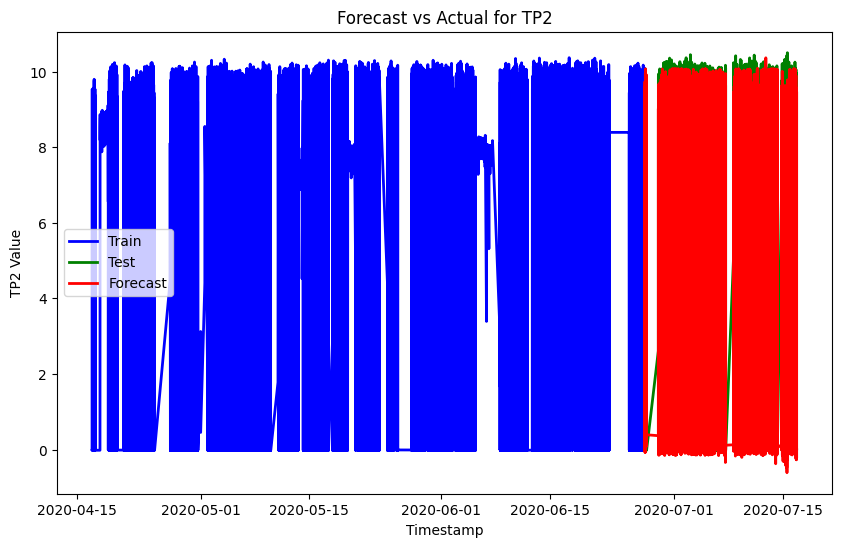

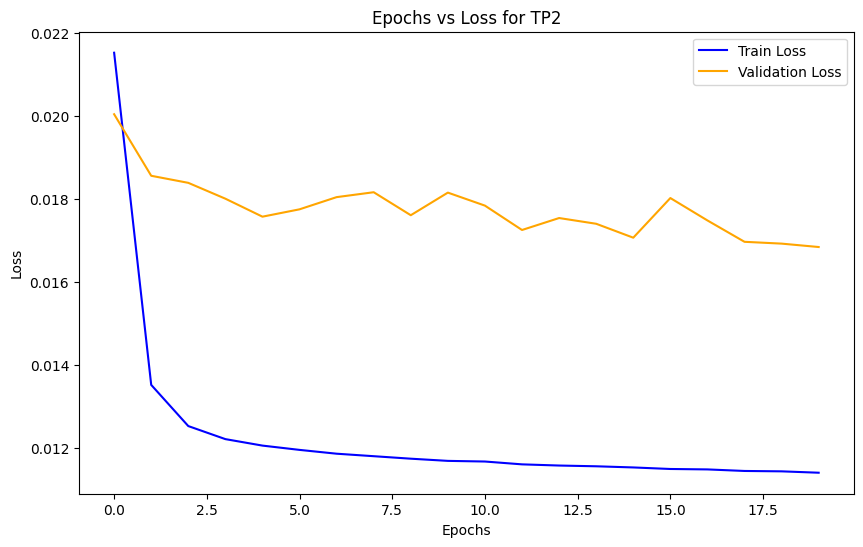

Forecasting for TP3
Epoch 1/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 24s 8ms/step - loss: 0.0097 - val_loss: 8.9235e-04
Epoch 2/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 20s 8ms/step - loss: 6.2898e-04 - val_loss: 8.4403e-04
Epoch 3/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 19s 7ms/step - loss: 6.2822e-04 - val_loss: 8.3095e-04
Epoch 4/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 20s 7ms/step - loss: 6.0966e-04 - val_loss: 8.3351e-04
Epoch 5/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 19s 7ms/step - loss: 5.6811e-04 - val_loss: 7.6402e-04
Epoch 6/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 19s 7ms/step - loss: 5.3931e-04 - val_loss: 7.5426e-04
Epoch 7/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 20s 8ms/step - loss: 5.2119e-04 - val_loss: 7.6872e-04
Epoch 8/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 21s 8ms/step - loss: 4.6988e-04 - val_loss: 7.1750e-04
Epoch 9/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 21s 8ms/step - loss: 4.1981e-04 - val_loss: 6.8840e-04
Epoch 10/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 40s 7ms/step - loss: 3.9125e-04 - val_loss: 5.9204e-04
Epoch 11/20
2

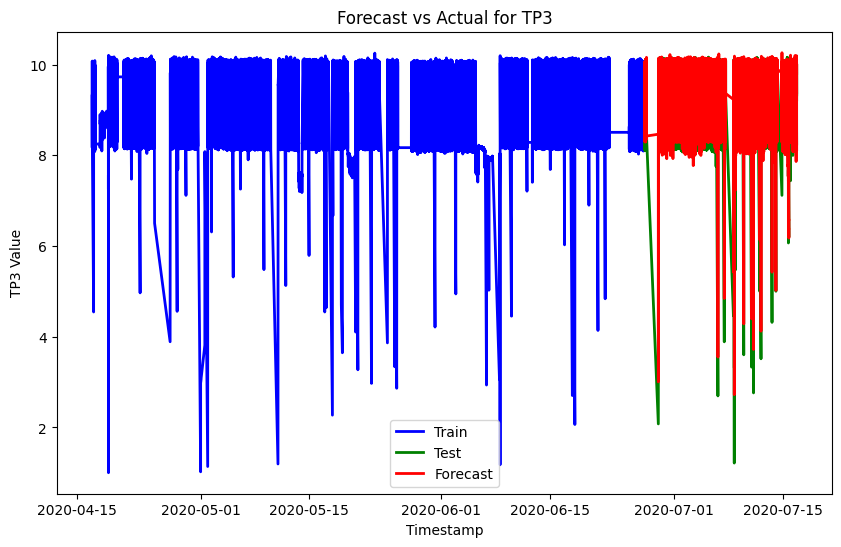

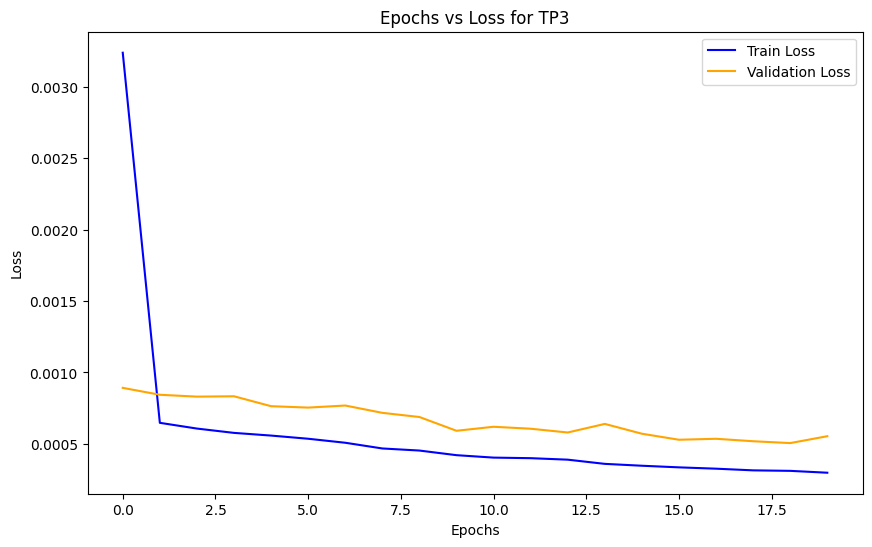

Forecasting for H1
Epoch 1/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 23s 7ms/step - loss: 0.0481 - val_loss: 0.0249
Epoch 2/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 18s 7ms/step - loss: 0.0154 - val_loss: 0.0205
Epoch 3/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 18s 7ms/step - loss: 0.0128 - val_loss: 0.0179
Epoch 4/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 18s 7ms/step - loss: 0.0121 - val_loss: 0.0164
Epoch 5/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 18s 7ms/step - loss: 0.0111 - val_loss: 0.0186
Epoch 6/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 22s 8ms/step - loss: 0.0108 - val_loss: 0.0162
Epoch 7/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 43s 9ms/step - loss: 0.0099 - val_loss: 0.0147
Epoch 8/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 36s 7ms/step - loss: 0.0098 - val_loss: 0.0136
Epoch 9/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 26s 9ms/step - loss: 0.0093 - val_loss: 0.0189
Epoch 10/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 20s 8ms/step - loss: 0.0094 - val_loss: 0.0136
Epoch 11/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 20s 7ms/step - loss: 0.0092 - val_loss: 0.0128


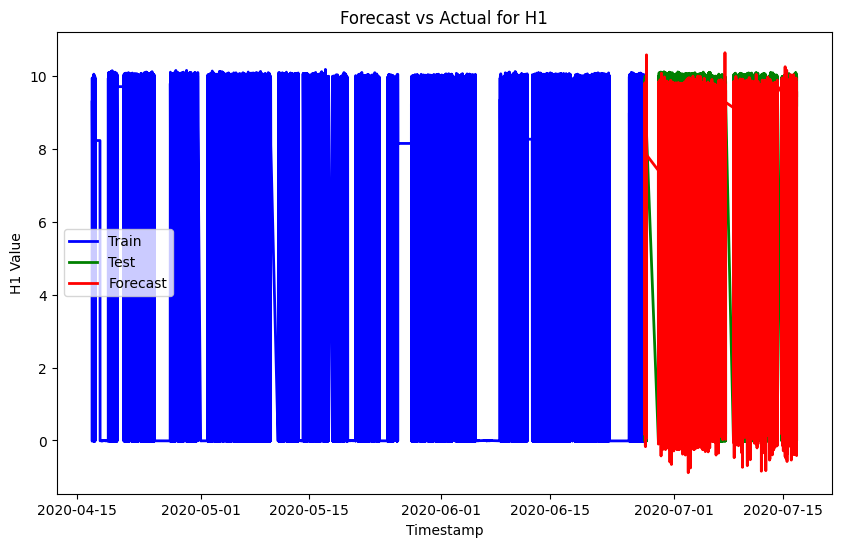

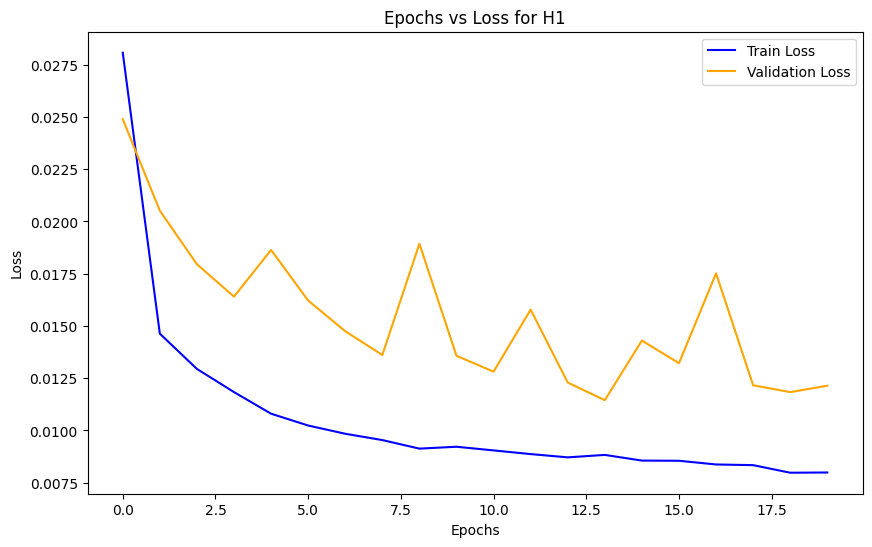

Forecasting for DV_pressure
Epoch 1/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 37s 9ms/step - loss: 0.0018 - val_loss: 7.9616e-04
Epoch 2/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 22s 8ms/step - loss: 8.5786e-04 - val_loss: 7.4347e-04
Epoch 3/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 41s 8ms/step - loss: 9.2258e-04 - val_loss: 7.2769e-04
Epoch 4/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 22s 8ms/step - loss: 8.2020e-04 - val_loss: 7.0149e-04
Epoch 5/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 20s 8ms/step - loss: 8.1926e-04 - val_loss: 6.9883e-04
Epoch 6/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 20s 7ms/step - loss: 8.4989e-04 - val_loss: 7.0022e-04
Epoch 7/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 19s 7ms/step - loss: 7.9803e-04 - val_loss: 6.6730e-04
Epoch 8/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 21s 8ms/step - loss: 8.4761e-04 - val_loss: 6.7520e-04
Epoch 9/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 20s 8ms/step - loss: 8.1843e-04 - val_loss: 6.8488e-04
Epoch 10/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 21s 8ms/step - loss: 8.1644e-04 - val_loss: 7.1633e-04
Epoch

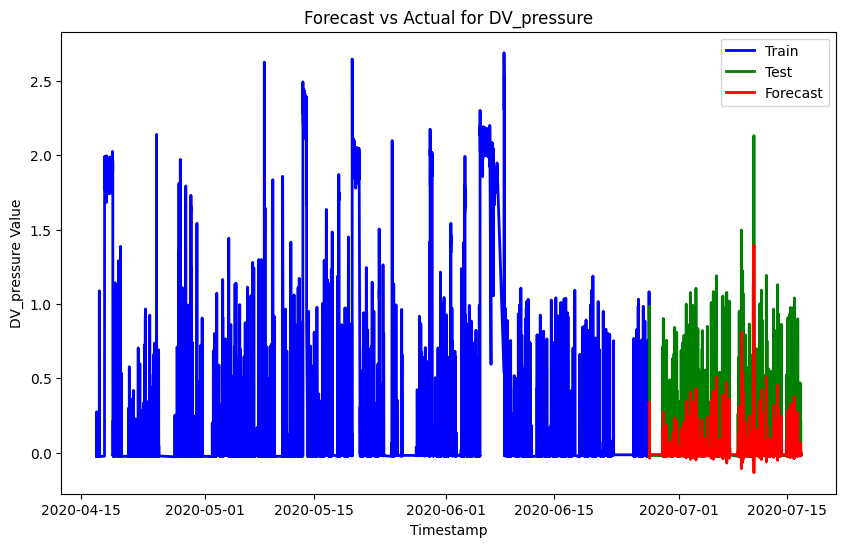

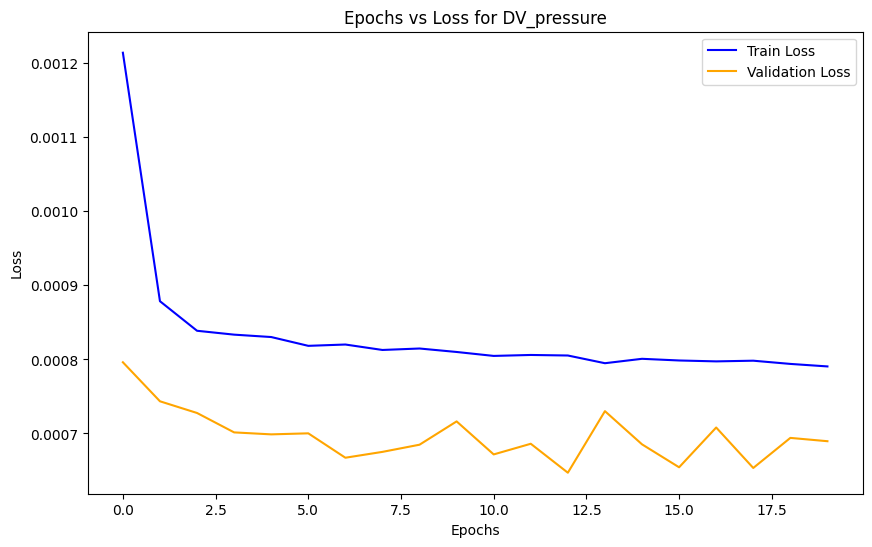

Forecasting for Reservoirs
Epoch 1/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 23s 7ms/step - loss: 0.0135 - val_loss: 0.0012
Epoch 2/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 20s 7ms/step - loss: 7.5224e-04 - val_loss: 8.6034e-04
Epoch 3/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 18s 7ms/step - loss: 6.3869e-04 - val_loss: 8.4574e-04
Epoch 4/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 18s 7ms/step - loss: 6.0852e-04 - val_loss: 8.2945e-04
Epoch 5/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 19s 7ms/step - loss: 5.8483e-04 - val_loss: 7.8366e-04
Epoch 6/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 19s 7ms/step - loss: 5.3122e-04 - val_loss: 7.7134e-04
Epoch 7/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 18s 7ms/step - loss: 4.7186e-04 - val_loss: 7.2803e-04
Epoch 8/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 18s 7ms/step - loss: 4.8381e-04 - val_loss: 6.4342e-04
Epoch 9/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 19s 7ms/step - loss: 4.4269e-04 - val_loss: 6.5378e-04
Epoch 10/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 18s 7ms/step - loss: 3.8044e-04 - val_loss: 5.9203e-04
Epoch 11/2

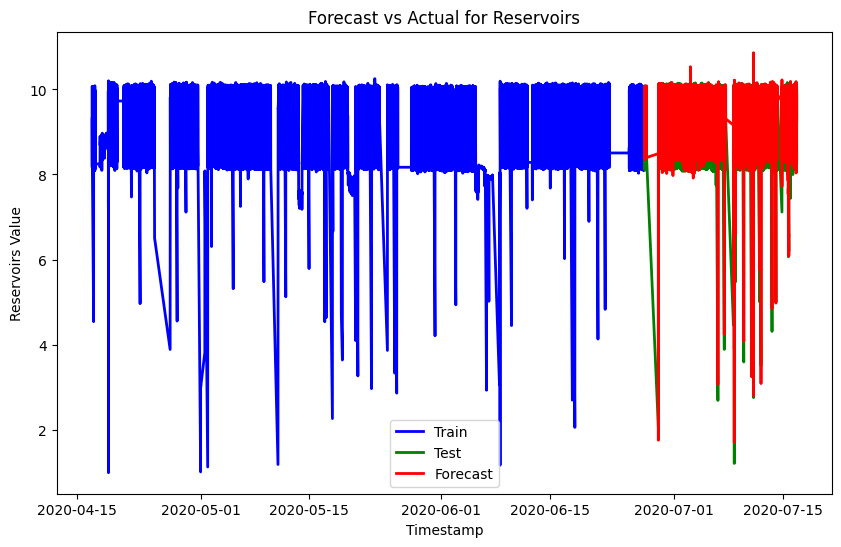

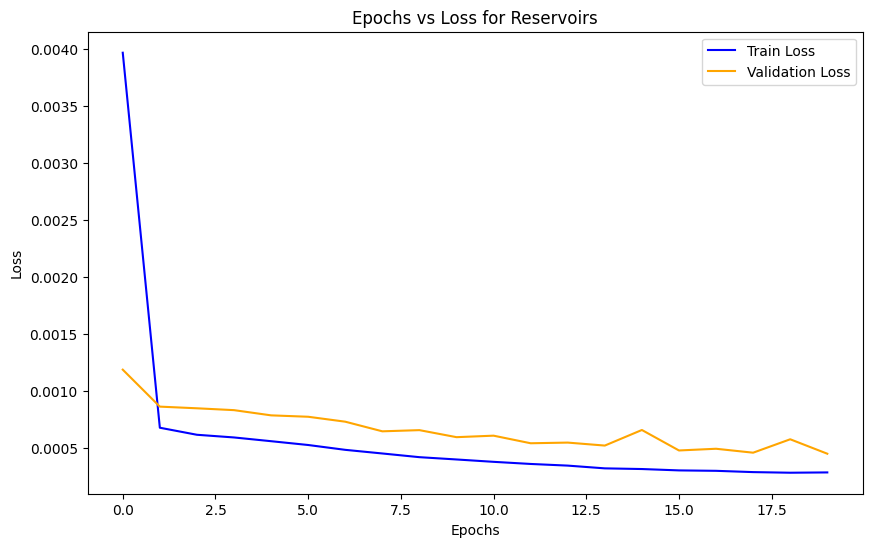

Forecasting for Oil_temperature
Epoch 1/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 20s 7ms/step - loss: 0.0100 - val_loss: 6.6845e-04
Epoch 2/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 19s 6ms/step - loss: 4.1409e-04 - val_loss: 5.2374e-04
Epoch 3/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 17s 7ms/step - loss: 3.7685e-04 - val_loss: 5.1691e-04
Epoch 4/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 20s 6ms/step - loss: 3.5768e-04 - val_loss: 4.1811e-04
Epoch 5/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 18s 7ms/step - loss: 3.3586e-04 - val_loss: 4.4663e-04
Epoch 6/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 21s 8ms/step - loss: 3.0879e-04 - val_loss: 3.7813e-04
Epoch 7/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 18s 7ms/step - loss: 2.8002e-04 - val_loss: 3.6206e-04
Epoch 8/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 20s 7ms/step - loss: 2.9492e-04 - val_loss: 3.5669e-04
Epoch 9/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 17s 7ms/step - loss: 2.9449e-04 - val_loss: 3.4413e-04
Epoch 10/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 20s 6ms/step - loss: 2.4660e-04 - val_loss: 3.3109e-04
E

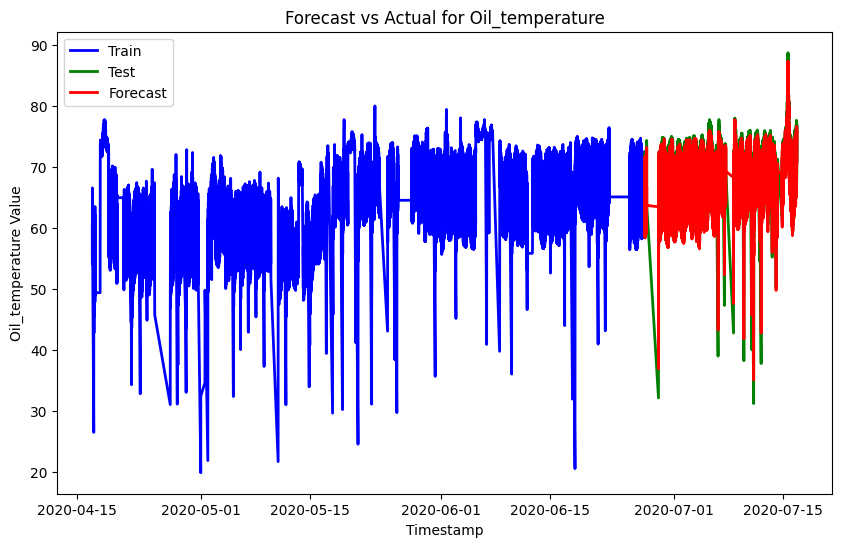

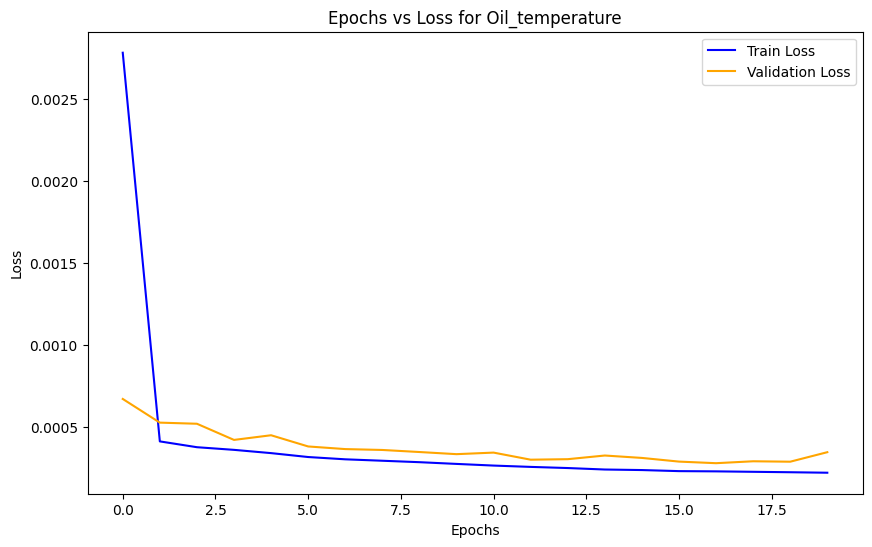

Forecasting for Motor_current
Epoch 1/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 21s 7ms/step - loss: 0.0456 - val_loss: 0.0260
Epoch 2/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 19s 6ms/step - loss: 0.0154 - val_loss: 0.0213
Epoch 3/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 17s 7ms/step - loss: 0.0144 - val_loss: 0.0205
Epoch 4/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 17s 6ms/step - loss: 0.0137 - val_loss: 0.0196
Epoch 5/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 17s 6ms/step - loss: 0.0137 - val_loss: 0.0190
Epoch 6/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 17s 6ms/step - loss: 0.0132 - val_loss: 0.0185
Epoch 7/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 17s 6ms/step - loss: 0.0133 - val_loss: 0.0184
Epoch 8/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 20s 6ms/step - loss: 0.0132 - val_loss: 0.0184
Epoch 9/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 17s 7ms/step - loss: 0.0126 - val_loss: 0.0182
Epoch 10/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 20s 6ms/step - loss: 0.0128 - val_loss: 0.0175
Epoch 11/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 17s 7ms/step - loss: 0.0131 - val_lo

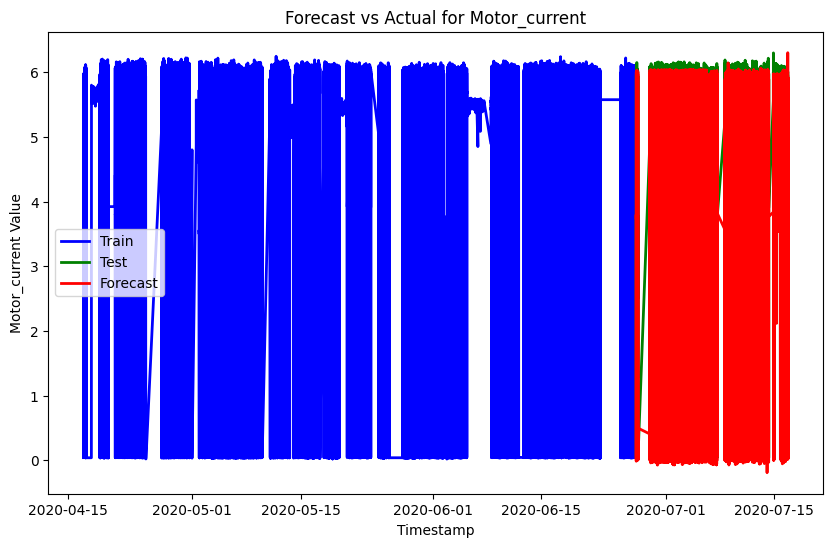

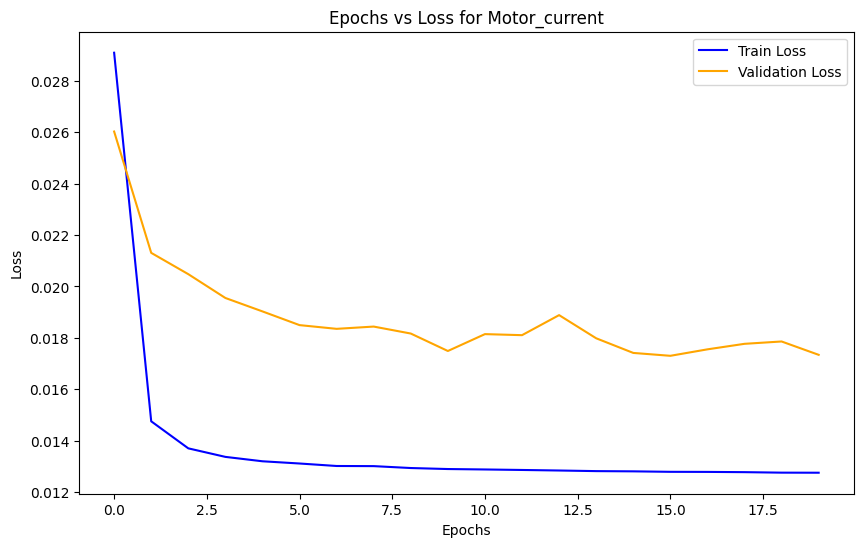

Forecasting for DV_eletric
Epoch 1/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 21s 7ms/step - loss: 0.0651 - val_loss: 0.0691
Epoch 2/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 18s 7ms/step - loss: 0.0453 - val_loss: 0.0670
Epoch 3/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 18s 7ms/step - loss: 0.0452 - val_loss: 0.0675
Epoch 4/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 18s 7ms/step - loss: 0.0459 - val_loss: 0.0685
Epoch 5/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 18s 7ms/step - loss: 0.0451 - val_loss: 0.0677
Epoch 6/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 19s 6ms/step - loss: 0.0465 - val_loss: 0.0685
Epoch 7/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 17s 7ms/step - loss: 0.0459 - val_loss: 0.0677
Epoch 8/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 17s 7ms/step - loss: 0.0463 - val_loss: 0.0678
Epoch 9/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 17s 6ms/step - loss: 0.0454 - val_loss: 0.0688
Epoch 10/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 17s 6ms/step - loss: 0.0449 - val_loss: 0.0684
Epoch 11/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 18s 7ms/step - loss: 0.0458 - val_loss:

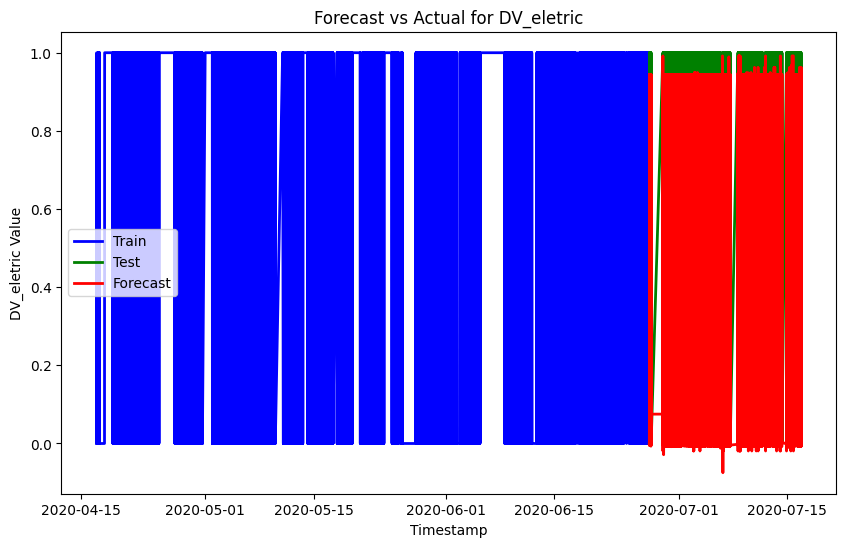

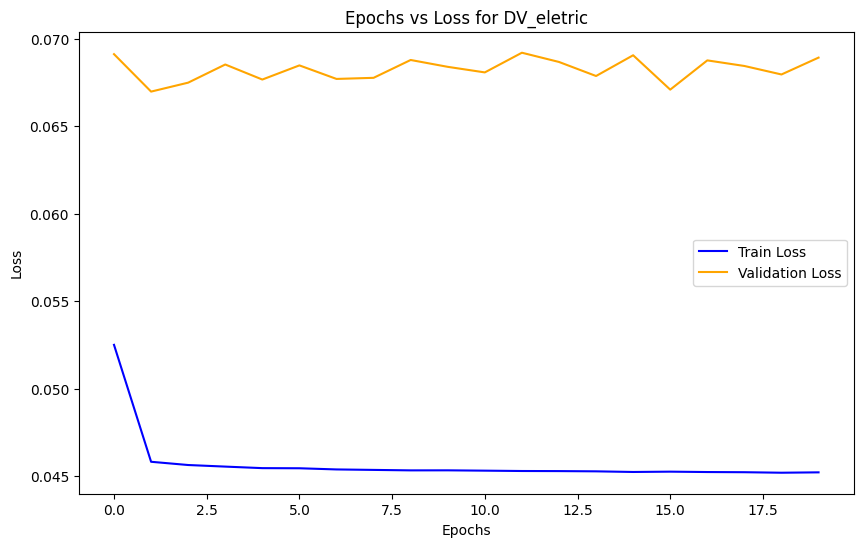

Forecasting for COMP
Epoch 1/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 21s 7ms/step - loss: 0.0807 - val_loss: 0.0732
Epoch 2/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 17s 7ms/step - loss: 0.0498 - val_loss: 0.0720
Epoch 3/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 22s 7ms/step - loss: 0.0482 - val_loss: 0.0732
Epoch 4/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 17s 7ms/step - loss: 0.0483 - val_loss: 0.0727
Epoch 5/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 20s 7ms/step - loss: 0.0477 - val_loss: 0.0729
Epoch 6/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 18s 7ms/step - loss: 0.0482 - val_loss: 0.0708
Epoch 7/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 18s 7ms/step - loss: 0.0485 - val_loss: 0.0708
Epoch 8/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 20s 7ms/step - loss: 0.0479 - val_loss: 0.0703
Epoch 9/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 18s 7ms/step - loss: 0.0481 - val_loss: 0.0698
Epoch 10/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 18s 7ms/step - loss: 0.0475 - val_loss: 0.0709
Epoch 11/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 18s 7ms/step - loss: 0.0486 - val_loss: 0.071

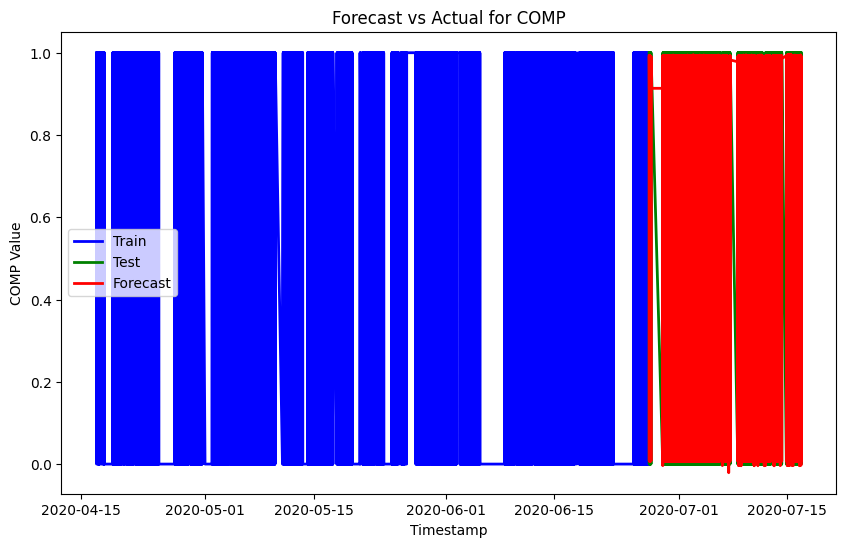

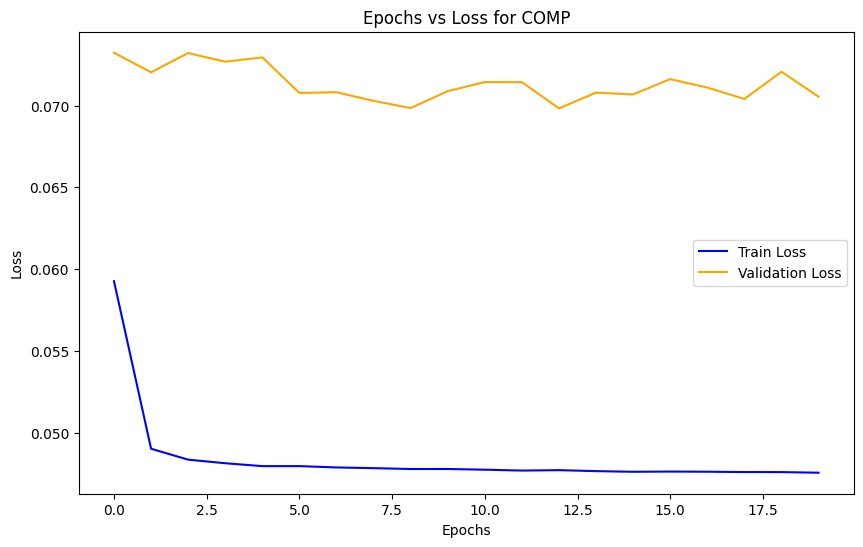

Forecasting for Towers
Epoch 1/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 20s 7ms/step - loss: 0.0820 - val_loss: 0.0792
Epoch 2/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 17s 7ms/step - loss: 0.0552 - val_loss: 0.0753
Epoch 3/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 17s 6ms/step - loss: 0.0511 - val_loss: 0.0732
Epoch 4/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 17s 7ms/step - loss: 0.0504 - val_loss: 0.0746
Epoch 5/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 18s 7ms/step - loss: 0.0496 - val_loss: 0.0735
Epoch 6/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 17s 7ms/step - loss: 0.0511 - val_loss: 0.0746
Epoch 7/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 17s 7ms/step - loss: 0.0502 - val_loss: 0.0755
Epoch 8/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 20s 6ms/step - loss: 0.0507 - val_loss: 0.0759
Epoch 9/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 18s 7ms/step - loss: 0.0498 - val_loss: 0.0749
Epoch 10/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 18s 7ms/step - loss: 0.0495 - val_loss: 0.0751
Epoch 11/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 17s 7ms/step - loss: 0.0506 - val_loss: 0.0

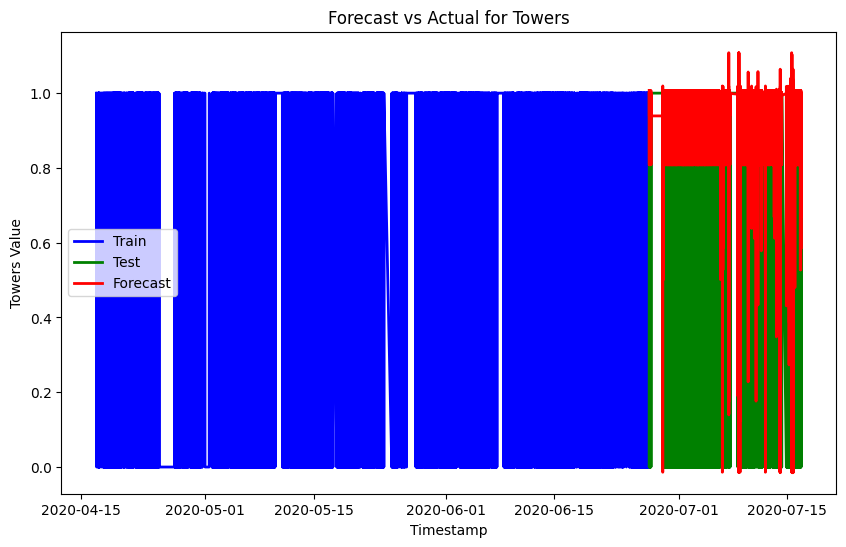

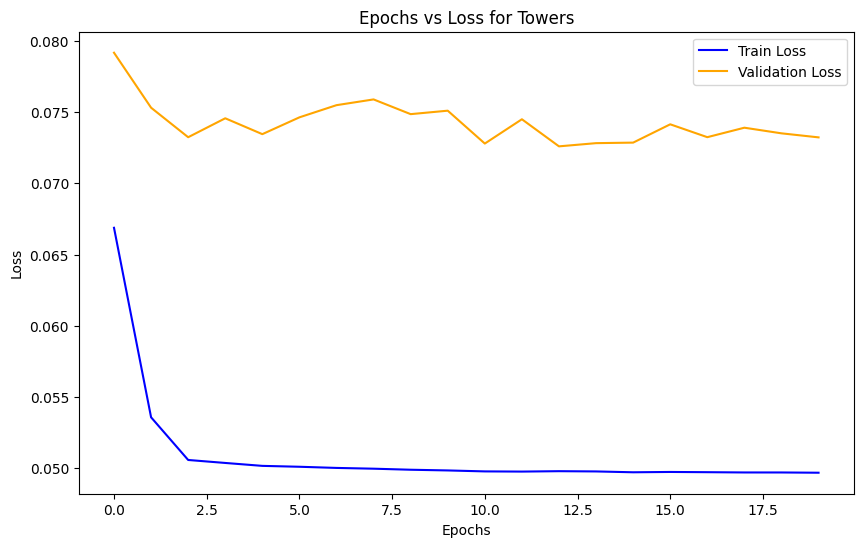

Forecasting for MPG
Epoch 1/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 23s 7ms/step - loss: 0.0802 - val_loss: 0.0730
Epoch 2/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 19s 7ms/step - loss: 0.0489 - val_loss: 0.0725
Epoch 3/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 19s 7ms/step - loss: 0.0477 - val_loss: 0.0707
Epoch 4/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 19s 7ms/step - loss: 0.0486 - val_loss: 0.0730
Epoch 5/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 19s 7ms/step - loss: 0.0473 - val_loss: 0.0710
Epoch 6/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 20s 8ms/step - loss: 0.0474 - val_loss: 0.0707
Epoch 7/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 19s 7ms/step - loss: 0.0479 - val_loss: 0.0712
Epoch 8/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 20s 8ms/step - loss: 0.0472 - val_loss: 0.0708
Epoch 9/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 20s 7ms/step - loss: 0.0467 - val_loss: 0.0709
Epoch 10/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 19s 7ms/step - loss: 0.0471 - val_loss: 0.0709
Epoch 11/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 21s 7ms/step - loss: 0.0469 - val_loss: 0.0718

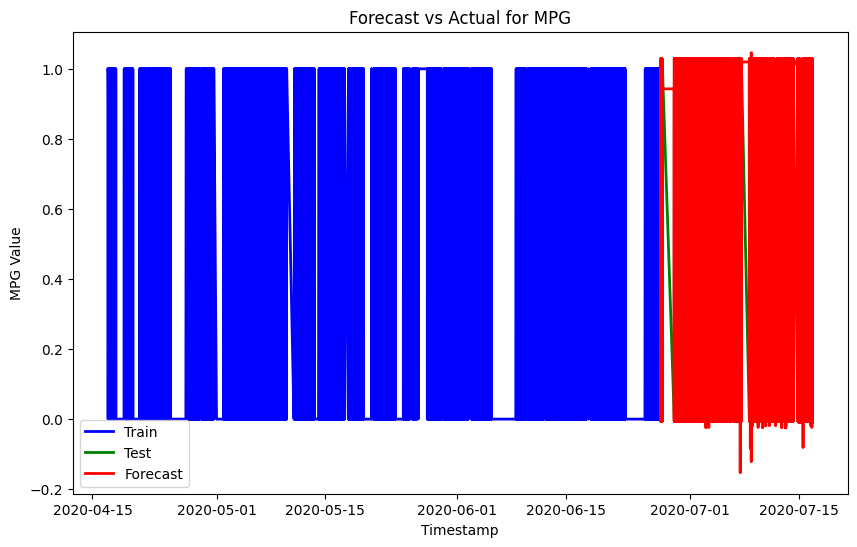

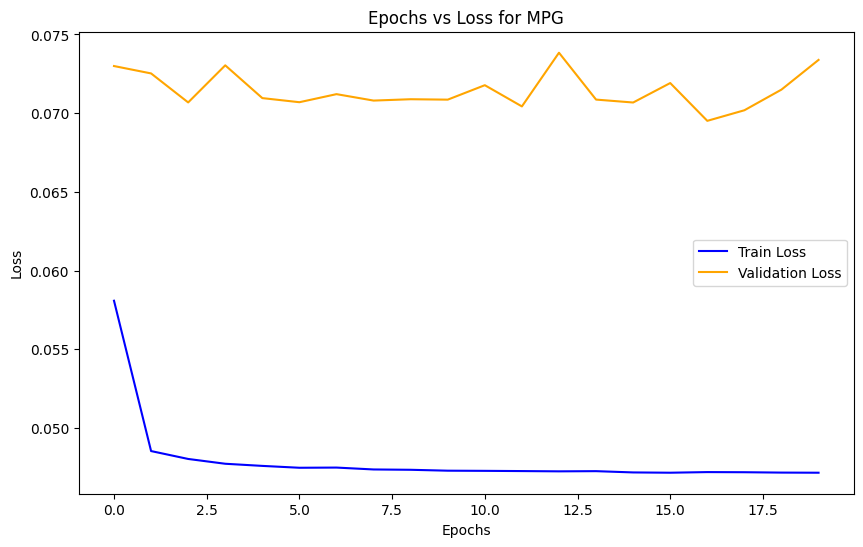

Forecasting for LPS
Epoch 1/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 23s 7ms/step - loss: 0.0020 - val_loss: 0.0022
Epoch 2/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 19s 7ms/step - loss: 0.0011 - val_loss: 0.0021
Epoch 3/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 19s 7ms/step - loss: 0.0011 - val_loss: 0.0019
Epoch 4/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 21s 7ms/step - loss: 8.5893e-04 - val_loss: 0.0018
Epoch 5/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 19s 7ms/step - loss: 0.0011 - val_loss: 0.0018
Epoch 6/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 27s 10ms/step - loss: 8.6391e-04 - val_loss: 0.0019
Epoch 7/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 21s 8ms/step - loss: 9.7285e-04 - val_loss: 0.0022
Epoch 8/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 20s 8ms/step - loss: 9.7297e-04 - val_loss: 0.0019
Epoch 9/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 19s 7ms/step - loss: 0.0011 - val_loss: 0.0020
Epoch 10/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 19s 7ms/step - loss: 0.0010 - val_loss: 0.0018
Epoch 11/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 19s 7ms/step - loss: 0.0011 -

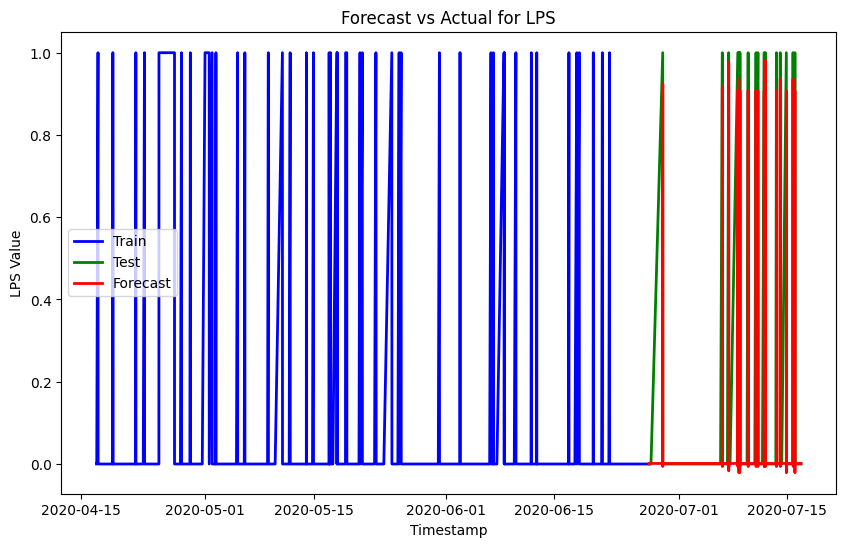

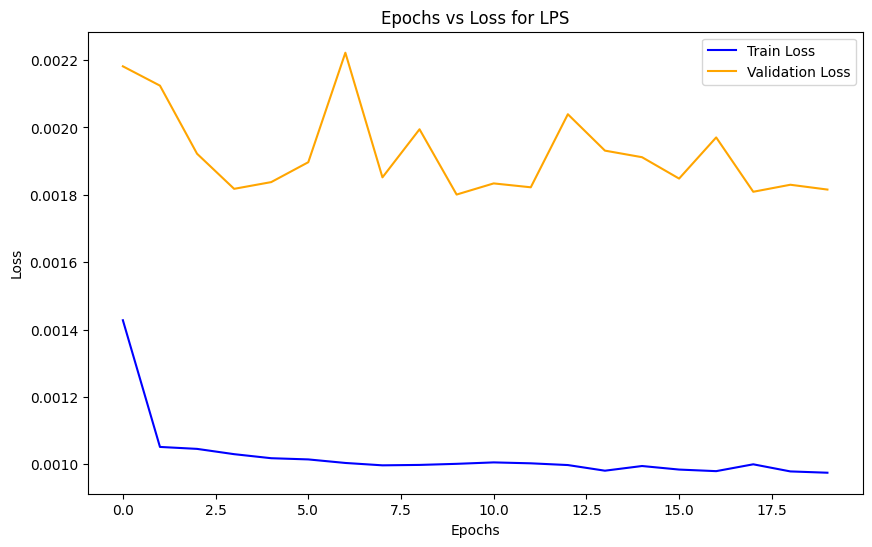

Forecasting for Pressure_switch
Epoch 1/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 21s 7ms/step - loss: 0.0100 - val_loss: 1.9256e-05
Epoch 2/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 18s 7ms/step - loss: 0.0011 - val_loss: 3.8725e-05
Epoch 3/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 18s 7ms/step - loss: 9.5783e-04 - val_loss: 4.4006e-05
Epoch 4/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 18s 7ms/step - loss: 7.7754e-04 - val_loss: 6.8840e-09
Epoch 5/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 19s 7ms/step - loss: 9.6466e-04 - val_loss: 1.4704e-06
Epoch 6/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 18s 7ms/step - loss: 6.8741e-04 - val_loss: 2.8196e-04
Epoch 7/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 18s 7ms/step - loss: 8.9739e-04 - val_loss: 3.6327e-07
Epoch 8/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 18s 7ms/step - loss: 6.6224e-04 - val_loss: 2.5175e-08
Epoch 9/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 18s 7ms/step - loss: 8.5040e-04 - val_loss: 9.9738e-05
Epoch 10/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 18s 7ms/step - loss: 8.5390e-04 - val_loss: 1.6592e-05
Epoch

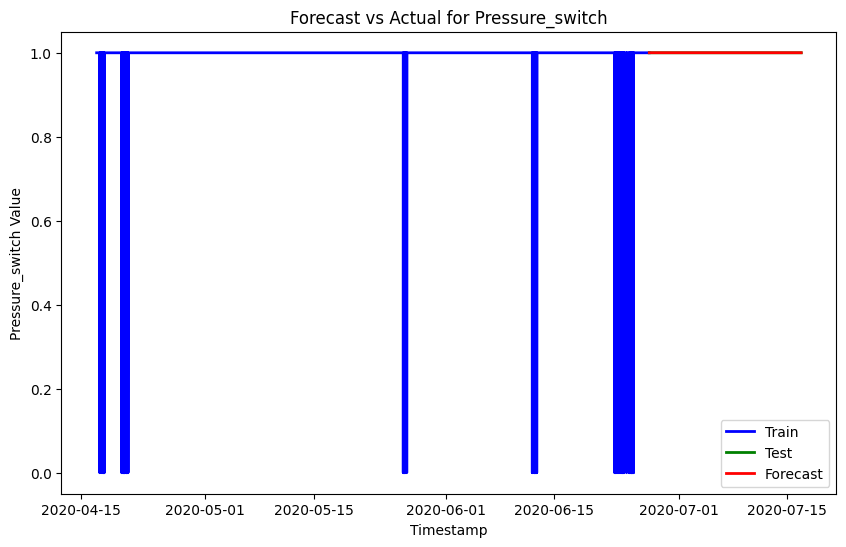

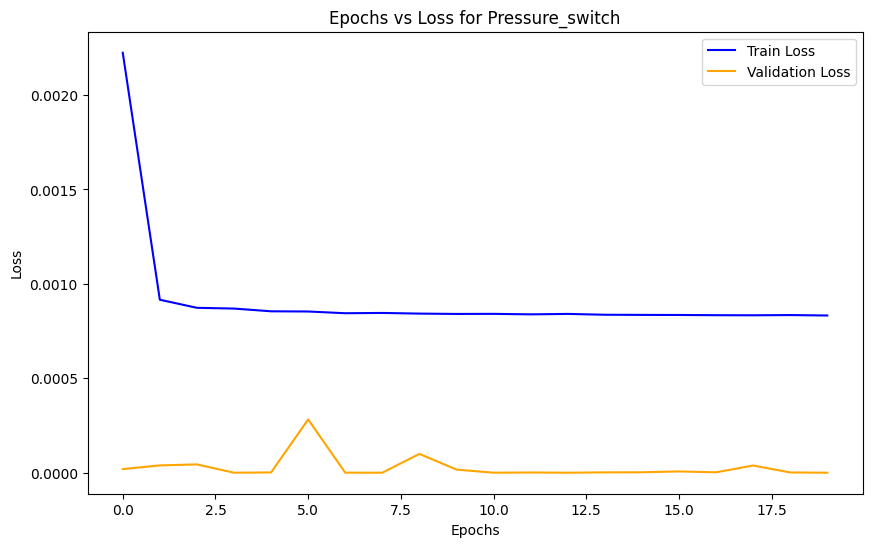

Forecasting for Oil_level
Epoch 1/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 21s 7ms/step - loss: 0.0121 - val_loss: 4.0344e-04
Epoch 2/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 18s 7ms/step - loss: 7.6908e-04 - val_loss: 4.0701e-04
Epoch 3/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 18s 7ms/step - loss: 6.9292e-04 - val_loss: 3.9686e-04
Epoch 4/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 18s 7ms/step - loss: 7.1085e-04 - val_loss: 3.0739e-04
Epoch 5/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 19s 7ms/step - loss: 7.2620e-04 - val_loss: 2.3907e-04
Epoch 6/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 21s 7ms/step - loss: 7.5790e-04 - val_loss: 2.8477e-04
Epoch 7/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 19s 7ms/step - loss: 6.1749e-04 - val_loss: 2.0447e-04
Epoch 8/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 21s 7ms/step - loss: 7.7042e-04 - val_loss: 1.9558e-04
Epoch 9/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 21s 7ms/step - loss: 6.7626e-04 - val_loss: 4.0067e-04
Epoch 10/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 19s 7ms/step - loss: 6.3854e-04 - val_loss: 1.4472e-04
Epoch 1

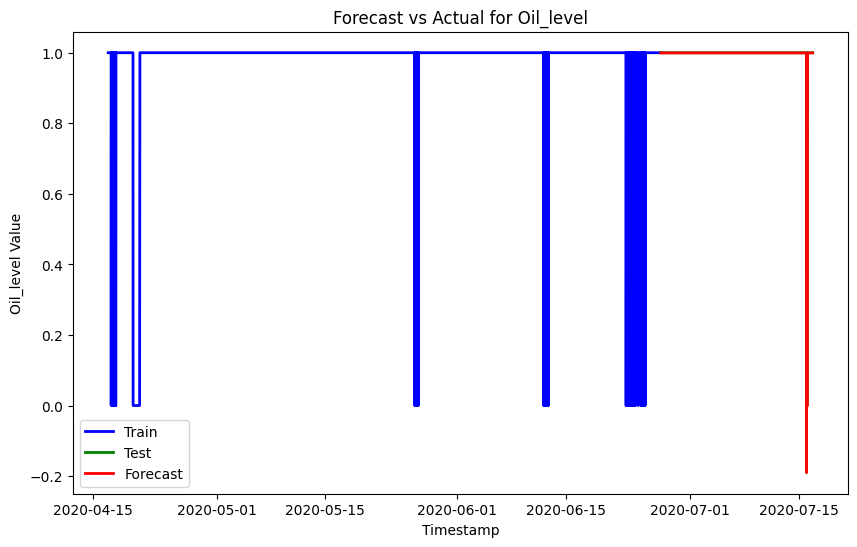

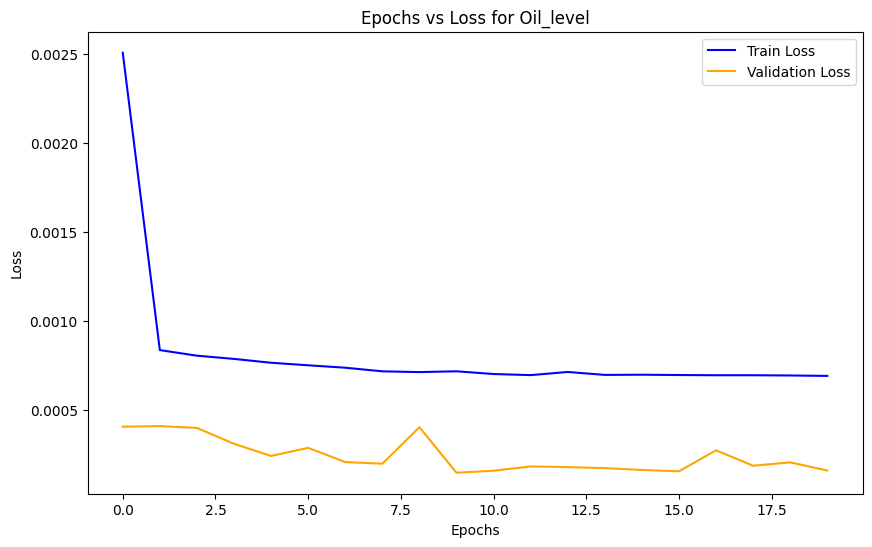

Forecasting for Caudal_impulses
Epoch 1/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 22s 7ms/step - loss: 0.0138 - val_loss: 1.3427e-05
Epoch 2/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 20s 7ms/step - loss: 9.3372e-04 - val_loss: 1.7810e-06
Epoch 3/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 19s 7ms/step - loss: 8.6600e-04 - val_loss: 3.9235e-06
Epoch 4/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 18s 7ms/step - loss: 6.1166e-04 - val_loss: 1.2784e-05
Epoch 5/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 18s 7ms/step - loss: 7.4504e-04 - val_loss: 1.9506e-04
Epoch 6/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 18s 7ms/step - loss: 7.3398e-04 - val_loss: 1.3708e-06
Epoch 7/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 18s 7ms/step - loss: 8.3714e-04 - val_loss: 4.2931e-06
Epoch 8/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 20s 7ms/step - loss: 9.2313e-04 - val_loss: 1.4468e-08
Epoch 9/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 18s 7ms/step - loss: 6.0548e-04 - val_loss: 3.7984e-07
Epoch 10/20
2626/2626 ━━━━━━━━━━━━━━━━━━━━ 21s 7ms/step - loss: 6.7120e-04 - val_loss: 4.6865e-08
E

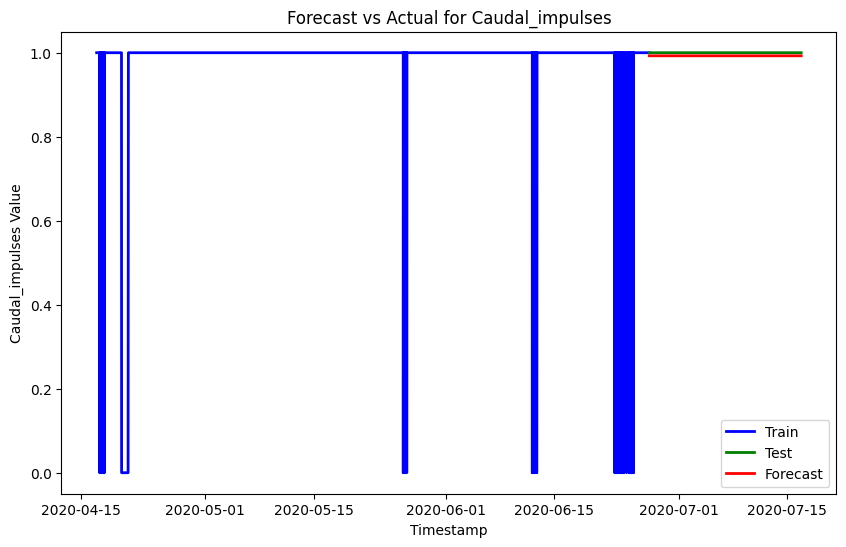

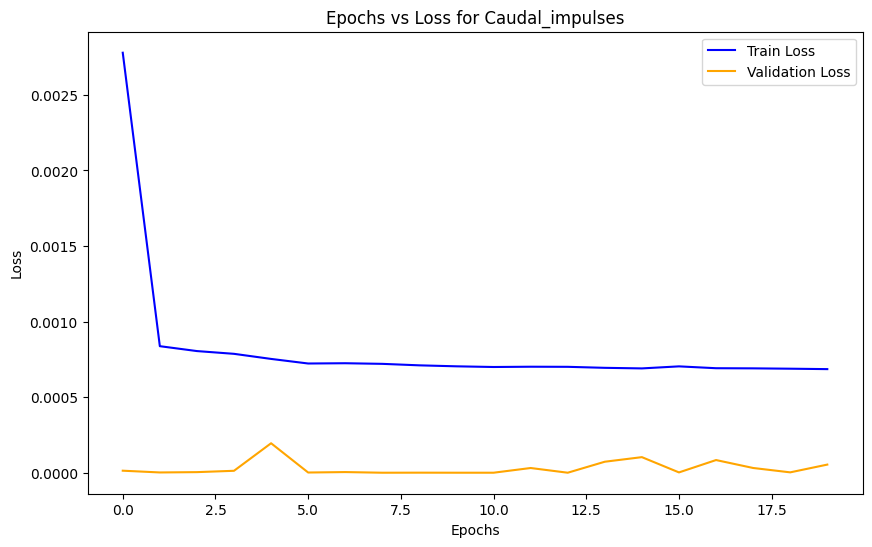

In [14]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error
import matplotlib.pyplot as plt

# Step 1: Preprocess the Data
def preprocess_data(df, var, time_steps=10):
    # Scale the data using MinMaxScaler
    scaler = MinMaxScaler(feature_range=(0, 1))
    scaled_data = scaler.fit_transform(df[var].values.reshape(-1, 1))
    
    # Create sequences
    X, y = [], []
    for i in range(time_steps, len(scaled_data)):
        X.append(scaled_data[i-time_steps:i, 0])
        y.append(scaled_data[i, 0])
        
    X, y = np.array(X), np.array(y)
    return X, y, scaler

# Step 2: Build the LSTM Model (No changes here)
def build_lstm_model(input_shape):
    model = Sequential()
    model.add(LSTM(units=50, return_sequences=True, input_shape=(input_shape[1], 1)))
    model.add(LSTM(units=50))
    model.add(Dense(1))
    
    model.compile(optimizer='adam', loss='mean_squared_error')
    return model

# Step 3: Train and Forecast with Loss Tracking
def train_and_forecast(df, var, time_steps=10, epochs=10, batch_size=32):
    X, y, scaler = preprocess_data(df, var, time_steps)
    
    # Reshape X for LSTM (samples, time steps, features)
    X = np.reshape(X, (X.shape[0], X.shape[1], 1))
    
    # Train-Test Split
    split = int(0.8 * len(X))
    X_train, X_test = X[:split], X[split:]
    y_train, y_test = y[:split], y[split:]
    
    # Build and train the LSTM model
    model = build_lstm_model(X_train.shape)
    history = model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, 
                        validation_data=(X_test, y_test), verbose=1)
    
    # Make predictions on the training and testing sets
    y_pred_train = model.predict(X_train)
    y_pred_test = model.predict(X_test)
    
    # Inverse transform the predictions and actual values
    y_train_inv = scaler.inverse_transform(y_train.reshape(-1, 1))
    y_test_inv = scaler.inverse_transform(y_test.reshape(-1, 1))
    y_pred_train_inv = scaler.inverse_transform(y_pred_train)
    y_pred_test_inv = scaler.inverse_transform(y_pred_test)
    
    # Construct DataFrames for plotting and validation
    train_df = df.iloc[:split]
    test_df = df.iloc[split + time_steps:]
    
    # Only use predictions on the test set for validation
    pred_df = pd.DataFrame(data={f'{var}_Forecast': y_pred_test_inv.flatten()}, index=test_df.index)
    
    return train_df, test_df, pred_df, history

# Step 4: Plot and Validate with Loss Plot
def plot_and_validate_with_loss(train_df, test_df, pred_df, history, var):
    # Plot the Train data with the timestamp (x-axis)
    plt.figure(figsize=(10, 6))
    plt.plot(train_df.index, train_df[var], label='Train', linewidth=2, color='blue')

    # Plot the Test data with the timestamp (x-axis)
    plt.plot(test_df.index, test_df[var], label='Test', linewidth=2, color='green')

    # Plot the Forecast data with the timestamp (x-axis)
    plt.plot(pred_df.index, pred_df[f'{var}_Forecast'], label='Forecast', linewidth=2, color='red')

    # Validate predictions (error metrics)
    validate(test_df, pred_df, var)

    # Set the title and labels for the axes
    plt.title(f"Forecast vs Actual for {var}")
    plt.xlabel("Timestamp")
    plt.ylabel(f"{var} Value")

    # Add a legend
    plt.legend()

    # Show the plot
    plt.show()

    # Plot the loss curves
    plt.figure(figsize=(10, 6))
    plt.plot(history.history['loss'], label='Train Loss', color='blue')
    plt.plot(history.history['val_loss'], label='Validation Loss', color='orange')
    plt.title(f"Epochs vs Loss for {var}")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.legend()
    plt.show()

# Step 5: Forecast and Plot for Each Variable
def forecast_and_plot(df, var):
    train_df, test_df, pred_df, history = train_and_forecast(df, var, time_steps=10, epochs=20, batch_size=32)
    plot_and_validate_with_loss(train_df, test_df, pred_df, history, var)

# Step 6: Apply Forecasting for Each Variable
variables = ['TP2', 'TP3', 'H1', 'DV_pressure', 'Reservoirs', 'Oil_temperature', 'Motor_current', 'DV_eletric', 
             'COMP', 'Towers', 'MPG', 'LPS', 'Pressure_switch', 'Oil_level', 'Caudal_impulses']

for var in variables:
    print(f"Forecasting for {var}")
    forecast_and_plot(df, var)


# <h1> Conlusion 

| Column            | Best Model | MSE   | RMSE  | MAE   | MAPE                    |
|-------------------|------------|-------|-------|-------|-------------------------|
| TP2               | LSTM       | 1.864 | 1.365 | 0.587 | 18.288                  |
| TP3               | LSTM       | 0.047 | 0.218 | 0.112 | 0.014                   |
| H1                | LSTM       | 1.267 | 1.126 | 0.497 | 1430109564830.213       |
| DV_pressure       | Auto ARIMA | 0.004 | 0.064 | 0.022 | 719.823                 |
| Reservoirs        | Auto ARIMA | 0.420 | 0.648 | 0.515 | 0.060                   |
| Oil_temperature   | VAR        | 28.030| 5.294 | 4.057 | 0.059                   |
| Motor_current     | Auto ARIMA | 5.597 | 2.366 | 2.217 | 19.698                  |
| DV_eletric        | Prophet    | 0.528 | 0.727 | 0.588 | 191940866951453.500     |
| COMP              | Prophet    | 0.502 | 0.709 | 0.563 | 324037928785191.562     |
| Towers            | Prophet    | 0.152 | 0.389 | 0.270 | 317862224582312.188     |
| MPG               | Prophet    | 0.532 | 0.729 | 0.586 | 439764508978441.062     |
| LPS               | LSTM       | 0.002 | 0.043 | 0.004 | 10303723606661.752      |
| Pressure_switch   | Auto ARIMA | 0.001 | 0.030 | 0.001 | 3999063338386.181       |
| Oil_level         | LSTM       | 0.000 | 0.013 | 0.001 | 643367453058.828        |
| Caudal_impulses   | LSTM       | 0.000 | 0.007 | 0.007 | 0.007                   |


# LSTM for TP2 TP3 H1 LPS Oil_Level Caudal_impulses

In [10]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator

# Assuming your data is in a DataFrame 'df' with columns 'TP2', 'TP3', 'H1', 'LPS', 'Oil_level', 'Caudal_impulses'
columns = ['TP2', 'TP3', 'H1', 'LPS', 'Oil_level', 'Caudal_impulses']
data = df[columns]

# Step 1: Normalize the data
scaler = MinMaxScaler(feature_range=(0, 1))
scaled_data = scaler.fit_transform(data)

# Step 2: Split the data into training and validation sets
train_size = int(len(scaled_data) * 0.8)  # 80% for training, 20% for validation
train_data = scaled_data[:train_size]
val_data = scaled_data[train_size:]

# Step 3: Use TimeseriesGenerator to create sequences for LSTM
time_step = 60  # Number of time steps to use (can be adjusted)
batch_size = 32  # Size of each batch (adjust based on your system capacity)

# Create generator for training and validation
train_generator = TimeseriesGenerator(train_data, train_data, length=time_step, batch_size=batch_size)
val_generator = TimeseriesGenerator(val_data, val_data, length=time_step, batch_size=batch_size)

# Step 4: Build LSTM model
model = Sequential()
model.add(LSTM(50, return_sequences=True, input_shape=(time_step, len(columns))))
model.add(LSTM(50, return_sequences=False))
model.add(Dense(len(columns)))  # Output layer to predict all columns

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')

# Step 5: Train the model with validation generator
model.fit(train_generator, validation_data=val_generator, epochs=5, verbose=1)

# Step 6: Forecasting
# Use the last 'time_step' data points from the scaled data as the input for forecasting
forecast_input = scaled_data[-time_step:]

# Forecast future steps (e.g., next 10 time steps)
num_steps_to_forecast = 10
forecast = []

for i in range(num_steps_to_forecast):
    predicted = model.predict(forecast_input.reshape(1, time_step, len(columns)))
    forecast.append(predicted[0])
    forecast_input = np.append(forecast_input[1:], predicted, axis=0)  # Update input with new forecast

# Inverse transform to get actual values
forecast = np.array(forecast)
forecast_inversed = scaler.inverse_transform(forecast)

# Step 7: Create a new DataFrame for the forecasted data
forecast_df = pd.DataFrame(forecast_inversed, columns=columns)

# Step 8: Add next timestamps as the index of the forecast_df
# Assuming your original DataFrame 'df' has a datetime index
last_timestamp = df.index[-1]

# Infer frequency or set default (e.g., minute frequency)
if df.index.freq is None:
    inferred_freq = pd.infer_freq(df.index)
    if inferred_freq is None:
        # If unable to infer, assume minute frequency as default
        inferred_freq = 'T'  # 'T' stands for minute frequency
else:
    inferred_freq = df.index.freq

# Generate the next timestamps using inferred or default frequency
forecast_index = pd.date_range(start=last_timestamp, periods=num_steps_to_forecast + 1, freq=inferred_freq)[1:]

# Assign the forecast index to the forecast_df
forecast_df.index = forecast_index

# Display forecasted values with timestamps
print(forecast_df)


Epoch 1/5
2625/2625 ━━━━━━━━━━━━━━━━━━━━ 114s 41ms/step - loss: 0.0284 - val_loss: 0.0096
Epoch 2/5
2625/2625 ━━━━━━━━━━━━━━━━━━━━ 119s 45ms/step - loss: 0.0062 - val_loss: 0.0075
Epoch 3/5
2625/2625 ━━━━━━━━━━━━━━━━━━━━ 122s 46ms/step - loss: 0.0054 - val_loss: 0.0070
Epoch 4/5
2625/2625 ━━━━━━━━━━━━━━━━━━━━ 119s 45ms/step - loss: 0.0042 - val_loss: 0.0064
Epoch 5/5
2625/2625 ━━━━━━━━━━━━━━━━━━━━ 130s 49ms/step - loss: 0.0039 - val_loss: 0.0055
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
                          TP2       TP3        H1       LPS  Oil_level  \
2020-07-16 19:01:00  0.339046  9.446401  9.055025  0.019601   1.001050   
2020-07-16 19:02:00  

In [14]:
import pandas as pd
from statsmodels.tsa.statespace.sarimax import SARIMAX

# Assuming 'train' is your training DataFrame and 'forecast_df' is where you want to store results
forecast_df = pd.DataFrame()

# Define the model configurations
model_configs = {
    'DV_pressure': (4, 0, 4, 0, 0, 0),
    'Reservoirs': (2, 0, 4, 0, 0, 0),
    'Motor_current': (3, 0, 5, 0, 0, 0),
    'Pressure_switch': (0, 0, 0, 0, 0, 0),
}

# Forecasting parameters
num_steps_to_forecast = 10  # Set the number of steps you want to forecast

# Iterate over the specified columns and fit the models
for col, params in model_configs.items():
    p, d, q, P, D, Q = params
    print("-----*-----*-----*-----*-----*-----*------*-----*-----*-----*-----*-----*-----*-----*-----*-----*-----*-----*-----*")
    print(f"\nFitting SARIMAX for {col} with parameters (p={p}, d={d}, q={q}, P={P}, D={D}, Q={Q})...")
    
    # Fit the SARIMAX model
    model = SARIMAX(train[col], 
                    order=(p, d, q), 
                    seasonal_order=(P, D, Q, 0),  # 0 means no seasonal component
                    enforce_stationarity=False,
                    enforce_invertibility=False).fit(disp=False)
    
    # Forecast the next values
    forecast = model.forecast(steps=num_steps_to_forecast)

    # Store the forecasted values in the forecast_df DataFrame
    forecast_df[col] = forecast  # Add forecasted values as a new column in forecast_df

    # Print model summary for each column
    print(f"\nSummary for {col}:")
    print(model.summary())

# Display the updated forecast_df with the new forecasted columns
print("\nForecasted Values:")
print(forecast_df)


-----*-----*-----*-----*-----*-----*------*-----*-----*-----*-----*-----*-----*-----*-----*-----*-----*-----*-----*

Fitting SARIMAX for DV_pressure with parameters (p=4, d=0, q=4, P=0, D=0, Q=0)...

Summary for DV_pressure:
                               SARIMAX Results                                
Dep. Variable:            DV_pressure   No. Observations:                73535
Model:               SARIMAX(4, 0, 4)   Log Likelihood               77422.650
Date:                Tue, 29 Oct 2024   AIC                        -154827.301
Time:                        17:10:23   BIC                        -154744.452
Sample:                             0   HQIC                       -154801.806
                              - 73535                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------

In [20]:
var_data = df.drop(columns=['status'])

In [21]:
model = VAR(var_data)
results = model.fit(maxlags=20, ic='aic')  # Using AIC for lag order selection
print(results.summary())


  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Tue, 29, Oct, 2024
Time:                     17:42:41
--------------------------------------------------------------------
No. of Equations:         15.0000    BIC:                   -87.8247
Nobs:                     105030.    HQIC:                  -88.1112
Log likelihood:       2.40275e+06    FPE:                4.78319e-39
AIC:                     -88.2357    Det(Omega_mle):     4.58221e-39
--------------------------------------------------------------------
Results for equation TP2
                         coefficient       std. error           t-stat            prob
--------------------------------------------------------------------------------------
const                       4.667738         0.710244            6.572           0.000
L1.TP2                     -1.408763         0.019676          -71.600           0.000
L1.TP3                    -86.552754  

In [23]:
# Number of steps to forecast (same as the length of your test set)
n_forecast = 10

# Forecast the values for the test set (after training data ends)
forecasted_values = results.forecast(y=train.iloc[:, :15].values, steps=n_forecast)

# Optional: If you want to generate confidence intervals, use `forecast_interval`
# Here we are setting alpha=0.05 for 95% confidence intervals
forecast_values, lower_bounds, upper_bounds = results.forecast_interval(y=train.iloc[:, :15].values, steps=n_forecast, alpha=0.05)

# Ensure that the forecasted DataFrame contains only the columns that were used for the VAR model (excluding 'status')
forecasted_df = pd.DataFrame(forecasted_values, index=test.index, columns=test.drop(columns=['status']).columns)



ValueError: Shape of passed values is (10, 15), indices imply (31515, 15)

In [24]:
var_data = df.drop(columns=['status'])
model = VAR(var_data)
results = model.fit(maxlags=20, ic='aic')  # Using AIC for lag order selection
print(results.summary())

# Number of steps to forecast (same as the length of your test set)
n_forecast = 10

# Forecast the values for the test set (after training data ends)
forecasted_values = results.forecast(y=train.iloc[:, :15].values, steps=n_forecast)

# Create a DataFrame for the forecasted values
# Here we set the index to a new range of the forecasted length
forecasted_df = pd.DataFrame(forecasted_values, index=test.index[:n_forecast], columns=test.drop(columns=['status']).columns)

# Display the forecasted DataFrame
print(forecasted_df)


  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Tue, 29, Oct, 2024
Time:                     17:46:48
--------------------------------------------------------------------
No. of Equations:         15.0000    BIC:                   -87.8247
Nobs:                     105030.    HQIC:                  -88.1112
Log likelihood:       2.40275e+06    FPE:                4.78319e-39
AIC:                     -88.2357    Det(Omega_mle):     4.58221e-39
--------------------------------------------------------------------
Results for equation TP2
                         coefficient       std. error           t-stat            prob
--------------------------------------------------------------------------------------
const                       4.667738         0.710244            6.572           0.000
L1.TP2                     -1.408763         0.019676          -71.600           0.000
L1.TP3                    -86.552754  

In [25]:
# Dropping 'status' column from the data
var_data = df.drop(columns=['status'])

# Fit the VAR model
model = VAR(var_data)
results = model.fit(maxlags=20, ic='aic')  # Using AIC for lag order selection
print(results.summary())

# Number of steps to forecast (same as the length of your test set)
n_forecast = 10

# Forecast the values for the test set (after training data ends)
forecasted_values = results.forecast(y=train.iloc[:, :15].values, steps=n_forecast)

# Extract only 'Oil_temperature' forecasted values
oil_temperature_forecast = forecasted_values[:, var_data.columns.get_loc('Oil_temperature')]

# Create a DataFrame for the Oil_temperature forecasted values
forecasted_df = pd.DataFrame(oil_temperature_forecast, index=test.index[:n_forecast], columns=['Oil_temperature_Forecast'])

# Display the forecasted DataFrame
print(forecasted_df)


  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Tue, 29, Oct, 2024
Time:                     17:48:15
--------------------------------------------------------------------
No. of Equations:         15.0000    BIC:                   -87.8247
Nobs:                     105030.    HQIC:                  -88.1112
Log likelihood:       2.40275e+06    FPE:                4.78319e-39
AIC:                     -88.2357    Det(Omega_mle):     4.58221e-39
--------------------------------------------------------------------
Results for equation TP2
                         coefficient       std. error           t-stat            prob
--------------------------------------------------------------------------------------
const                       4.667738         0.710244            6.572           0.000
L1.TP2                     -1.408763         0.019676          -71.600           0.000
L1.TP3                    -86.552754  

In [28]:
import pandas as pd
import matplotlib.pyplot as plt
from prophet import Prophet

# Load your data
df1 = pd.read_csv("labeled_data.csv", index_col=0, parse_dates=True)

# Ensure 'ds' (timestamp) is set as the datetime index
df1['ds'] = df1.index  # Set the 'ds' column as the datetime index for Prophet

# Columns to apply Prophet on
columns_to_forecast = ['DV_eletric', 'COMP', 'Towers', 'MPG']

# Split data into train and test sets
train_size = int(len(df1) * 0.8)

# Initialize an empty DataFrame to store forecasted values
forecasted_df = pd.DataFrame()

# Iterate over the selected columns and apply Prophet
for column in columns_to_forecast:
    print(f"Processing column: {column}")
    
    # Create a temporary DataFrame for Prophet, ensuring 'ds' is included
    temp_df = df1[['ds', column]].rename(columns={column: 'y'})  # Prophet expects 'y' as target
    
    # Split into train and test for the specific column
    train = temp_df[:train_size]
    test = temp_df[train_size:]
    
    # Fit the model for the current column
    model = Prophet()
    model.fit(train)
    
    # Create future DataFrame for predictions
    future = model.make_future_dataframe(periods=10, freq='T', include_history=False)
    
    # Generate predictions
    forecast = model.predict(future)
    
    # Prepare forecast DataFrame for validation
    forecast_df = forecast[['ds', 'yhat']].rename(columns={'yhat': f'{column}_Forecast'})
    forecast_df.set_index('ds', inplace=True)
    
    # Merge forecast with test data
    pred_df = test.join(forecast_df, how='outer')
    
    # Store the forecasted values in forecasted_df DataFrame
    forecasted_df = pd.concat([forecasted_df, forecast_df], axis=1)

# Display the final forecasted_df containing forecasted values for all columns
print(forecasted_df)


Processing column: DV_eletric


19:39:48 - cmdstanpy - INFO - Chain [1] start processing
19:42:08 - cmdstanpy - INFO - Chain [1] done processing


Processing column: COMP


19:42:14 - cmdstanpy - INFO - Chain [1] start processing
19:44:08 - cmdstanpy - INFO - Chain [1] done processing


Processing column: Towers


19:44:14 - cmdstanpy - INFO - Chain [1] start processing
19:45:32 - cmdstanpy - INFO - Chain [1] done processing


Processing column: MPG


19:45:34 - cmdstanpy - INFO - Chain [1] start processing
19:48:20 - cmdstanpy - INFO - Chain [1] done processing


                     DV_eletric_Forecast  COMP_Forecast  Towers_Forecast  \
ds                                                                         
2020-06-27 05:14:00             0.616044       0.367228         0.870416   
2020-06-27 05:15:00             0.616088       0.367292         0.870427   
2020-06-27 05:16:00             0.616131       0.367355         0.870438   
2020-06-27 05:17:00             0.616173       0.367419         0.870450   
2020-06-27 05:18:00             0.616216       0.367482         0.870462   
2020-06-27 05:19:00             0.616258       0.367545         0.870474   
2020-06-27 05:20:00             0.616299       0.367608         0.870487   
2020-06-27 05:21:00             0.616340       0.367670         0.870499   
2020-06-27 05:22:00             0.616380       0.367732         0.870512   
2020-06-27 05:23:00             0.616420       0.367793         0.870525   

                     MPG_Forecast  
ds                                 
2020-06-27 05:1